# Import

In [ ]:
import sys
import importlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
import seaborn as sns
from matplotlib.colors import ListedColormap

sys.path.append('./src')
import KGBN

network_file = '../input_files/Palma2021.txt' # contains the phenotype nodes
network_file_no_phenotype = '../input_files/Palma2021_no_phenotype.txt' # no phenotype nodes

drugs = [
"Venetoclax",
"Entospletinib",
"Ibrutinib",
"Trametinib",
# "Gilteritinib",
"Selumetinib",
"Midostaurin",
# "Ivosidenib",
# "Enasidenib"
]

drug2target = {
    'Venetoclax': ['BCL2'], 
    'Ibrutinib': ['BTK'], 
    'Entospletinib': ['SYK'],
    'Trametinib': ['MAP2K1','MAP2K2'],
    'Selumetinib': ['MAP2K1','MAP2K2'],
    'Midostaurin': ['FLT3','KIT'],
    }

# AUC by mutation profile with mean ± s.d. boxes (Train vs Test), with ANOVA p-values shown, and 'combined' mode option
from scipy.stats import f_oneway

def AUC_by_mutation_profile(df_plot, combined=False):
    def normalize_profile_text(p):
        if isinstance(p, (set, frozenset, list, tuple)):
            genes = sorted(map(str, p))
        else:
            s = re.sub(r'[\{\}]', '', str(p))
            genes = sorted([g.strip() for g in s.split(',') if g.strip()])
        return "+".join(genes) if genes else "None"

    # Merge cohort information
    df_plot = df_plot.copy()  # so we don't modify original
    df_plot["profile_label"] = df_plot["mutation_profile"].apply(normalize_profile_text)

    for drug in sorted(df_plot["inhibitor"].unique()):
        print(f"Drug:{drug}")
        sub = df_plot[df_plot["inhibitor"] == drug].copy()
        # Grouping function
        def get_profile_stats(data):
            return data.groupby("profile_label")['auc'].agg(['mean', 'std', 'count']).reset_index()

        all_profiles = sorted(df_plot["profile_label"].unique())

        if len(all_profiles) == 0:
            continue

        # Prepare ANOVA for each group
        def get_anova_p(data, labels=all_profiles):
            groups = [data[data['profile_label']==profile]['auc'].values for profile in labels]
            groups = [g for g in groups if len(g)>1]  # ANOVA requires n>1 per group
            if len(groups) <= 1:
                return None
            try:
                F, p = f_oneway(*groups)
                return p
            except Exception:
                return None

        if combined:
            stats = get_profile_stats(sub)
            pval = get_anova_p(sub)
            fig, ax = plt.subplots(1,1, figsize=(max(10, len(all_profiles) * 0.8), 6))
            positions = range(len(all_profiles))

            # Plot all data
            for i, profile in enumerate(all_profiles):
                profile_data = sub[sub['profile_label'] == profile]
                if len(profile_data) > 0:
                    x_jitter = np.random.normal(i, 0.08, len(profile_data))
                    ax.scatter(x_jitter, profile_data['auc'], alpha=0.5, s=25, color='steelblue')

            # Plot mean ± s.d. boxes
            for i, profile in enumerate(all_profiles):
                local_stats = stats[stats['profile_label'] == profile]
                if len(local_stats) > 0:
                    mean_val = local_stats['mean'].values[0]
                    std_val = local_stats['std'].values[0]
                    count = local_stats['count'].values[0]
                    box_width = 0.35
                    ax.add_patch(plt.Rectangle((i - box_width/2, mean_val - std_val),
                                                box_width, 2*std_val,
                                                facecolor='lightskyblue', alpha=0.4,
                                                linewidth=1.5, edgecolor='dodgerblue'))
                    ax.plot([i - box_width/2, i + box_width/2], [mean_val, mean_val],
                            color='darkblue', linewidth=2, zorder=10)
                    ax.text(i, mean_val - std_val - 3, f'n={int(count)}',
                            ha='center', va='top', fontsize=7)

            ax.set_xticks(positions)
            ax.set_xticklabels(all_profiles, rotation=45, ha='right', fontsize=8)
            ax.set_ylabel('AUC')
            ax.set_title(f'{drug} - Combined (All Cohorts)')
            ax.grid(axis='y', alpha=0.3)

            # Annotate ANOVA p-value
            if pval is not None:
                print(f'ANOVA p={pval:.2e}')
                ax.annotate(f'ANOVA p={pval:.2e}', xy=(1,1), xycoords='axes fraction',
                            xytext=(-10,-10), textcoords='offset points',
                            ha='right', va='top', fontsize=10, fontweight='bold',
                            bbox=dict(boxstyle="round,pad=0.2", fc="w", ec="none", alpha=0.7))
            plt.tight_layout()
            plt.show()
        else:
            # Split by cohort
            train_data = sub[sub['cohort'] == 'Waves1+2'].copy()
            test_data = sub[sub['cohort'] == 'Waves3+4'].copy()

            train_stats = get_profile_stats(train_data)
            test_stats = get_profile_stats(test_data)
            positions = range(len(all_profiles))

            # ANOVA
            pval_train = get_anova_p(train_data)
            pval_test = get_anova_p(test_data)

            # Plot with 2 subplots
            fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(max(10, len(all_profiles) * 0.8), 10))

            # Plot TRAIN
            for i, profile in enumerate(all_profiles):
                profile_data = train_data[train_data['profile_label'] == profile]
                if len(profile_data) > 0:
                    x_jitter = np.random.normal(i, 0.08, len(profile_data))
                    ax1.scatter(x_jitter, profile_data['auc'], alpha=0.5, s=25, color='steelblue')
            for i, profile in enumerate(all_profiles):
                stats = train_stats[train_stats['profile_label'] == profile]
                if len(stats) > 0:
                    mean_val = stats['mean'].values[0]
                    std_val = stats['std'].values[0]
                    count = stats['count'].values[0]
                    box_width = 0.35
                    ax1.add_patch(plt.Rectangle((i - box_width/2, mean_val - std_val),
                                                box_width, 2*std_val,
                                                facecolor='lightcoral', alpha=0.4,
                                                linewidth=1.5, edgecolor='coral'))
                    ax1.plot([i - box_width/2, i + box_width/2], [mean_val, mean_val],
                             color='darkred', linewidth=2, zorder=10)
                    ax1.text(i, mean_val - std_val - 3, f'n={int(count)}',
                             ha='center', va='top', fontsize=7)
            ax1.set_xticks(positions)
            ax1.set_xticklabels(all_profiles, rotation=45, ha='right', fontsize=8)
            ax1.set_ylabel('AUC')
            ax1.set_title(f'{drug} - TRAIN (Waves1+2)')
            ax1.grid(axis='y', alpha=0.3)
            # ANOVA p
            if pval_train is not None:
                ax1.annotate(f'ANOVA p={pval_train:.2e}', xy=(1,1), xycoords='axes fraction',
                             xytext=(-10,-10), textcoords='offset points',
                             ha='right', va='top', fontsize=10, fontweight='bold',
                             bbox=dict(boxstyle="round,pad=0.2", fc="w", ec="none", alpha=0.7))

            # Plot TEST
            for i, profile in enumerate(all_profiles):
                profile_data = test_data[test_data['profile_label'] == profile]
                if len(profile_data) > 0:
                    x_jitter = np.random.normal(i, 0.08, len(profile_data))
                    ax2.scatter(x_jitter, profile_data['auc'], alpha=0.5, s=25, color='steelblue')
            for i, profile in enumerate(all_profiles):
                stats = test_stats[test_stats['profile_label'] == profile]
                if len(stats) > 0:
                    mean_val = stats['mean'].values[0]
                    std_val = stats['std'].values[0]
                    count = stats['count'].values[0]
                    box_width = 0.35
                    ax2.add_patch(plt.Rectangle((i - box_width/2, mean_val - std_val),
                                                box_width, 2*std_val,
                                                facecolor='lightskyblue', alpha=0.4,
                                                linewidth=1.5, edgecolor='dodgerblue'))
                    ax2.plot([i - box_width/2, i + box_width/2], [mean_val, mean_val],
                             color='darkblue', linewidth=2, zorder=10)
                    ax2.text(i, mean_val - std_val - 3, f'n={int(count)}',
                             ha='center', va='top', fontsize=7)
            ax2.set_xticks(positions)
            ax2.set_xticklabels(all_profiles, rotation=45, ha='right', fontsize=8)
            ax2.set_xlabel('Mutation Profile')
            ax2.set_ylabel('AUC')
            ax2.set_title(f'{drug} - TEST (Waves3+4)')
            ax2.grid(axis='y', alpha=0.3)
            # ANOVA p
            if pval_test is not None:
                ax2.annotate(f'ANOVA p={pval_test:.2e}', xy=(1,1), xycoords='axes fraction',
                             xytext=(-10,-10), textcoords='offset points',
                             ha='right', va='top', fontsize=10, fontweight='bold',
                             bbox=dict(boxstyle="round,pad=0.2", fc="w", ec="none", alpha=0.7))
            plt.tight_layout()
            plt.show()

def create_experimental_data(df, cohort='Waves1+2',
                            mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'], 
                            inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib'],
                            drug2target=None,
                            gene_to_class=None,
                            output_file='beataml_experiments.csv'):
    """
    Create experimental data CSV from BeatAML drug response data.
    
    Parameters:
    - df: DataFrame with mutation_profile, inhibitor, and auc columns
    - cohort: 'Waves1+2' or 'Waves3+4' or None
    - mutation_genes: List of genes
    - inhibitors: List of drug names
    - output_file: Output CSV filename
    
    Note: Oncogenes become Stimuli, TSGs become Inhibitors based on gene_to_class
    """
    
    # Drug to target mapping
    if drug2target is None:
        drug2target = {
            'Venetoclax': ['BCL2'], 
            'Ibrutinib': ['BTK'], 
            'Entospletinib': ['SYK'],
            'Trametinib': ['MAP2K1','MAP2K2'],
            'Selumetinib': ['MAP2K1','MAP2K2'],
            'Midostaurin': ['FLT3','KIT'],
            }
    if gene_to_class is None:
        # mutation class
        classification = pd.read_csv("../input_files/Palma_class.csv")
        gene_to_class = dict(zip(classification['symbol'], classification['class']))
    # Normalize profile text for comparison
    def normalize_profile_text(p):
        if isinstance(p, (set, frozenset, list, tuple)):
            genes = sorted(map(str, p))
        else:
            s = re.sub(r'[\\{\\}]', '', str(p))
            genes = sorted([g.strip() for g in s.split(',') if g.strip()])
        return set(genes) if genes else set()
    
    df_work = df.copy()
    if cohort:
        df_work = df_work[df_work['cohort'] == cohort]
    df_work['profile_set'] = df_work['mutation_profile'].apply(normalize_profile_text)
    
    # Generate all mutation profile combinations
    from itertools import combinations
    all_profiles = []
    for r in range(len(mutation_genes) + 1):
        for combo in combinations(mutation_genes, r):
            all_profiles.append(set(combo))
    
    print(f"\\nGenerating data for {len(all_profiles)} profiles × {len(inhibitors)} drugs = {len(all_profiles) * len(inhibitors)} experiments")
    
    # Create experiment rows
    experiments = []
    exp_id = 1
    
    for profile in all_profiles:
        for drug in inhibitors:
            # Filter data for this profile and drug
            matching_data = df_work[
                (df_work['profile_set'] == profile) & 
                (df_work['inhibitor'].str.contains(drug, case=False, na=False))
            ]
            
            if len(matching_data) == 0:
                continue
            
            # Calculate average AUC
            avg_auc = matching_data['auc'].mean()
            std_auc = matching_data['auc'].std()
            n_patients = len(matching_data)
            
            # Classify genes as oncogenes or TSGs
            oncogenes = []
            tsgs = []
            
            for gene in profile:
                if gene == 'FLT3_ITD':
                    gene = 'FLT3'
                gene_class = gene_to_class.get(gene, 'unknown')
                if gene_class == 'oncogene':
                    oncogenes.append(gene)
                elif gene_class == 'TSG':
                    tsgs.append(gene)
                else:
                    print(f"Warning: Unknown classification for {gene}, treating as oncogene")
                    oncogenes.append(gene)
            
            # Oncogenes → Stimuli (activate)
            stimuli = ','.join(sorted(oncogenes)) if oncogenes else ''
            stimuli_efficacy = ','.join(['1'] * len(oncogenes)) if oncogenes else ''
            
            # TSGs + Drug target → Inhibitors (knockdown)
            target = drug2target.get(drug, '')
            if not target:
                print(f"Warning: No target mapping for {drug}, skipping...")
                continue
            
            all_inhibitors = sorted(tsgs + target)
            inhibitors_str = ','.join(all_inhibitors)
            inhibitors_efficacy = ','.join(['1'] * len(all_inhibitors))
            
            measured_nodes = 'AUC'
            measured_values = f'{avg_auc:.2f}'
            
            experiments.append({
                'Experiments': exp_id,
                'Stimuli': stimuli,
                'Stimuli_efficacy': stimuli_efficacy,
                'Inhibitors': inhibitors_str,
                'Inhibitors_efficacy': inhibitors_efficacy,
                'Measured_nodes': measured_nodes,
                'Measured_values': measured_values,
                'n_patients': n_patients,
                'std': f'{std_auc:.2f}',
                'drug': drug
            })
            
            exp_id += 1
    
    # Create DataFrame
    exp_df = pd.DataFrame(experiments)
    
    # Save to CSV
    exp_df.to_csv(output_file, index=False)
    
    print(f"\\nSaved {len(exp_df)} experiments to {output_file}")
    print(f"\\nSummary by drug:")
    print(exp_df.groupby('drug').agg({
        'n_patients': 'sum',
        'Measured_values': lambda x: f"{pd.to_numeric(x).mean():.2f}±{pd.to_numeric(x).std():.2f}"
    }).rename(columns={'Measured_values': 'Mean AUC±SD', 'n_patients': 'Total patients'}))
    
    return exp_df

In [355]:
# Read the data
mutations = pd.read_csv("https://github.com/biodev/beataml2.0_data/raw/main/beataml_wes_wv1to4_mutations_dbgap.txt", sep='\t')
clinical = pd.read_excel("https://github.com/biodev/beataml2.0_data/raw/main/beataml_wv1to4_clinical.xlsx")
classification = pd.read_csv("../input_files/Palma_class.csv")

# Process the dataset
# Merge the df based on sample id
df = pd.merge(
    left=mutations,
    right=clinical,
    left_on='dbgap_sample_id',
    right_on='dbgap_dnaseq_sample'
)
df['survivalYears'] = df['ageAtDiagnosis'] + df['overallSurvival']/365

# Add FLT3-ITD
flt3_positive_df = df[df['FLT3-ITD'] == 'positive'].copy()
flt3_positive_df['symbol'] = 'FLT3'

clinical_df = pd.concat([df, flt3_positive_df], ignore_index=True)

# Filter the mutations that would alter protein functions
df = clinical_df[
    (clinical_df['symbol'].isin(pbn.nodeDict.keys())) &
    (
        # Apply 'sift' and 'polyphen' filters 
        ((clinical_df['sift'].str.startswith('deleterious')) &
         (clinical_df['polyphen'].str.startswith(('probably_damaging', 'possibly_damaging')))
    ))
]

patient_to_mutations = df.groupby('dbgap_subject_id')['symbol'].apply(set).reset_index()
patient_to_mutations.rename(columns={'symbol': 'profile'}, inplace=True)

# Convert blast percentage to numeric, coercing errors to NaN
profile_df = df.copy()
profile_df = profile_df.merge(patient_to_mutations, on='dbgap_subject_id', how='left')
profile_df['%.Blasts.in.BM'] = pd.to_numeric(profile_df['%.Blasts.in.BM'], errors='coerce')
profile_df['%.Blasts.in.PB'] = pd.to_numeric(profile_df['%.Blasts.in.PB'], errors='coerce')

# Aggregate for each patient
profile_df = profile_df.groupby('dbgap_subject_id').agg({
    '%.Blasts.in.BM': 'mean', 
    '%.Blasts.in.PB': 'mean',
    'profile': 'first'
}).reset_index()
profile_df

,dbgap_subject_id,%.Blasts.in.BM,%.Blasts.in.PB,profile
0,2000,10.0,1.0,{FLT3}
1,2003,NaN,50.0,{FLT3}
2,2005,50.0,NaN,{TP53}
3,2007,93.0,99.0,{DNMT3A}
4,2008,17.0,5.3,{DNMT3A}
...,...,...,...,...
318,2829,50.5,53.0,{TP53}
319,2831,NaN,NaN,{FLT3}
320,2832,26.0,NaN,{DNMT3A}
321,2834,95.0,NaN,{TP53}


In [25]:
# drug_response = pd.read_csv("https://media.githubusercontent.com/media/biodev/beataml2.0_data/main/beataml_probit_curve_fits_v4_dbgap.txt", sep='\t', usecols=['inhibitor', 'dbgap_dnaseq_sample', 'auc', 'ic50'])
drug_response['inhibitor'].unique()

array(['Axitinib (AG-013736)', 'Crenolanib', 'Crizotinib (PF-2341066)',
       'Dasatinib', 'Erlotinib', 'Gefitinib', 'Ibrutinib (PCI-32765)',
       'Imatinib', 'Lapatinib', 'Nilotinib', 'Pazopanib (GW786034)',
       'Ponatinib (AP24534)', 'Quizartinib (AC220)',
       'Ruxolitinib (INCB018424)', 'Sorafenib', 'Sunitinib',
       'Bortezomib (Velcade)', 'Rapamycin', 'Vandetanib (ZD6474)',
       'AKT Inhibitor IV', 'AKT Inhibitor X', 'AMPK Inhibitor', 'AST-487',
       'AZD1152-HQPA (AZD2811)', 'Alisertib (MLN8237)', 'CYT387',
       'Canertinib (CI-1033)', 'Doramapimod (BIRB 796)',
       'Dovitinib (CHIR-258)', 'Flavopiridol', 'GDC-0941', 'GW-2580',
       'Go6976', 'H-89', 'INK-128', 'Idelalisib', 'JAK Inhibitor I',
       'JNJ-7706621', 'JNK Inhibitor II', 'KN92', 'KN93', 'LY-333531',
       'LY294002', 'Linifanib (ABT-869)', 'MEK1/2 Inhibitor',
       'Midostaurin', 'Motesanib (AMG-706)', 'NF-kB Activation Inhibitor',
       'PD153035', 'PD98059', 'PI-103', 'PP2', 'PRT062070',
  

In [26]:
# map inhibitors to their target genes
drug_target_df = pd.read_excel("https://github.com/biodev/beataml2.0_data/raw/main/beataml_drug_families.xlsx", sheet_name='drug_gene', usecols=['inhibitor', 'Symbol'])
drug_target_df = drug_target_df[drug_target_df['inhibitor'].apply(lambda x: any(drug in x for drug in drugs))].copy()
drug_target_df

,inhibitor,Symbol
68,Venetoclax,BCL2
73,Ibrutinib (PCI-32765),CSK
80,Midostaurin,TBK1
93,Midostaurin,JAK3
101,Midostaurin,MAP3K9
102,Midostaurin,MAP3K11
142,Ibrutinib (PCI-32765),BLK
145,Ibrutinib (PCI-32765),FGR
158,Ibrutinib (PCI-32765),HCK
171,Ibrutinib (PCI-32765),PTK6


# BeatAML data

This follows the exact approach from the BeatAML2 manuscript   
(see https://github.com/biodev/beataml2_manuscript/blob/main/R/preprocess.R, function `mutation.only.dataset()`):

1. Filter clinical data: Only samples with `manuscript_dnaseq == 'yes'`
2. Create binary mutation matrix: Rows = patients (ptid), Columns = genes, Values = 1 (mutation present) or 0 (absent)
3. Add consensus annotations: Override with manual annotations from clinical file for:
   - NPM1 (from NPM1 column: positive = 1)
   - FLT3_ITD (from FLT3-ITD column: positive = 1)
   - RUNX1 (from RUNX1 column: not NA = 1)
   - ASXL1 (from ASXL1 column: not NA = 1)
   - TP53 (from TP53 column: not NA = 1)

In [497]:
# BeatAML data
drug_response = pd.read_csv("https://media.githubusercontent.com/media/biodev/beataml2.0_data/main/beataml_probit_curve_fits_v4_dbgap.txt", sep='\t')
mutations = pd.read_csv("https://github.com/biodev/beataml2.0_data/raw/main/beataml_wes_wv1to4_mutations_dbgap.txt", sep='\t')
clinical = pd.read_excel("https://github.com/biodev/beataml2.0_data/raw/main/beataml_wv1to4_clinical.xlsx")

# Filter clinical data to those with DNA sequencing
dna_clin = clinical[clinical['manuscript_dnaseq'] == 'yes'].copy()

# Merge with clinical data 
dna_clin['ptid'] = 'pt' + dna_clin['dbgap_subject_id'].astype(str)
muts_merged = pd.merge(
    dna_clin[['ptid', 'dbgap_dnaseq_sample', 'cohort', 'NPM1', 'FLT3-ITD', 'RUNX1', 'ASXL1', 'TP53']],
    mutations,
    left_on='dbgap_dnaseq_sample',
    right_on='dbgap_sample_id',
    how='inner'
)
# Create binary mutation matrix (patient x gene): if a patient has any mutation in a gene, mark as 1
muts_merged['value'] = 1
mutation_matrix = muts_merged.pivot_table(
    index='ptid',
    columns='symbol',
    values='value',
    aggfunc='max',  # If multiple mutations in same gene, still just 1
    fill_value=0
)
# Add manual annotations from clinical data (NPM1, FLT3-ITD, RUNX1, ASXL1, TP53)
manual_muts = dna_clin.set_index('ptid')[['NPM1', 'FLT3-ITD', 'RUNX1', 'ASXL1', 'TP53']].copy()
manual_muts['NPM1'] = (manual_muts['NPM1'] == 'positive').astype(int)
manual_muts['FLT3_ITD'] = (manual_muts['FLT3-ITD'] == 'positive').astype(int)
manual_muts['RUNX1'] = manual_muts['RUNX1'].notna().astype(int)
manual_muts['ASXL1'] = manual_muts['ASXL1'].notna().astype(int)
manual_muts['TP53'] = manual_muts['TP53'].notna().astype(int)
manual_muts = manual_muts[['NPM1', 'FLT3_ITD', 'RUNX1', 'ASXL1', 'TP53']]

# some patients in clinical file don't have WES mutations
missing_patients = list(set(manual_muts.index) - set(mutation_matrix.index))
if missing_patients:
    missing_df = pd.DataFrame(0, index=missing_patients, columns=mutation_matrix.columns)
    mutation_matrix = pd.concat([mutation_matrix, missing_df])

# Add missing gene columns if needed
for gene in ['FLT3', 'FLT3_ITD', 'NPM1', 'RUNX1', 'ASXL1', 'TP53']:
    if gene not in mutation_matrix.columns:
        mutation_matrix[gene] = 0

# Override with consensus annotations for NPM1, RUNX1, ASXL1, TP53
# For FLT3_ITD: update the FLT3_ITD column with clinical consensus
common_patients = list(set(manual_muts.index) & set(mutation_matrix.index))
for gene in ['NPM1', 'FLT3_ITD', 'RUNX1', 'ASXL1', 'TP53']:
    mutation_matrix.loc[common_patients, gene] = manual_muts.loc[common_patients, gene]

# Keep any patient with FLT3 from WES OR FLT3_ITD from clinical
mutation_matrix['FLT3_combined'] = ((mutation_matrix['FLT3'] == 1) | (mutation_matrix['FLT3_ITD'] == 1)).astype(int)

print(f"Mutation matrix shape: {mutation_matrix.shape}")

# mutation frequencies as percentages
mut_freq = mutation_matrix.sum().sort_values(ascending=False)
mut_pct = (mut_freq / len(mutation_matrix) * 100).round(1)
print(f"\nTop 20 most frequent mutations:")
for gene, pct in mut_pct.head(20).items():
    print(f"  {gene}: {pct}%")

# dbgap_sample_id -> ptid -> mutation profile
sample_to_ptid = dna_clin[['dbgap_dnaseq_sample', 'ptid', 'dbgap_subject_id', 'cohort']].copy()
sample_to_ptid.rename(columns={'dbgap_dnaseq_sample': 'dbgap_sample_id'}, inplace=True)

Mutation matrix shape: (713, 2989)

Top 20 most frequent mutations:
  FLT3_combined: 29.7%
  NPM1: 25.8%
  FLT3_ITD: 22.4%
  DNMT3A: 21.6%
  NRAS: 14.3%
  TET2: 13.7%
  RUNX1: 13.5%
  IDH2: 13.3%
  SRSF2: 12.2%
  ASXL1: 10.8%
  TP53: 10.7%
  FLT3: 9.0%
  STAG2: 7.9%
  IDH1: 7.6%
  WT1: 7.3%
  BCOR: 5.9%
  CEBPA: 5.8%
  U2AF1: 5.3%
  KRAS: 5.0%
  PTPN11: 4.9%


In [488]:
# Create dataset with drug response and mutations
sample_mutations = {}
for ptid in mutation_matrix.index:
    mutated_genes = mutation_matrix.loc[ptid][mutation_matrix.loc[ptid] == 1].index.tolist()
    # Filter to only model genes
    # mutated_genes_in_model = [g for g in mutated_genes if g in pbn.nodeDict.keys()]
    mutated_genes_in_model = [g for g in mutated_genes if g in ['FLT3_ITD', 'NPM1', 'DNMT3A']]
    sample_mutations[ptid] = set(mutated_genes_in_model)

# Create mutation profile mapping
mutation_profiles = []
for _, row in sample_to_ptid.iterrows():
    ptid = row['ptid']
    if ptid in sample_mutations:
        mutation_profiles.append({
            'dbgap_sample_id': row['dbgap_sample_id'],
            'ptid': ptid,
            'mutation_profile': sample_mutations[ptid]
        })

mutation_profile_df = pd.DataFrame(mutation_profiles)

# Merge with drug response data
drug_response_merged = pd.merge(
    mutation_profile_df,
    drug_response,
    left_on='dbgap_sample_id',
    right_on='dbgap_dnaseq_sample',
    how='inner'
)

# Filter for selected drugs of interest
df = drug_response_merged[drug_response_merged['inhibitor'].apply(lambda x: any(drug in x for drug in drugs))].copy()

# Merge cohort information
df = pd.merge(df, sample_to_ptid[['dbgap_sample_id', 'cohort']], on='dbgap_sample_id', how='left')

print(f"dataset: {len(df)} records")
print(f"Drugs: {sorted(df['inhibitor'].unique())}")

dataset: 2383 records
Drugs: ['Entospletinib (GS-9973)', 'Ibrutinib (PCI-32765)', 'Midostaurin', 'Selumetinib (AZD6244)', 'Trametinib (GSK1120212)', 'Venetoclax']


In [489]:
df

,dbgap_sample_id,ptid,mutation_profile,dbgap_subject_id,dbgap_dnaseq_sample,dbgap_rnaseq_sample,inhibitor,type,status,paper_inclusion,...,ic10,ic25,ic50,ic75,ic90,auc,all_gt_50,all_lt_50,curve_type,cohort
0,BA3039D,pt2207,{},2207,BA3039D,NaN,Ibrutinib (PCI-32765),single-agent,train/test,True,...,10.000000,10.000000,10.000000,10.000000,10.000000,275.085653,True,False,increasing,Waves1+2
1,BA3172D,pt2751,{},2751,BA3172D,NaN,Ibrutinib (PCI-32765),single-agent,train/test,True,...,4.007967,10.000000,10.000000,10.000000,10.000000,275.704046,True,False,decreasing,Waves3+4
2,BA3172D,pt2751,{},2751,BA3172D,NaN,Midostaurin,single-agent,train/test,True,...,0.013700,0.061417,1.051243,10.000000,10.000000,168.625182,False,False,decreasing,Waves3+4
3,BA3172D,pt2751,{},2751,BA3172D,NaN,Selumetinib (AZD6244),single-agent,train/test,True,...,0.013700,0.371165,10.000000,10.000000,10.000000,212.700908,True,False,decreasing,Waves3+4
4,BA3172D,pt2751,{},2751,BA3172D,NaN,Trametinib (GSK1120212),single-agent,train/test,True,...,0.013700,0.013700,0.557860,10.000000,10.000000,147.067312,False,False,decreasing,Waves3+4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2378,BA3100D,pt2750,"{NPM1, DNMT3A}",2750,BA3100D,NaN,Ibrutinib (PCI-32765),single-agent,train/test,True,...,0.013700,0.917243,10.000000,10.000000,10.000000,218.715266,True,False,decreasing,Waves3+4
2379,BA3100D,pt2750,"{NPM1, DNMT3A}",2750,BA3100D,NaN,Midostaurin,single-agent,train/test,True,...,0.035519,10.000000,10.000000,10.000000,10.000000,271.662263,True,False,increasing,Waves3+4
2380,BA3100D,pt2750,"{NPM1, DNMT3A}",2750,BA3100D,NaN,Selumetinib (AZD6244),single-agent,train/test,True,...,10.000000,10.000000,10.000000,10.000000,10.000000,284.545522,True,False,decreasing,Waves3+4
2381,BA3100D,pt2750,"{NPM1, DNMT3A}",2750,BA3100D,NaN,Trametinib (GSK1120212),single-agent,train/test,True,...,4.394901,3.974823,3.555000,3.179523,2.875606,44.916043,False,False,increasing,Waves3+4


## Top 10 mutations

In [390]:
top10_mutations = mutation_matrix.sum().sort_values(ascending=False).head(11)
top10_mut = top10_mutations.index.drop('FLT3_combined')
top10_mut

Index(['NPM1', 'FLT3_ITD', 'DNMT3A', 'NRAS', 'TET2', 'RUNX1', 'IDH2', 'SRSF2',
       'ASXL1', 'TP53'],
      dtype='object', name='symbol')

In [391]:
# Create dataset with drug response and mutations
sample_mutations = {}
for ptid in mutation_matrix.index:
    mutated_genes = mutation_matrix.loc[ptid][mutation_matrix.loc[ptid] == 1].index.tolist()
    # Filter to only model genes
    # mutated_genes_in_model = [g for g in mutated_genes if g in pbn.nodeDict.keys()]
    mutated_genes_in_model = [g for g in mutated_genes if g in top10_mut]
    sample_mutations[ptid] = set(mutated_genes_in_model)

# Create mutation profile mapping
mutation_profiles = []
for _, row in sample_to_ptid.iterrows():
    ptid = row['ptid']
    if ptid in sample_mutations:
        mutation_profiles.append({
            'dbgap_sample_id': row['dbgap_sample_id'],
            'ptid': ptid,
            'mutation_profile': sample_mutations[ptid]
        })

mutation_profile_df = pd.DataFrame(mutation_profiles)

# Merge with drug response data
drug_response_merged = pd.merge(
    mutation_profile_df,
    drug_response,
    left_on='dbgap_sample_id',
    right_on='dbgap_dnaseq_sample',
    how='inner'
)

# Filter for selected drugs of interest
df = drug_response_merged[drug_response_merged['inhibitor'].apply(lambda x: any(drug in x for drug in drugs))].copy()

# Merge cohort information
df = pd.merge(df, sample_to_ptid[['dbgap_sample_id', 'cohort']], on='dbgap_sample_id', how='left')

print(f"dataset: {len(df)} records")
print(f"Drugs: {sorted(df['inhibitor'].unique())}")

dataset: 2383 records
Drugs: ['Entospletinib (GS-9973)', 'Ibrutinib (PCI-32765)', 'Midostaurin', 'Selumetinib (AZD6244)', 'Trametinib (GSK1120212)', 'Venetoclax']


Drug:Entospletinib (GS-9973)


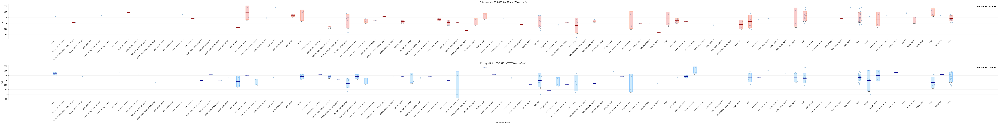

Drug:Ibrutinib (PCI-32765)


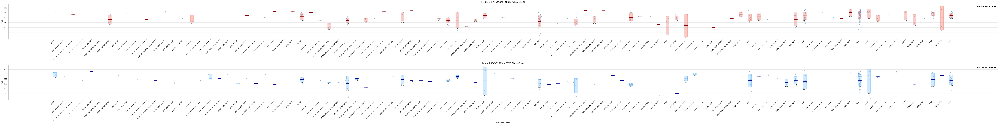

Drug:Midostaurin


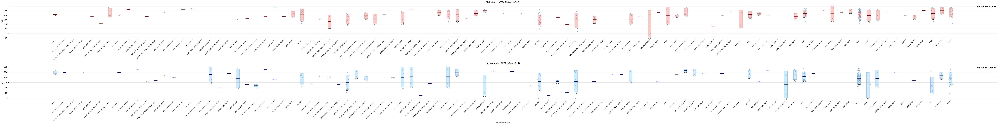

Drug:Selumetinib (AZD6244)


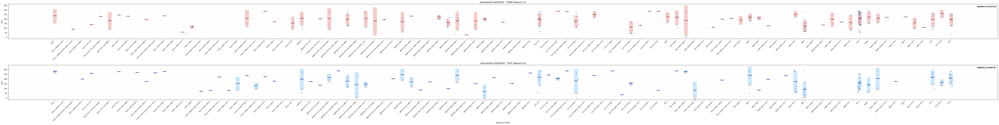

Drug:Trametinib (GSK1120212)


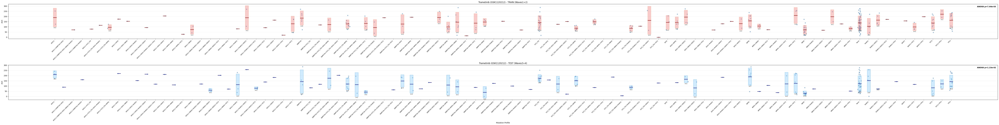

Drug:Venetoclax


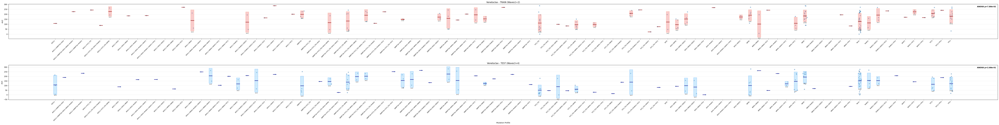

In [395]:
AUC_by_mutation_profile(df,combined=False)

In [365]:
# mutation class
classification = pd.read_csv("../input_files/Palma_class_extended.csv")
gene_to_class = dict(zip(classification['symbol'], classification['class']))
gene_to_class

{'AKT1': 'oncogene',
 'BCL2': 'oncogene',
 'CCND1': 'oncogene',
 'CDKN2A': 'TSG',
 'CEBPA': 'TSG',
 'DNMT3A': 'TSG',
 'ETV6': 'TSG',
 'FBXW7': 'TSG',
 'FLT3': 'oncogene',
 'GSK3B': 'oncogene',
 'HOXA9': 'oncogene',
 'MAPK1': 'oncogene',
 'MEIS1': 'oncogene',
 'MYC': 'oncogene',
 'NPM1': 'TSG',
 'SOX4': 'oncogene',
 'STAT5A': 'oncogene',
 'TP53': 'TSG',
 'ATM': 'TSG',
 'CDKN1B': 'TSG',
 'CYCS': 'TSG',
 'MTOR': 'oncogene',
 'NRAS': 'oncogene',
 'PIK3CA': 'oncogene',
 'ROS1': 'oncogene',
 'TET2': 'TSG',
 'RUNX1': 'TSG',
 'ASXL1': 'TSG',
 'IDH2': 'oncogene',
 'SRSF2': 'oncogene'}

In [366]:
for drug in drugs:
    exp_data = create_experimental_data(
        df, 
        cohort='Waves1+2',
        mutation_genes=top10_mut,
        inhibitors=[drug],
        gene_to_class=gene_to_class,
        output_file=f'../data/BeatAML_AUC_{drug}_Top10_Waves1+2.csv'
    )
    exp_data = create_experimental_data(
        df, 
        cohort='Waves3+4',
        mutation_genes=top10_mut,
        inhibitors=[drug],
        gene_to_class=gene_to_class,
        output_file=f'../data/BeatAML_AUC_{drug}_Top10_Waves3+4.csv'
    )

\nGenerating data for 1024 profiles × 1 drugs = 1024 experiments
\nSaved 58 experiments to ../data/BeatAML_AUC_Venetoclax_Top10_Waves1+2.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             178  166.82±59.14
\nGenerating data for 1024 profiles × 1 drugs = 1024 experiments
\nSaved 65 experiments to ../data/BeatAML_AUC_Venetoclax_Top10_Waves3+4.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             174  139.68±65.54
\nGenerating data for 1024 profiles × 1 drugs = 1024 experiments
\nSaved 56 experiments to ../data/BeatAML_AUC_Entospletinib_Top10_Waves1+2.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  183.03±42.70
\nGenerating data for 1024 profiles × 1 drugs = 1024 experiments
\nSaved 57 experiments to ../data/BeatAML_AUC_Entospletinib_Top10_Waves3+4

# Mutation profile vs AUC

Drug:Entospletinib (GS-9973)


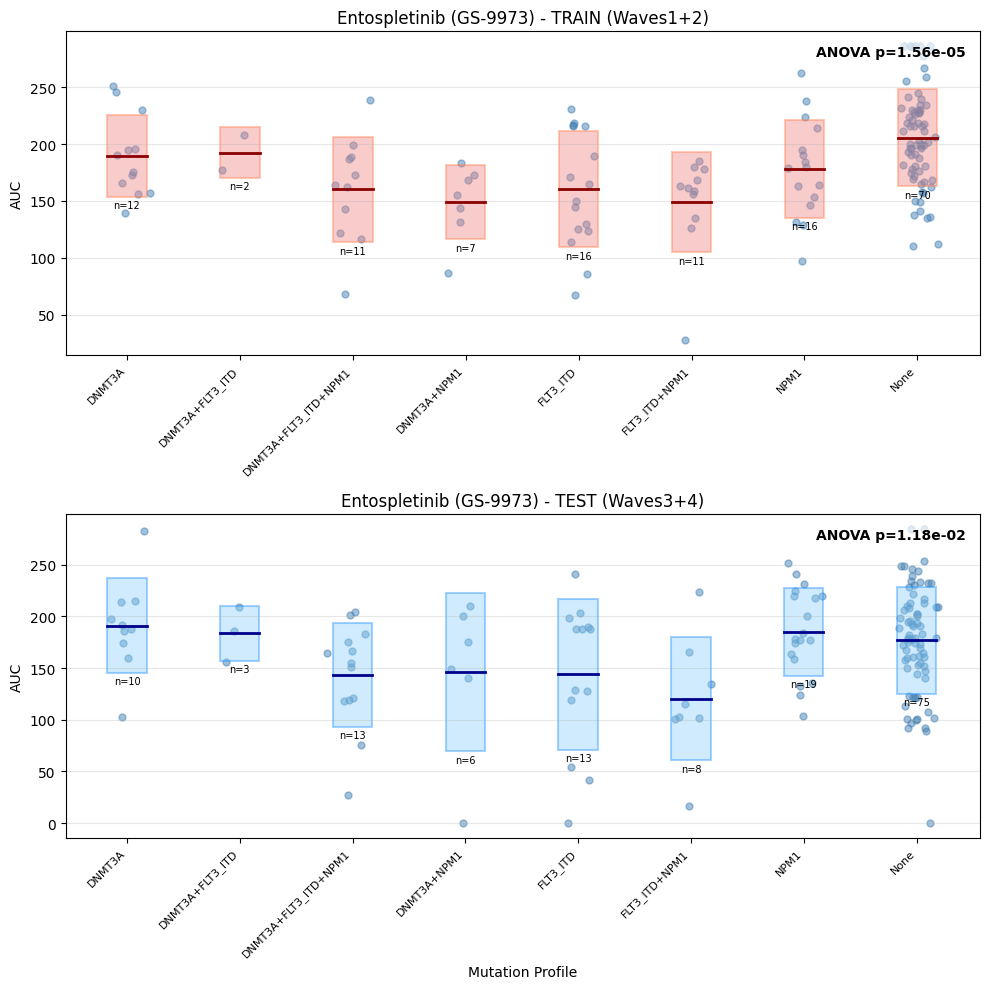

Drug:Ibrutinib (PCI-32765)


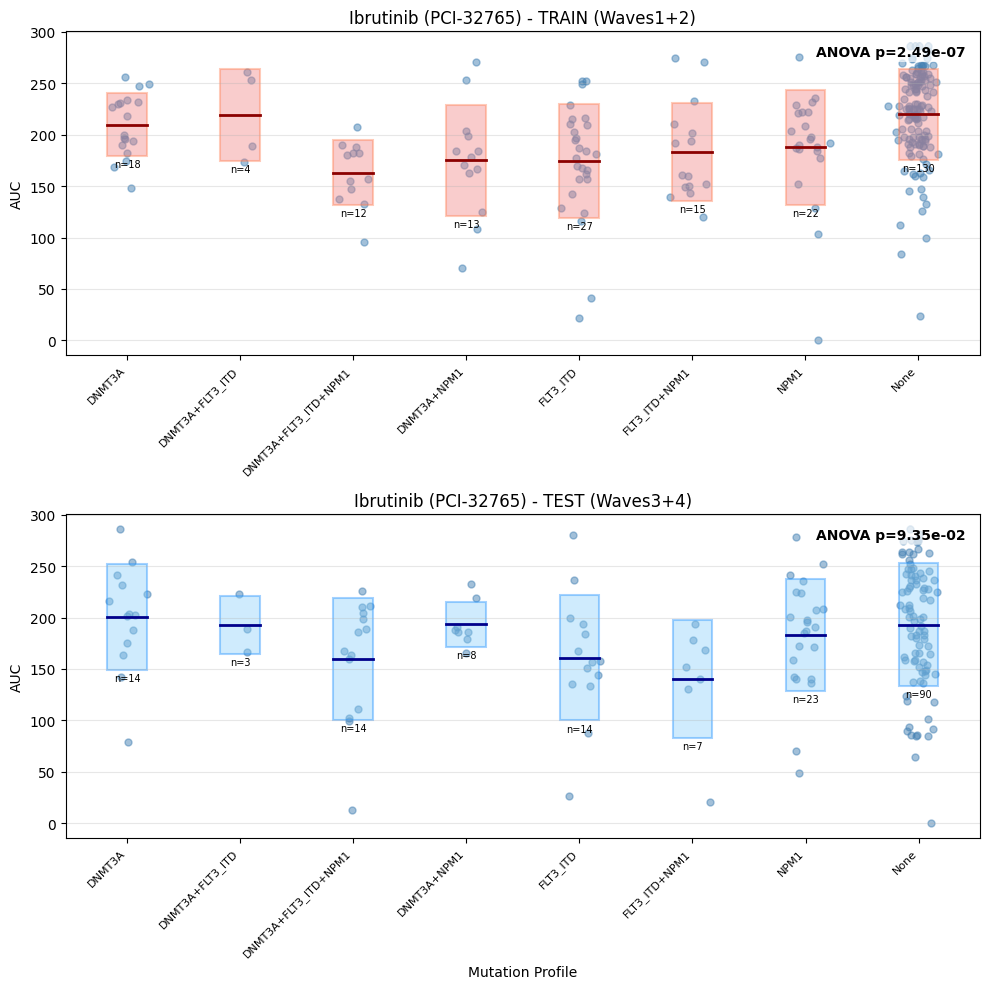

Drug:Midostaurin


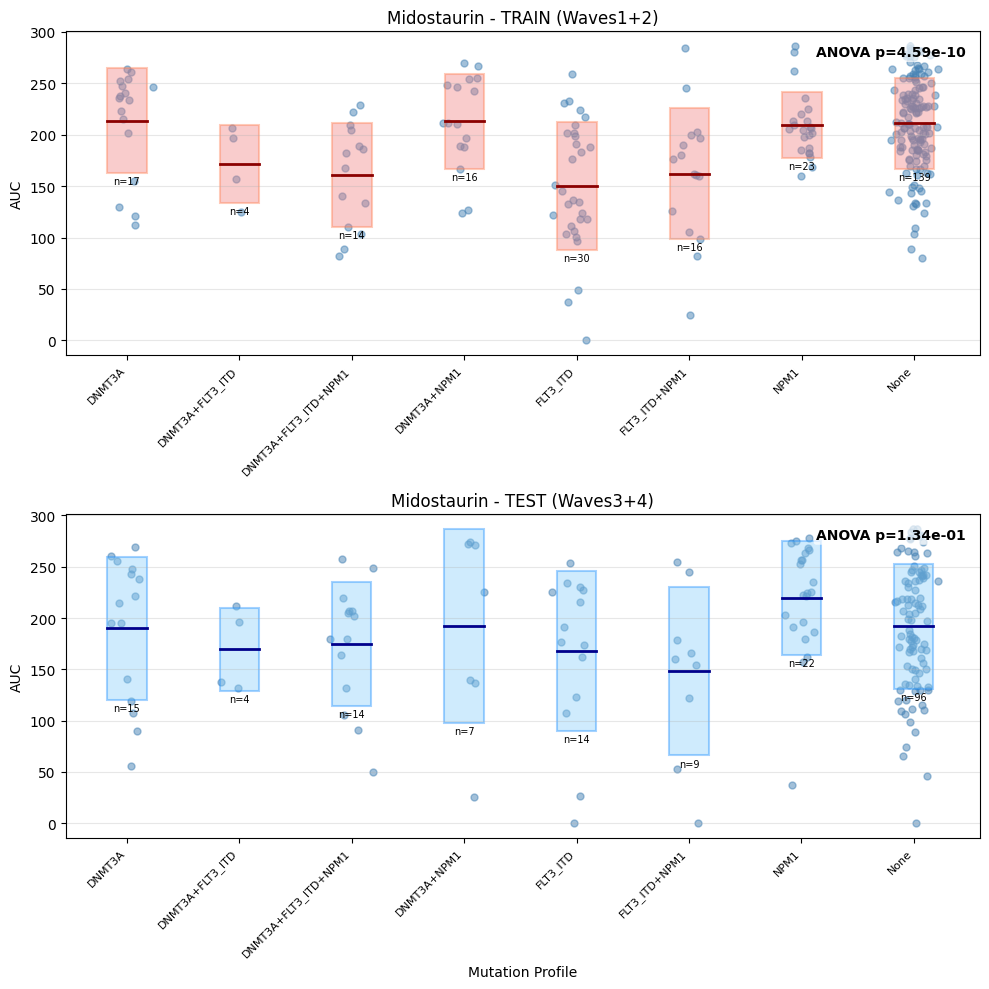

Drug:Selumetinib (AZD6244)


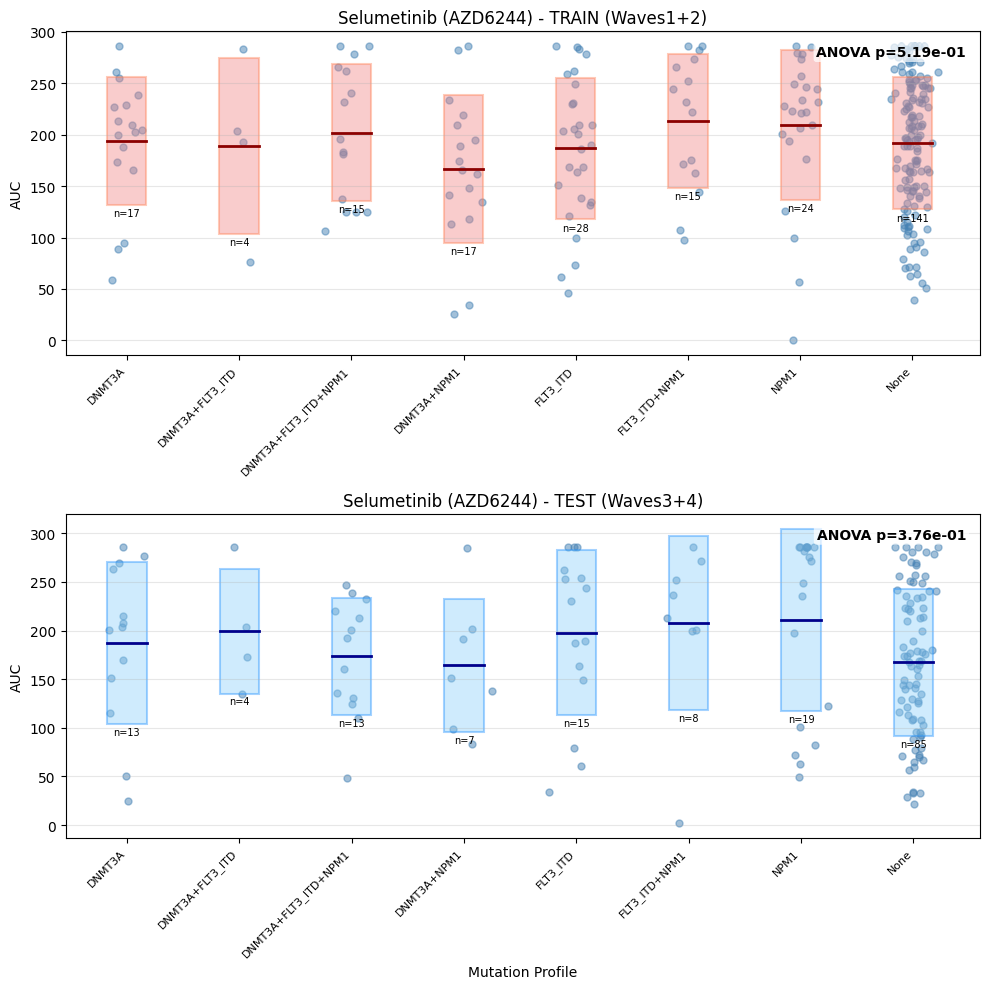

Drug:Trametinib (GSK1120212)


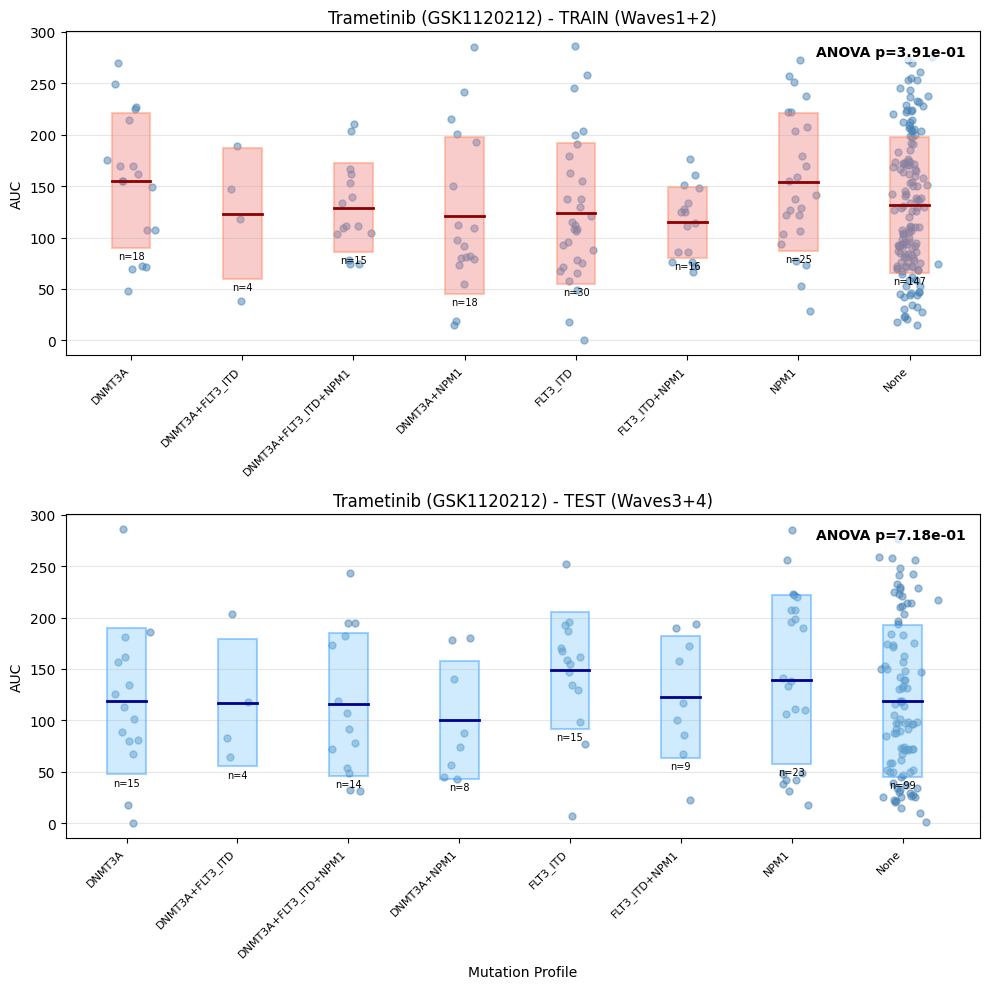

Drug:Venetoclax


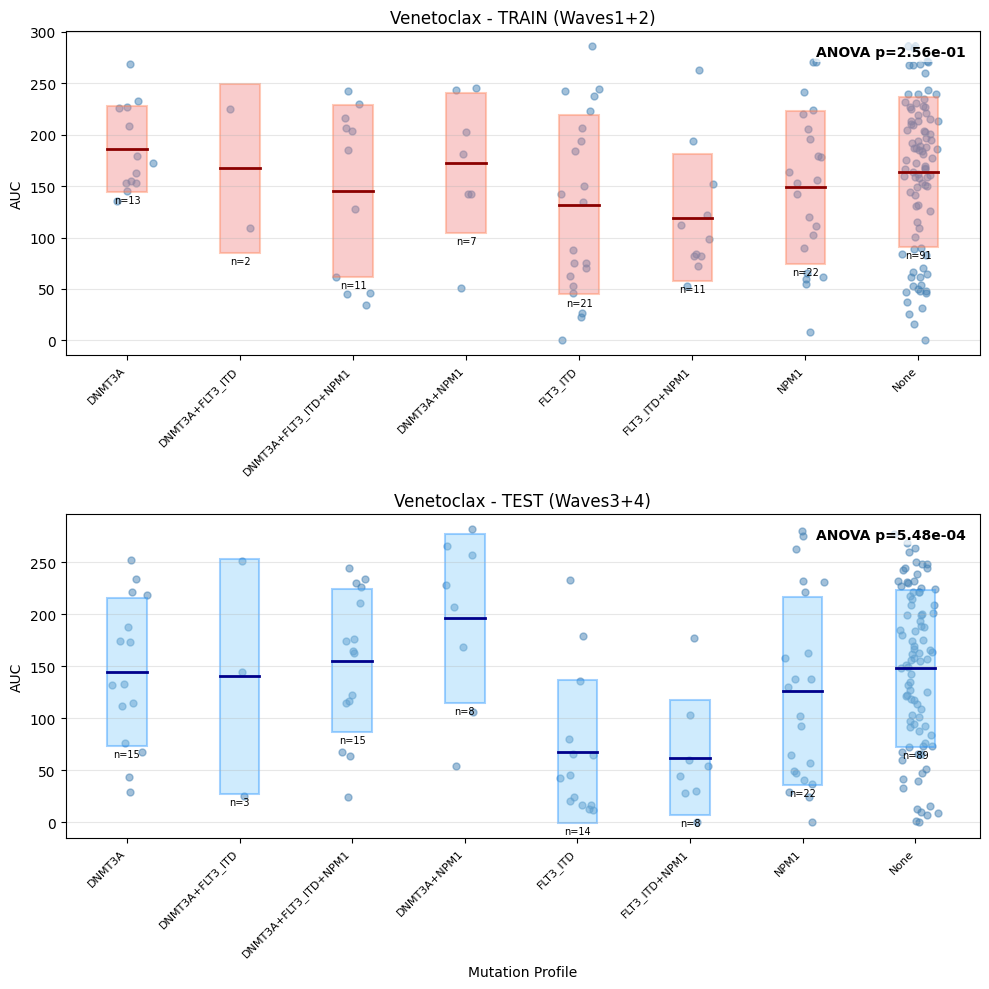

In [490]:
# AUC by mutation profile with mean ± s.d. boxes (Train vs Test)
AUC_by_mutation_profile(df, combined=False)

Drug:Entospletinib (GS-9973)
ANOVA p=6.25e-07


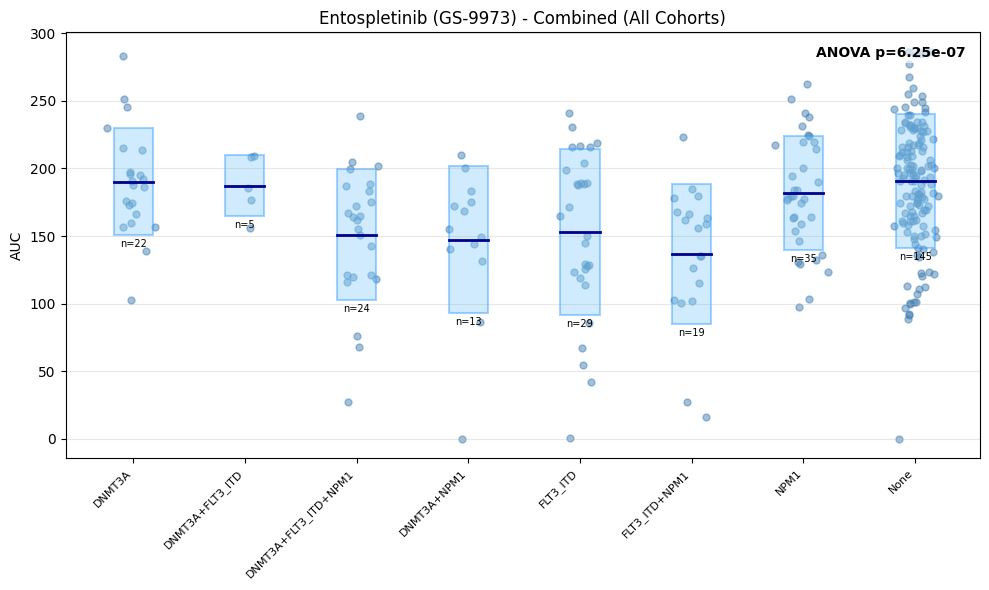

Drug:Ibrutinib (PCI-32765)
ANOVA p=2.02e-07


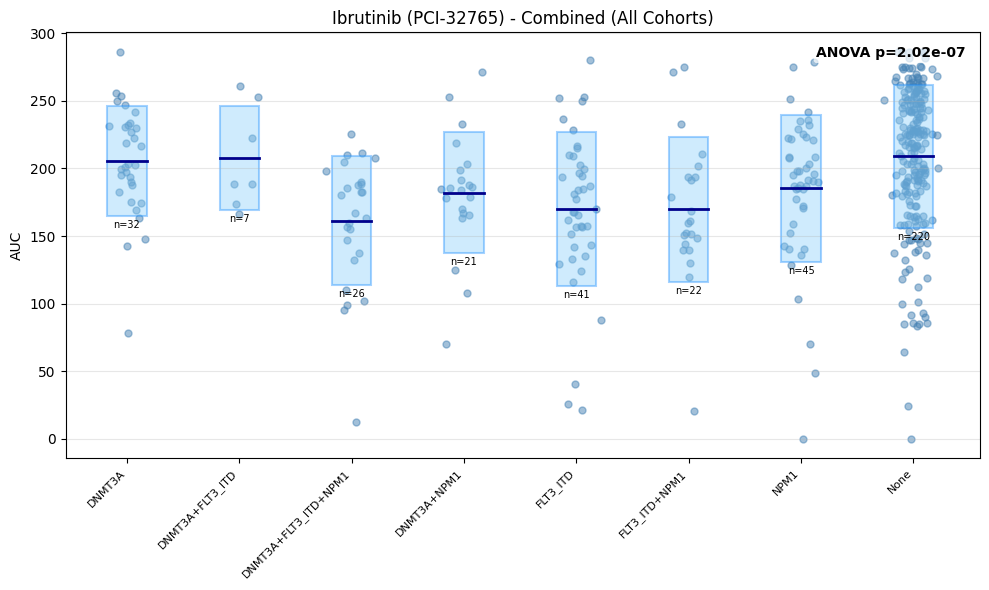

Drug:Midostaurin
ANOVA p=7.28e-09


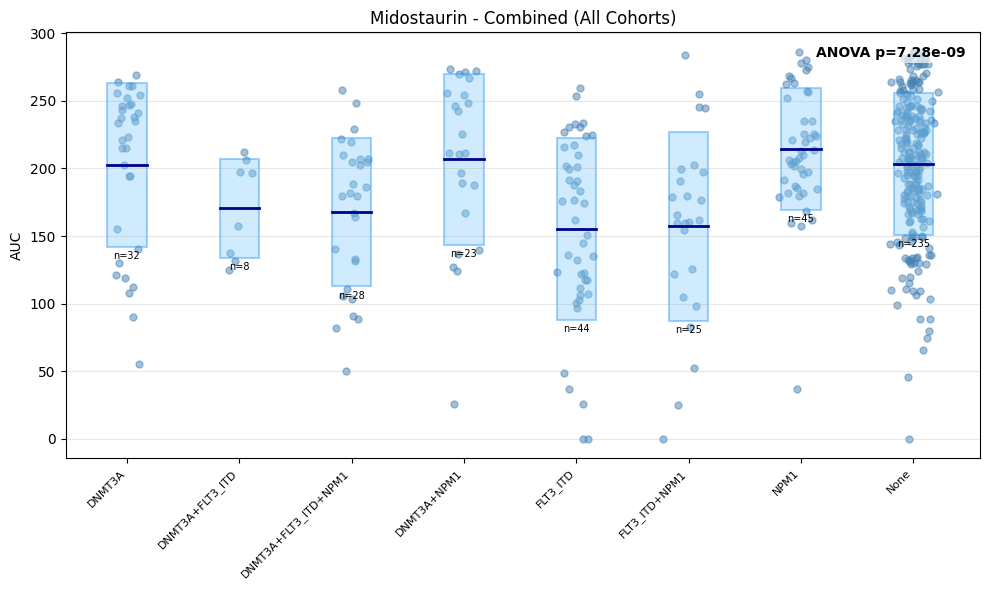

Drug:Selumetinib (AZD6244)
ANOVA p=1.70e-01


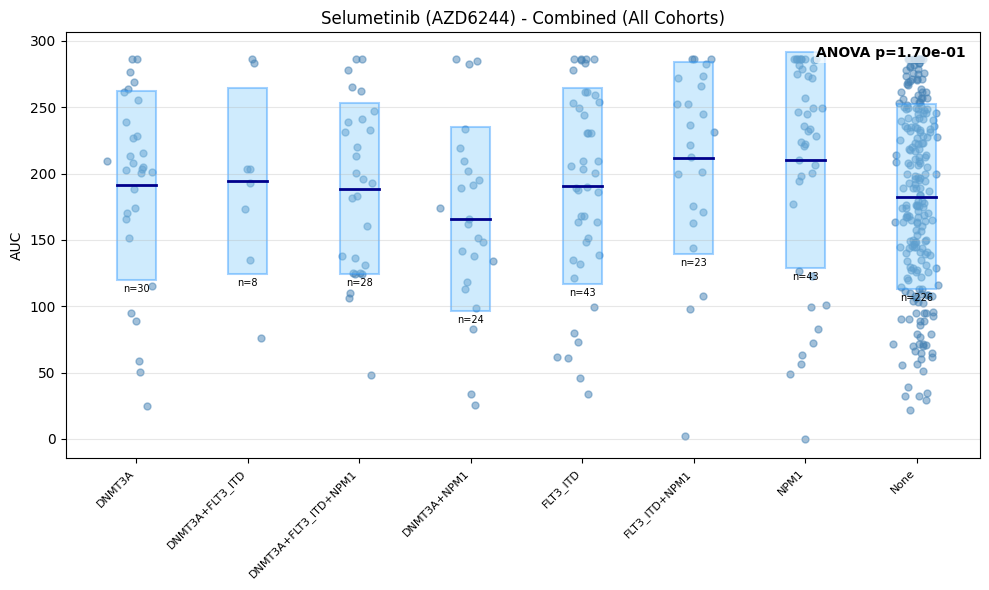

Drug:Trametinib (GSK1120212)
ANOVA p=4.55e-01


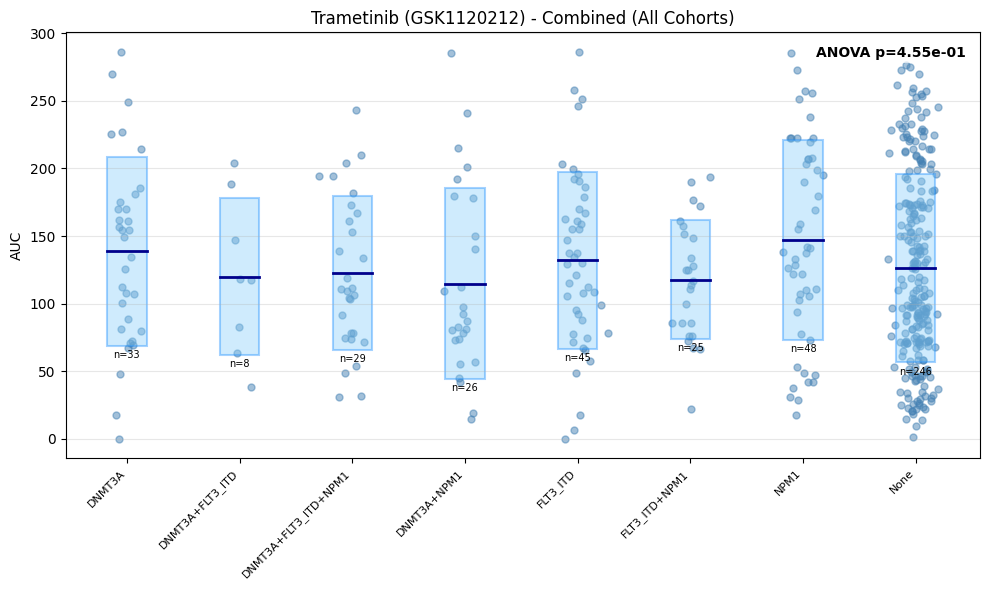

Drug:Venetoclax
ANOVA p=3.56e-04


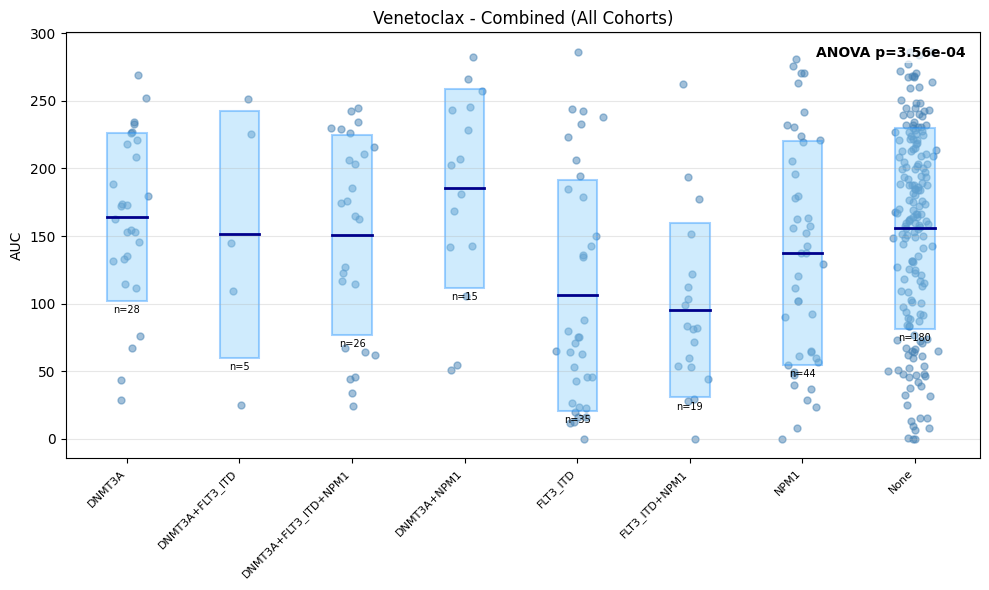

In [491]:
# AUC by mutation profile with mean ± s.d. boxes (Train vs Test)
AUC_by_mutation_profile(df, combined=True)

In [15]:
sorted(heatmap_data.columns)

['DNMT3A',
 'DNMT3A+FLT3_ITD',
 'DNMT3A+FLT3_ITD+NPM1',
 'DNMT3A+NPM1',
 'FLT3_ITD',
 'FLT3_ITD+NPM1',
 'NPM1',
 'None']

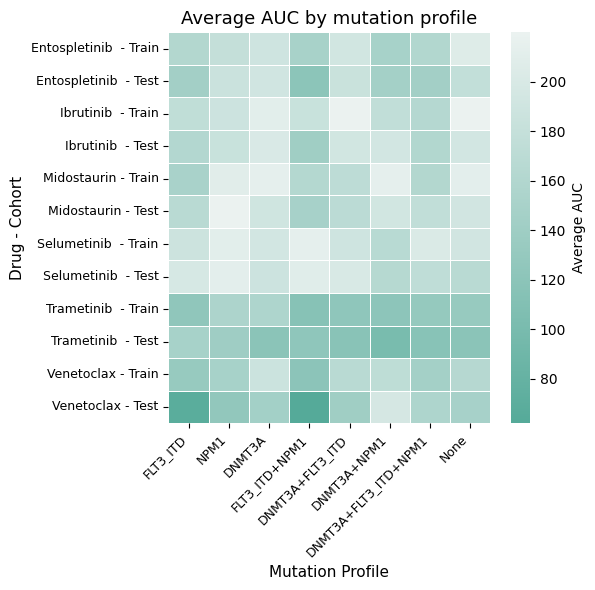

In [313]:
# Heatmap: Average AUC by Drug-Cohort (rows) vs Mutation Profile (columns)

def normalize_profile_text(p):
    if isinstance(p, (set, frozenset, list, tuple)):
        genes = sorted(map(str, p))
    else:
        s = re.sub(r'[\{\}]', '', str(p))
        genes = sorted([g.strip() for g in s.split(',') if g.strip()])
    return "+".join(genes) if genes else "None"

# Prepare data
df_heatmap = df.copy()
df_heatmap["profile_label"] = df_heatmap["mutation_profile"].apply(normalize_profile_text)

# Create drug-cohort label (e.g., "Venetoclax - Train")
cohort_map = {'Waves1+2': 'Train', 'Waves3+4': 'Test'}
df_heatmap['cohort_label'] = df_heatmap['cohort'].map(cohort_map)
# remove everything within parentheses in inhibitor column
df_heatmap['inhibitor'] = df_heatmap['inhibitor'].str.replace(r'\(.*?\)', '', regex=True)
df_heatmap['drug_cohort'] = df_heatmap['inhibitor'] + ' - ' + df_heatmap['cohort_label']

# Calculate average AUC for each drug-cohort and profile combination
heatmap_data = df_heatmap.groupby(['drug_cohort', 'profile_label'])['auc'].mean().unstack(fill_value=np.nan)

# Sort columns (profiles)
order = ['FLT3_ITD', 'NPM1', 'DNMT3A', 'FLT3_ITD+NPM1', 'DNMT3A+FLT3_ITD', 'DNMT3A+NPM1', 'DNMT3A+FLT3_ITD+NPM1', 'None']
heatmap_data = heatmap_data[order]

# Sort rows: group by drug, then Train before Test
row_order = []
for drug in sorted(df_heatmap['inhibitor'].unique()):
    row_order.append(f"{drug} - Train")
    row_order.append(f"{drug} - Test")
# Filter to only existing rows
row_order = [r for r in row_order if r in heatmap_data.index]
heatmap_data = heatmap_data.loc[row_order]

color_palette = sns.color_palette("light:#5A9_r", as_cmap=True)  # low=blue (good), high=white (bad)

# Create heatmap
fig, ax = plt.subplots(figsize=(6, max(6, len(row_order) * 0.5)))

# Plot heatmap without annotations (annot=False)
sns.heatmap(heatmap_data, 
            cmap=color_palette,  # White (high) to Blue (low)
            annot=False,      # No value labels
            cbar_kws={'label': 'Average AUC'},
            ax=ax,
            linewidths=0.5,
            linecolor='white')

ax.set_xlabel('Mutation Profile', fontsize=11)
ax.set_ylabel('Drug - Cohort', fontsize=11)
ax.set_title('Average AUC by mutation profile', fontsize=13)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=9)

plt.tight_layout()
plt.show()

# Run Optimization
## Create exp data

The 8 mutation profiles (FLT3-ITD, NPM1, DNMT3A and their combinations) for 3 drugs: Venetoclax, Ibrutinib, Entospletinib.

In [41]:
# mutation class
classification = pd.read_csv("../input_files/Palma_class.csv")
gene_to_class = dict(zip(classification['symbol'], classification['class']))
gene_to_class

{'AKT1': 'oncogene',
 'BCL2': 'oncogene',
 'CCND1': 'oncogene',
 'CDKN2A': 'TSG',
 'CEBPA': 'TSG',
 'DNMT3A': 'TSG',
 'ETV6': 'TSG',
 'FBXW7': 'TSG',
 'FLT3': 'oncogene',
 'GSK3B': 'oncogene',
 'HOXA9': 'oncogene',
 'MAPK1': 'oncogene',
 'MEIS1': 'oncogene',
 'MYC': 'oncogene',
 'NPM1': 'TSG',
 'SOX4': 'oncogene',
 'STAT5A': 'oncogene',
 'TP53': 'TSG',
 'ATM': 'TSG',
 'CDKN1B': 'TSG',
 'CYCS': 'TSG',
 'MTOR': 'oncogene',
 'NRAS': 'oncogene',
 'PIK3CA': 'oncogene',
 'ROS1': 'oncogene'}

In [428]:
# Create experimental data for Venetoclax
exp_data = create_experimental_data(
    df, 
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    inhibitors=['Selumetinib'],
    output_file='../data/BeatAML_AUC_Selumetinib.csv'
)
exp_data

\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Selumetinib.csv
\nSummary by drug:
             Total patients   Mean AUC±SD
drug                                     
Selumetinib             261  194.18±14.77


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,"MAP2K1,MAP2K2","1,1",AUC,191.87,141,64.50,Selumetinib
1,2,FLT3,1,"MAP2K1,MAP2K2","1,1",AUC,186.67,28,69.03,Selumetinib
2,3,,,"MAP2K1,MAP2K2,NPM1","1,1,1",AUC,209.63,24,72.67,Selumetinib
3,4,,,"DNMT3A,MAP2K1,MAP2K2","1,1,1",AUC,193.96,17,62.48,Selumetinib
4,5,FLT3,1,"MAP2K1,MAP2K2,NPM1","1,1,1",AUC,213.63,15,65.39,Selumetinib
5,6,FLT3,1,"DNMT3A,MAP2K1,MAP2K2","1,1,1",AUC,189.12,4,85.41,Selumetinib
6,7,,,"DNMT3A,MAP2K1,MAP2K2,NPM1","1,1,1,1",AUC,166.56,17,72.02,Selumetinib
7,8,FLT3,1,"DNMT3A,MAP2K1,MAP2K2,NPM1","1,1,1,1",AUC,201.96,15,66.52,Selumetinib


In [ ]:
# Create experimental data for Venetoclax
exp_data = create_experimental_data(
    df, 
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    # inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib'],
    inhibitors=['Venetoclax'],
    # output_file='../data/BeatAML_AUC_Venetoclax+Ibrutinib+Entospletinib.csv'
    output_file='../data/BeatAML_AUC_Venetoclax.csv'
)

exp_data

\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Venetoclax.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             352  143.25±29.71


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,AUC,155.79,180,74.36,Venetoclax
1,2,FLT3,1,BCL2,1,AUC,106.12,35,85.32,Venetoclax
2,3,,,"BCL2,NPM1","1,1",AUC,137.37,44,82.65,Venetoclax
3,4,,,"BCL2,DNMT3A","1,1",AUC,163.84,28,62.12,Venetoclax
4,5,FLT3,1,"BCL2,NPM1","1,1",AUC,95.32,19,64.62,Venetoclax
5,6,FLT3,1,"BCL2,DNMT3A","1,1",AUC,151.24,5,91.16,Venetoclax
6,7,,,"BCL2,DNMT3A,NPM1","1,1,1",AUC,185.21,15,73.77,Venetoclax
7,8,FLT3,1,"BCL2,DNMT3A,NPM1","1,1,1",AUC,151.12,26,73.91,Venetoclax


In [109]:
# Create experimental data for Venetoclax
create_experimental_data(
    df, 
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    cohort='Waves1+2',
    inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib'],
    output_file='../data/BeatAML_AUC_Ven+Ibr+Ent_Waves1+2.csv'
)

\nGenerating data for 8 profiles × 3 drugs = 24 experiments
\nSaved 24 experiments to ../data/BeatAML_AUC_Ven+Ibr+Ent_Waves1+2.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  173.02±21.53
Ibrutinib                 241  191.57±21.89
Venetoclax                178  154.34±22.17


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,AUC,163.40,91,72.91,Venetoclax
1,2,,,BTK,1,AUC,219.95,130,44.23,Ibrutinib
2,3,,,SYK,1,AUC,205.72,70,42.86,Entospletinib
3,4,FLT3,1,BCL2,1,AUC,131.74,21,87.09,Venetoclax
4,5,FLT3,1,BTK,1,AUC,174.50,27,55.41,Ibrutinib
5,6,FLT3,1,SYK,1,AUC,160.19,16,50.94,Entospletinib
6,7,,,"BCL2,NPM1","1,1",AUC,148.79,22,74.22,Venetoclax
7,8,,,"BTK,NPM1","1,1",AUC,187.75,22,55.73,Ibrutinib
8,9,,,"NPM1,SYK","1,1",AUC,178.17,16,43.02,Entospletinib
9,10,,,"BCL2,DNMT3A","1,1",AUC,186.14,13,41.90,Venetoclax


In [110]:
# Create experimental data for Venetoclax
create_experimental_data(
    df, 
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    cohort='Waves3+4',
    inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib'],
    output_file='../data/BeatAML_AUC_Ven+Ibr+Ent_Waves3+4.csv'
)

\nGenerating data for 8 profiles × 3 drugs = 24 experiments
\nSaved 24 experiments to ../data/BeatAML_AUC_Ven+Ibr+Ent_Waves3+4.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             147  161.29±26.05
Ibrutinib                 173  177.96±21.50
Venetoclax                174  130.05±45.02


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,AUC,148.01,89,75.42,Venetoclax
1,2,,,BTK,1,AUC,192.85,90,59.80,Ibrutinib
2,3,,,SYK,1,AUC,177.06,75,51.66,Entospletinib
3,4,FLT3,1,BCL2,1,AUC,67.68,14,68.71,Venetoclax
4,5,FLT3,1,BTK,1,AUC,160.96,14,61.14,Ibrutinib
5,6,FLT3,1,SYK,1,AUC,143.85,13,73.05,Entospletinib
6,7,,,"BCL2,NPM1","1,1",AUC,125.95,22,90.58,Venetoclax
7,8,,,"BTK,NPM1","1,1",AUC,182.98,23,54.14,Ibrutinib
8,9,,,"NPM1,SYK","1,1",AUC,184.96,19,42.17,Entospletinib
9,10,,,"BCL2,DNMT3A","1,1",AUC,144.50,15,71.24,Venetoclax


## Extend PBN for drug targets
- Venetoclax	BCL2  
- Ibrutinib	BTK  
- Entospletinib	SYK  

In [ ]:
# The Palma model
network = KGBN.load_network(network_file_no_phenotype)
KGBN.vis_network(network, output_html="Palma2021_nophe.html", interactive=True, color_node='lightblue', physics=False)

No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
Network visualization saved to Palma2021_nophe.html


In [ ]:
# extended PBN by adding drug targets
genes = list(network.nodeDict.keys())
genes = genes + ['BCL2','SYK', 'BTK']
KG_string, relations = KGBN.load_signor_network(genes, joiner='&')
KG = KGBN.load_network_from_string(KG_string)
KGBN.vis_network(KG, output_html="drug_targets_KG.html", interactive=True, color_node='#E1F2D0', physics=False)

number of genes found: 21
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 596, 6850, 695]
No initial state provided, using a random initial state
Network loaded successfully. There are 20 genes in the network.
Network visualization saved to drug_targets_KG.html


In [ ]:
import sys
import importlib
importlib.reload(sys.modules['KGBN.vis'])
from KGBN.vis import vis_extension

In [ ]:
# Visualize extended PBN
pbn_string = KGBN.merge_networks([network, KG], method="PBN", prob=0.6)
pbn = KGBN.load_pbn_from_string(pbn_string)
vis_extension(network,pbn, output_html="Palma2021+KG.html", interactive=True, color_node='lightblue', color_edge='lightblue', extension_color_node='#FBE1BE', physics=False)

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Extension comparison:
  Original nodes: 18
  Extended nodes: 20
  New nodes: 2 - ['BTK', 'SYK']
  Original edges: 20
  Extended edges: 42
  New edges: 22
Extension visualization saved to Palma2021+KG.html


In [ ]:
pbn_string = KGBN.merge_networks([network, KG], method="PBN", prob=0.6)
pbn = KGBN.load_pbn_from_string(pbn_string)
print(pbn_string)

No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
number of genes found: 19
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 596]
No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 18 genes in the network.
AKT1 = AKT1 & FLT3, 0.4
AKT1 = FLT3, 0.6
BCL2 = !GSK3B & MAPK1 & !TP53, 0.4
BCL2 = MAPK1 & !TP53, 0.6
CCND1 = ! ( DNMT3A | GSK3B ), 0.6
CCND1 = !DNMT3A & !GSK3B & MYC, 0.4
CDKN2A = !DNMT3A & !MYC, 0.4
CDKN2A = NPM1, 0.6
CEBPA = !FLT3, 0.6
CEBPA = CEBPA & !FLT3 & GSK3B & !MAPK1, 0.4
DNMT3A = DNMT3A, 0.6
DNMT3A = MYC & STAT5A, 0.4
ETV6 = !MAPK1, 1.0
FBXW7 = AKT1 & NPM1, 0.4
FBXW7 = NPM1, 0.6
FLT3 = FLT3, 1.0
GSK3B = !AKT1 & GSK3B & !MAPK1, 0.4
GSK3B = !AKT1, 0.6
HOXA9 = !DNMT3A & !NPM1, 0.4
HOXA9 = !NPM

In [ ]:
# Three alternative networks
KG_OR_string, relations = KGBN.load_signor_network(genes, joiner='|')
KG_AND_string, relations = KGBN.load_signor_network(genes, joiner='&')
KG_IW_string, relations = KGBN.load_signor_network(genes, joiner='inhibitor_wins')

KG_OR = KGBN.load_network_from_string(KG_OR_string)
KG_AND = KGBN.load_network_from_string(KG_AND_string)
KG_IW = KGBN.load_network_from_string(KG_IW_string)

pbn_string = KGBN.merge_networks([network, KG_OR, KG_AND, KG_IW], method="PBN", prob=0.25)
pbn = KGBN.load_pbn_from_string(pbn_string)
print(pbn_string)

number of genes found: 19
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 596]
number of genes found: 19
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 596]
number of genes found: 19
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 596]
No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 18 genes in the network.
AKT1 = AKT1 & FLT3, 0.25
AKT1 = AKT1 | FLT3, 0.5
AKT1 = FLT3, 0.25
BCL2 = !GSK3B & MAPK1 & !TP53, 0.5
BCL2 = !

In [ ]:
# get phenotype score formula
formula = KGBN.phenotype_scores(
    genes=genes,
    simulation_results=None,
    phenotypes=['APOPTOSIS']
)
formula['APOPTOSIS']

Path found for 1 phenotypes: ['APOPTOSIS']


'- AKT1 -  BCL2 + CDKN2A + GSK3B -  MAPK1 -  MEIS1 -  STAT5A + TP53'

In [ ]:
# get phenotype score formula - reversed
formula = KGBN.phenotype_scores(
    genes=genes,
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
formula['APOPTOSIS']

Path found for 1 phenotypes: ['APOPTOSIS']


'AKT1 + BCL2 - CDKN2A - GSK3B + MAPK1 + MEIS1 + STAT5A - TP53'

## Config

In [58]:
# optimizer configuration
config = {
    'pso_params': {
        'n_particles': 100,  # 20*number of parameters to optimize
        'iters': 2000,
        'options': {
            'c1': 0.5, # Cognitive parameter
            'c2': 0.3, # Social parameter
            'w': 0.9 # Inertia weight
        },
        'ftol': -1,
        'ftol_iter': 5
    },
    'de_params': {
        'strategy': 'best1bin',
        'maxiter': 1000,
        'popsize': 20,
        'tol': 0.001, 
        'atol': 0,
        'mutation': (0.5, 1.5),
        'recombination': 0.7,
        'seed': None,
        'disp': False,
        'init': 'sobol',
        'updating': 'deferred',
        'workers': -1,
        'early_stopping': False  # Control early stopping
    },
    'steady_state': {
        'method': 'tsmc',
            'tsmc_params': {
                'epsilon': 0.05, # range of transition probability [Default=0.001]
                'r': 0.1, # range of accuracy (most sensitive) [Default=0.025]
                's': 0.85, # probability to acquire defined accuracy [Default=0.95]
                'p_mir': 0.01, # perturbation in Miranda's & Parga's scheme [Default=0.001, 0.1%]
                'initial_nsteps': 100, # initial simulation steps [Recommended at 100 steps for n < 100]
                'max_iterations': 1000, # maximum convergence iterations [Default=5000]
                'freeze_constant': True # whether to treat self-loop as a fixed node
            },
    },
    'max_try': 3,  # Maximum number of attempts if optimization fails
    'success_threshold': 0.1, # threshold for accepting fit,
    'seed': 9
}

## Venetoclax, Ibrutinib, Entospletinib target
- Venetoclax -> BCL2  
- Ibrutinib -> BTK  
- Entospletinib -> SYK  

In [187]:
# Create experimental data for drugs
exp_data = create_experimental_data(
    df, 
    cohort='Waves1+2',
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib'],
    output_file='../data/BeatAML_AUC_Venetoclax+Ibrutinib+Entospletinib.csv'
)

exp_data

\nGenerating data for 8 profiles × 3 drugs = 24 experiments
\nSaved 24 experiments to ../data/BeatAML_AUC_Venetoclax+Ibrutinib+Entospletinib.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  173.02±21.53
Ibrutinib                 241  191.57±21.89
Venetoclax                178  154.34±22.17


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,AUC,163.40,91,72.91,Venetoclax
1,2,,,BTK,1,AUC,219.95,130,44.23,Ibrutinib
2,3,,,SYK,1,AUC,205.72,70,42.86,Entospletinib
3,4,FLT3,1,BCL2,1,AUC,131.74,21,87.09,Venetoclax
4,5,FLT3,1,BTK,1,AUC,174.50,27,55.41,Ibrutinib
5,6,FLT3,1,SYK,1,AUC,160.19,16,50.94,Entospletinib
6,7,,,"BCL2,NPM1","1,1",AUC,148.79,22,74.22,Venetoclax
7,8,,,"BTK,NPM1","1,1",AUC,187.75,22,55.73,Ibrutinib
8,9,,,"NPM1,SYK","1,1",AUC,178.17,16,43.02,Entospletinib
9,10,,,"BCL2,DNMT3A","1,1",AUC,186.14,13,41.90,Venetoclax


In [188]:
# Create experimental data for drugs except Trametinib (same target as Selumetinib)
create_experimental_data(
    df, 
    cohort='Waves1+2',
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib','Selumetinib','Midostaurin'],
    output_file='../data/BeatAML_AUC_5drugs_Waves1+2.csv'
)

create_experimental_data(
    df, 
    cohort='Waves3+4',
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib','Selumetinib','Midostaurin'],
    output_file='../data/BeatAML_AUC_5drugs_Waves3+4.csv'
)

\nGenerating data for 8 profiles × 5 drugs = 40 experiments
\nSaved 40 experiments to ../data/BeatAML_AUC_5drugs_Waves1+2.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  173.02±21.53
Ibrutinib                 241  191.57±21.89
Midostaurin               259  186.43±27.75
Selumetinib               261  194.18±14.77
Venetoclax                178  154.34±22.17
\nGenerating data for 8 profiles × 5 drugs = 40 experiments
\nSaved 40 experiments to ../data/BeatAML_AUC_5drugs_Waves3+4.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             147  161.29±26.05
Ibrutinib                 173  177.96±21.50
Midostaurin               181  181.76±21.54
Selumetinib               164  188.53±18.29
Venetoclax                174  130.05±45.02


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,AUC,148.01,89,75.42,Venetoclax
1,2,,,BTK,1,AUC,192.85,90,59.80,Ibrutinib
2,3,,,SYK,1,AUC,177.06,75,51.66,Entospletinib
3,4,,,"MAP2K1,MAP2K2","1,1",AUC,167.49,85,75.62,Selumetinib
4,5,,,"FLT3,KIT","1,1",AUC,192.00,96,60.77,Midostaurin
5,6,FLT3,1,BCL2,1,AUC,67.68,14,68.71,Venetoclax
6,7,FLT3,1,BTK,1,AUC,160.96,14,61.14,Ibrutinib
7,8,FLT3,1,SYK,1,AUC,143.85,13,73.05,Entospletinib
8,9,FLT3,1,"MAP2K1,MAP2K2","1,1",AUC,197.65,15,84.73,Selumetinib
9,10,FLT3,1,"FLT3,KIT","1,1",AUC,167.51,14,78.10,Midostaurin


In [ ]:
# extended PBN by adding BCL2
network = KGBN.load_network(network_file_no_phenotype)
genes = list(network.nodeDict.keys())
genes = genes + ['BCL2','SYK', 'BTK']
KG_string, relations = KGBN.load_signor_network(genes, joiner='&')
KG = KGBN.load_network_from_string(KG_string)
pbn_string = KGBN.merge_networks([network, KG], method="PBN", prob=0.6)
pbn = KGBN.load_pbn_from_string(pbn_string)
print(pbn_string)

No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
number of genes found: 21
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 596, 6850, 695]
No initial state provided, using a random initial state
Network loaded successfully. There are 20 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
AKT1 = AKT1 & FLT3, 0.4
AKT1 = FLT3, 0.6
BCL2 = !GSK3B & MAPK1 & !TP53, 0.4
BCL2 = MAPK1 & !TP53, 0.6
BTK = !AKT1 & BTK & SYK, 1.0
CCND1 = ! ( DNMT3A | GSK3B ), 0.6
CCND1 = !DNMT3A & !GSK3B & MYC, 0.4
CDKN2A = !DNMT3A & !MYC, 0.4
CDKN2A = NPM1, 0.6
CEBPA = !FLT3, 0.6
CEBPA = CEBPA & !FLT3 & GSK3B & !MAPK1, 0.4
DNMT3A = DNMT3A, 0.6
DNMT3A = MYC & STAT5A, 0.4
ETV6 = !MAPK1, 1.0
FBXW7 = AKT1 & NPM1, 0.4
FBXW7 = NPM1, 0.6
FLT3 = FLT3 & SYK, 0.4
FLT3 = FLT3, 0.6
GSK3B = !AKT1 & GSK3B & !MAPK1, 0

In [ ]:
# get phenotype score formula
formula = KGBN.phenotype_scores(
    genes=genes,
    simulation_results=None,
    phenotypes=['APOPTOSIS']
)
formula

Path found for 1 phenotypes: ['APOPTOSIS']


{'APOPTOSIS': '- AKT1 -  BCL2 + CDKN2A + GSK3B -  MAPK1 -  MEIS1 -  STAT5A + TP53'}

## Train on Waves1+2, test on Waves3+4

In [93]:
# Create experimental data for Venetoclax - Waves1+2
exp_data = create_experimental_data(
    df, 
    cohort='Waves1+2',
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    # inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib'],
    inhibitors=['Venetoclax'],
    # output_file='../data/BeatAML_AUC_Venetoclax+Ibrutinib+Entospletinib.csv'
    output_file='../data/BeatAML_AUC_Venetoclax_Waves1+2.csv'
)

exp_data

\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Venetoclax_Waves1+2.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             178  154.34±22.17


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,AUC,163.40,91,72.91,Venetoclax
1,2,FLT3,1,BCL2,1,AUC,131.74,21,87.09,Venetoclax
2,3,,,"BCL2,NPM1","1,1",AUC,148.79,22,74.22,Venetoclax
3,4,,,"BCL2,DNMT3A","1,1",AUC,186.14,13,41.90,Venetoclax
4,5,FLT3,1,"BCL2,NPM1","1,1",AUC,119.48,11,61.96,Venetoclax
5,6,FLT3,1,"BCL2,DNMT3A","1,1",AUC,167.35,2,81.99,Venetoclax
6,7,,,"BCL2,DNMT3A,NPM1","1,1,1",AUC,172.68,7,68.20,Venetoclax
7,8,FLT3,1,"BCL2,DNMT3A,NPM1","1,1,1",AUC,145.15,11,83.50,Venetoclax


In [94]:
# Create experimental data for Venetoclax - Waves3+4
exp_data = create_experimental_data(
    df, 
    cohort='Waves3+4',
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    # inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib'],
    inhibitors=['Venetoclax'],
    # output_file='../data/BeatAML_AUC_Venetoclax+Ibrutinib+Entospletinib.csv'
    output_file='../data/BeatAML_AUC_Venetoclax_Waves3+4.csv'
)


\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Venetoclax_Waves3+4.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             174  130.05±45.02


In [13]:
exp_data.drop(columns=['Stimuli_efficacy', 'Inhibitors_efficacy'], inplace=True)
exp_data

,Experiments,Stimuli,Inhibitors,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,BCL2,AUC,163.40,91,72.91,Venetoclax
1,2,FLT3,BCL2,AUC,131.74,21,87.09,Venetoclax
2,3,,"BCL2,NPM1",AUC,148.79,22,74.22,Venetoclax
3,4,,"BCL2,DNMT3A",AUC,186.14,13,41.90,Venetoclax
4,5,FLT3,"BCL2,NPM1",AUC,119.48,11,61.96,Venetoclax
5,6,FLT3,"BCL2,DNMT3A",AUC,167.35,2,81.99,Venetoclax
6,7,,"BCL2,DNMT3A,NPM1",AUC,172.68,7,68.20,Venetoclax
7,8,FLT3,"BCL2,DNMT3A,NPM1",AUC,145.15,11,83.50,Venetoclax


In [43]:
# Create experimental data for Entospletinib - Waves1+2
exp_data = create_experimental_data(
    df, 
    cohort='Waves1+2',
    mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
    inhibitors=['Entospletinib'],
    output_file='../data/BeatAML_AUC_Entospletinib_Waves1+2.csv'
)

exp_data

\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Entospletinib_Waves1+2.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  173.02±21.53


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,SYK,1,AUC,205.72,70,42.86,Entospletinib
1,2,FLT3,1,SYK,1,AUC,160.19,16,50.94,Entospletinib
2,3,,,"NPM1,SYK","1,1",AUC,178.17,16,43.02,Entospletinib
3,4,,,"DNMT3A,SYK","1,1",AUC,189.63,12,36.21,Entospletinib
4,5,FLT3,1,"NPM1,SYK","1,1",AUC,149.07,11,44.16,Entospletinib
5,6,FLT3,1,"DNMT3A,SYK","1,1",AUC,192.51,2,22.18,Entospletinib
6,7,,,"DNMT3A,NPM1,SYK","1,1,1",AUC,148.75,7,32.52,Entospletinib
7,8,FLT3,1,"DNMT3A,NPM1,SYK","1,1,1",AUC,160.09,11,46.47,Entospletinib


# Difference between PBNs

In [ ]:
vene_pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/pbn.txt')
ento_pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/pbn.txt')
ibru_pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/pbn.txt')

No initial state provided, using a random initial state
PBN loaded successfully. There are 18 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 19 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 19 genes in the network.


In [470]:
vene_cij = vene_pbn.cij
ento_cij = ento_pbn.cij
ibru_cij = ibru_pbn.cij
nodes = network.nodeDict.keys()

# Compute the absolute difference for each node
diff_dict = {}
for node in nodes:
    vene_vals = vene_cij[vene_pbn.nodeDict[node]]
    ento_vals = ento_cij[ento_pbn.nodeDict[node]]
    ibru_vals = ibru_cij[ibru_pbn.nodeDict[node]]
    diff = np.abs(vene_vals - ento_vals) + np.abs(vene_vals - ibru_vals) + np.abs(ento_vals - ibru_vals)
    # For ranking, use the sum of absolute differences for the node
    diff_sum = np.sum(diff)
    diff_dict[node] = {
        'vene_cij': vene_vals,
        'ento_cij': ento_vals,
        'ibru_cij': ibru_vals,
        'diff_sum': diff_sum
    }

# Rank nodes from largest to smallest difference
ranked = sorted(diff_dict.items(), key=lambda x: x[1]['diff_sum'], reverse=True)

# Prepare the output dictionary as requested
output_dict = {node: { 'venetoclax': vals['vene_cij'], 'entospletinib': vals['ento_cij'], 'ibrutinib': vals['ibru_cij']} for node, vals in ranked}

output_dict

{'FLT3': {'venetoclax': array([ 1., -1., -1., -1.]),
  'entospletinib': array([ 1.000e-04,  5.053e-01,  4.946e-01, -1.000e+00]),
  'ibrutinib': array([ 1., -1., -1., -1.])},
 'TP53': {'venetoclax': array([ 0.1453,  0.694 ,  0.1607, -1.    ]),
  'entospletinib': array([ 0.9153,  0.0611,  0.0236, -1.    ]),
  'ibrutinib': array([ 0.1446,  0.054 ,  0.8014, -1.    ])},
 'STAT5A': {'venetoclax': array([ 8.154e-01,  1.844e-01,  2.000e-04, -1.000e+00]),
  'entospletinib': array([ 0.6718,  0.2753,  0.0529, -1.    ]),
  'ibrutinib': array([ 0.0148,  0.1146,  0.8706, -1.    ])},
 'AKT1': {'venetoclax': array([ 0.1902,  0.5392,  0.2706, -1.    ]),
  'entospletinib': array([ 0.0256,  0.8885,  0.0859, -1.    ]),
  'ibrutinib': array([ 0.7543,  0.016 ,  0.2297, -1.    ])},
 'MAPK1': {'venetoclax': array([ 0.193 ,  0.6545,  0.1525, -1.    ]),
  'entospletinib': array([ 0.3244,  0.3513,  0.3243, -1.    ]),
  'ibrutinib': array([ 0.4418,  0.0053,  0.5529, -1.    ])},
 'MEIS1': {'venetoclax': array([ 0.

In [ ]:
vene_nras_pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/pbn.txt')
ento_nras_pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_Waves1+2_AND+OR+IW/pbn.txt')
ibru_nras_pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/pbn.txt')

No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.


In [471]:
vene_nras_cij = vene_nras_pbn.cij
ento_nras_cij = ento_nras_pbn.cij
ibru_nras_cij = ibru_nras_pbn.cij
nodes = network.nodeDict.keys()

# Compute the absolute difference for each node
diff_dict = {}
for node in nodes:
    vene_vals = vene_cij[vene_pbn.nodeDict[node]]
    ento_vals = ento_cij[ento_pbn.nodeDict[node]]
    ibru_vals = ibru_cij[ibru_pbn.nodeDict[node]]
    vene_nras_vals = vene_nras_cij[vene_nras_pbn.nodeDict[node]]
    ento_nras_vals = ento_nras_cij[ento_nras_pbn.nodeDict[node]]
    ibru_nras_vals = ibru_nras_cij[ibru_nras_pbn.nodeDict[node]]
    diff_vene = np.abs(vene_vals - vene_nras_vals)
    diff_ento = np.abs(ento_vals - ento_nras_vals)
    diff_ibru = np.abs(ibru_vals - ibru_nras_vals)
    diff = diff_vene + diff_ento + diff_ibru
    # For ranking, use the sum of absolute differences for the node
    diff_sum = np.sum(diff)
    diff_dict[node] = {
        'vene_cij': vene_vals,
        'ento_cij': ento_vals,
        'ibru_cij': ibru_vals,
        'vene_nras_cij': vene_nras_vals,
        'ento_nras_cij': ento_nras_vals,
        'ibru_nras_cij': ibru_nras_vals,
        'diff_sum': diff_sum
    }

# Rank nodes from largest to smallest difference
ranked = sorted(diff_dict.items(), key=lambda x: x[1]['diff_sum'], reverse=True)

# Prepare the output dictionary as requested
output_dict = {node: { 'ven': vals['vene_cij'], 'ven_nras': vals['vene_nras_cij'], 'ent': vals['ento_cij'], 'ent_nras': vals['ento_nras_cij'], 'ibr': vals['ibru_cij'], 'ibr_nras': vals['ibru_nras_cij']} for node, vals in ranked}

output_dict

{'GSK3B': {'ven': array([ 0.3265,  0.5224,  0.1511, -1.    ]),
  'ven_nras': array([0.0606, 0.4738, 0.0397, 0.4259]),
  'ent': array([ 0.4743,  0.4437,  0.082 , -1.    ]),
  'ent_nras': array([0.5241, 0.4374, 0.0169, 0.0216]),
  'ibr': array([ 0.5941,  0.1733,  0.2326, -1.    ]),
  'ibr_nras': array([0.3861, 0.0902, 0.1738, 0.3499])},
 'NPM1': {'ven': array([ 0.0017,  0.9983, -1.    , -1.    ]),
  'ven_nras': array([ 0.8549,  0.1451, -1.    , -1.    ]),
  'ent': array([ 0.0491,  0.9509, -1.    , -1.    ]),
  'ent_nras': array([ 0.6201,  0.3799, -1.    , -1.    ]),
  'ibr': array([ 0.5281,  0.4719, -1.    , -1.    ]),
  'ibr_nras': array([ 0.9913,  0.0087, -1.    , -1.    ])},
 'STAT5A': {'ven': array([ 8.154e-01,  1.844e-01,  2.000e-04, -1.000e+00]),
  'ven_nras': array([ 0.5283,  0.006 ,  0.4657, -1.    ]),
  'ent': array([ 0.6718,  0.2753,  0.0529, -1.    ]),
  'ent_nras': array([ 0.8773,  0.0255,  0.0972, -1.    ]),
  'ibr': array([ 0.0148,  0.1146,  0.8706, -1.    ]),
  'ibr_nras':

In [478]:
cols = ['ven', 'ent', 'ibr', 'ven_nras', 'ent_nras', 'ibr_nras']
rows = []
for gene, gene_dict in output_dict.items():
    max_len = max(len(v) for v in gene_dict.values())
    for i in range(max_len):
        row = {'gene': gene, 'row': i}
        for c in cols:
            arr = gene_dict.get(c, [])
            row[c] = round(arr[i], 3) if arr[i]>0 else '-'
        rows.append(row)
df_diff = pd.DataFrame(rows).set_index(['gene', 'row'])

In [485]:
def build_rhs_map(eqs):
    """Return dict: gene -> [rhs0, rhs1, ...] in the order they appear."""
    rhs_map = {}
    for s in eqs:
        m = re.match(r'^\s*([^=]+?)\s*=\s*(.+?)\s*$', s)
        if not m:
            continue
        lhs = m.group(1).strip()
        rhs = m.group(2).strip()
        rhs_map.setdefault(lhs, []).append(rhs)
    return rhs_map

def rhs_at(rhs_map, gene, row):
    lst = rhs_map.get(gene, [])
    return lst[row] if row < len(lst) else None


rhs_base_map = build_rhs_map(vene_pbn.equations)
rhs_nras_map = build_rhs_map(vene_nras_pbn.equations)

df_out = df_diff.copy()

# add equation columns (RHS only)
base_rhs = [rhs_at(rhs_base_map, g, r) for g, r in df_out.index]
nras_rhs = [rhs_at(rhs_nras_map, g, r) for g, r in df_out.index]

df_out["equation"] = [x if x is not None else "-" for x in base_rhs]
df_out["equation_nras"] = [x if x is not None else "-" for x in nras_rhs]

# combine if identical and not empty
same = (df_out["equation"] == df_out["equation_nras"]) & (df_out["equation"] != "-")
df_out.loc[same, "equation_nras"] = "-"

# (optional) put them as the first two columns
front = ["equation", "equation_nras"]
df_out = df_out[front + [c for c in df_out.columns if c not in front]]
# remove rows where both equation and equation_nras are '-'
df_out = df_out[~((df_out["equation"] == "-") & (df_out["equation_nras"] == "-"))]

df_out.to_csv('nras_diff.csv')


# Plot predicted vs experimental with individual points

In [ ]:
from scipy import stats

def normalize_profile_text(p):
    """Normalize mutation profile to consistent text format"""
    if isinstance(p, (set, frozenset, list, tuple)):
        genes = sorted(map(str, p))
    else:
        s = re.sub(r'[\{\}]', '', str(p))
        genes = sorted([g.strip() for g in s.split(',') if g.strip()])
    return "+".join(genes) if genes else "None"

def pred_vs_exp(drug,mutation_genes = ['FLT3_ITD', 'NPM1', 'DNMT3A'], drug2target = drug2target):
    # Generate all mutation profiles (same as used in optimization)
    mutation_genes = ['FLT3_ITD', 'NPM1', 'DNMT3A']
    from itertools import combinations
    all_profiles = []
    for r in range(len(mutation_genes) + 1):
        for combo in combinations(mutation_genes, r):
            all_profiles.append(set(combo))

    # Map each profile to its normalized label
    profile_to_label = {frozenset(p): normalize_profile_text(p) for p in all_profiles}

    # Read simulation results
    train_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_Waves1+2_AND+OR+IW/detailed_results.csv')
    test_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_Waves1+2_AND+OR+IW/Waves3+4/detailed_results.csv')
    data_df = pd.read_csv(f'../data/BeatAML_AUC_{drug}_Waves1+2.csv')
    
    # Min-max normalize predicted values to 0-1
    def minmax_normalize(series):
        min_val = series.min()
        max_val = series.max()
        if max_val - min_val == 0:
            return series * 0  # All zeros if no range
        return (series - min_val) / (max_val - min_val)
    
    train_results_df['Predicted_Normalized'] = minmax_normalize(train_results_df['Predicted_Value'])
    test_results_df['Predicted_Normalized'] = minmax_normalize(test_results_df['Predicted_Value'])
    
    # Extract mutation profile from data_df (Stimuli and Inhibitors columns)
    all_drug_targets = set()
    for targets in drug2target.values():
        all_drug_targets.update(targets)
    
    def get_profile_label_from_exp(row):
        """Extract mutation profile from Stimuli and Inhibitors columns"""
        mutated_genes = set()
        
        # Get stimuli (mutated oncogenes) - these are always mutations
        stimuli = str(row.get('Stimuli', ''))
        if stimuli and stimuli != 'nan':
            for gene in stimuli.split(','):
                gene = gene.strip()
                if gene:
                    # FLT3 in Stimuli means FLT3_ITD mutation
                    if gene == 'FLT3':
                        mutated_genes.add('FLT3_ITD')
                    else:
                        mutated_genes.add(gene)
        
        # Get inhibitors and filter out drug targets (keep only TSG mutations)
        inhibitors = str(row.get('Inhibitors', ''))
        if inhibitors and inhibitors != 'nan':
            for gene in inhibitors.split(','):
                gene = gene.strip()
                if gene and gene not in all_drug_targets:
                    mutated_genes.add(gene)
        
        # Convert to sorted string label
        if mutated_genes:
            return '+'.join(sorted(mutated_genes))
        return 'None'
    
    # Add profile_label to data_df
    data_df['profile_label'] = data_df.apply(get_profile_label_from_exp, axis=1)
    
    # Create mapping from Experiment_ID to profile_label using data_df
    # Experiments column in data_df corresponds to Experiment_ID in results_df
    exp_to_profile = dict(zip(data_df['Experiments'], data_df['profile_label']))
    
    train_results_df['profile_label'] = train_results_df['Experiment_ID'].map(exp_to_profile)
    test_results_df['profile_label'] = test_results_df['Experiment_ID'].map(exp_to_profile)
    
    # for combined drugs, get all samples that have any of the drugs
    if drug == 'Ven+Ibr+Ent':
        drug_samples = df[df['inhibitor'].str.contains('Venetoclax|Ibrutinib|Entospletinib', case=False, na=False)].copy()
    else:
        # Get individual samples from df for this drug
        drug_samples = df[df['inhibitor'].str.contains(drug, case=False, na=False)].copy()
    drug_samples['profile_label'] = drug_samples['mutation_profile'].apply(normalize_profile_text)
    
    # Separate by cohort
    train_samples = drug_samples[drug_samples['cohort'] == 'Waves1+2'].copy()
    test_samples = drug_samples[drug_samples['cohort'] == 'Waves3+4'].copy()
    
    # Create figure with 2 subplots (train on top, test on bottom)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    # --- TRAIN PLOT ---
    # Merge predicted values with individual samples
    train_pred_map = dict(zip(train_results_df['profile_label'], train_results_df['Predicted_Normalized']))
    train_samples['predicted'] = train_samples['profile_label'].map(train_pred_map)
    train_samples = train_samples.dropna(subset=['predicted', 'auc'])
    
    if len(train_samples) > 0:
        # Calculate Pearson correlation using mean AUC per profile vs predicted
        profile_means = train_samples.groupby('profile_label').agg({
            'auc': ['mean', 'std', 'count'],
            'predicted': 'first'
        }).reset_index()
        profile_means.columns = ['profile_label', 'auc_mean', 'auc_std', 'count', 'predicted']
        
        # Correlation on profile means
        r, p_value = stats.pearsonr(profile_means['predicted'], profile_means['auc_mean'])
        
        # Plot individual samples with jitter on y-axis (predicted is same for same profile)
        colors = plt.cm.tab10(np.linspace(0, 1, len(profile_means)))
        color_map = {p: colors[i] for i, p in enumerate(profile_means['profile_label'])}
        
        for _, row in train_samples.iterrows():
            y_jitter = row['predicted'] + np.random.normal(0, 0.01)
            ax1.scatter(row['auc'], y_jitter, alpha=0.4, s=30, 
                    color=color_map.get(row['profile_label'], 'steelblue'))
        
        # Plot mean ± s.d. boxes for each profile
        box_height = 0.03
        for _, row in profile_means.iterrows():
            mean_auc = row['auc_mean']
            std_auc = row['auc_std'] if pd.notna(row['auc_std']) else 0
            pred = row['predicted']
            color = color_map.get(row['profile_label'], 'steelblue')
            
            # Horizontal box for mean ± s.d. in AUC
            ax1.add_patch(plt.Rectangle((mean_auc - std_auc, pred - box_height/2), 
                                        2*std_auc, box_height, 
                                        facecolor=color, alpha=0.3, 
                                        linewidth=1.5, edgecolor=color))
            ax1.plot([mean_auc, mean_auc], [pred - box_height/2, pred + box_height/2], 
                    color='darkred', linewidth=2, zorder=10)
            # Mark the mean with a larger point
            ax1.scatter(mean_auc, pred, s=100, color=color, edgecolor='black', linewidth=1.5, zorder=15, 
                    label=f"{row['profile_label']} (n={int(row['count'])})")
        
        ax1.set_xlabel('Experimental Value (AUC)', fontsize=11)
        ax1.set_ylabel('Predicted Value (Apoptosis score)', fontsize=11)
        ax1.set_title(f'{drug} - TRAIN (Waves1+2)\nPearson R = {r:.3f}, p = {p_value:.2e}', fontsize=12)
        ax1.grid(True, alpha=0.3)
        ax1.legend(loc='upper left', fontsize=7, framealpha=0.9)
    
    # --- TEST PLOT ---
    test_pred_map = dict(zip(test_results_df['profile_label'], test_results_df['Predicted_Normalized']))
    test_samples['predicted'] = test_samples['profile_label'].map(test_pred_map)
    test_samples = test_samples.dropna(subset=['predicted', 'auc'])
    
    if len(test_samples) > 0:
        # Calculate Pearson correlation using mean AUC per profile vs predicted
        profile_means = test_samples.groupby('profile_label').agg({
            'auc': ['mean', 'std', 'count'],
            'predicted': 'first'
        }).reset_index()
        profile_means.columns = ['profile_label', 'auc_mean', 'auc_std', 'count', 'predicted']
        
        # Correlation on profile means
        r, p_value = stats.pearsonr(profile_means['predicted'], profile_means['auc_mean'])
        
        # Plot individual samples
        colors = plt.cm.tab10(np.linspace(0, 1, len(profile_means)))
        color_map = {p: colors[i] for i, p in enumerate(profile_means['profile_label'])}
        
        for _, row in test_samples.iterrows():
            y_jitter = row['predicted'] + np.random.normal(0, 0.01)
            ax2.scatter(row['auc'], y_jitter, alpha=0.4, s=30, 
                    color=color_map.get(row['profile_label'], 'steelblue'))
        
        # Plot mean ± s.d. boxes for each profile
        for _, row in profile_means.iterrows():
            mean_auc = row['auc_mean']
            std_auc = row['auc_std'] if pd.notna(row['auc_std']) else 0
            pred = row['predicted']
            color = color_map.get(row['profile_label'], 'steelblue')
            
            ax2.add_patch(plt.Rectangle((mean_auc - std_auc, pred - box_height/2), 
                                        2*std_auc, box_height, 
                                        facecolor=color, alpha=0.3, 
                                        linewidth=1.5, edgecolor=color))
            ax2.plot([mean_auc, mean_auc], [pred - box_height/2, pred + box_height/2], 
                    color='darkblue', linewidth=2, zorder=10)
            ax2.scatter(mean_auc, pred, s=100, color=color, edgecolor='black', linewidth=1.5, zorder=15,
                    label=f"{row['profile_label']} (n={int(row['count'])})")
        
        ax2.set_xlabel('Experimental Value (AUC)', fontsize=11)
        ax2.set_ylabel('Predicted Value (Apoptosis score)', fontsize=11)
        ax2.set_title(f'{drug} - TEST (Waves3+4)\nPearson R = {r:.3f}, p = {p_value:.2e}', fontsize=12)
        ax2.grid(True, alpha=0.3)
        ax2.legend(loc='upper left', fontsize=7, framealpha=0.9)
    
    plt.tight_layout()
    plt.show()

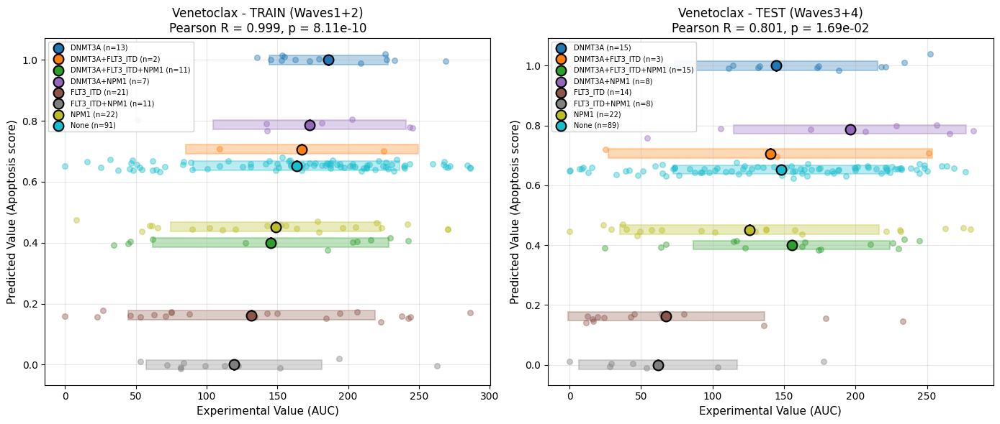

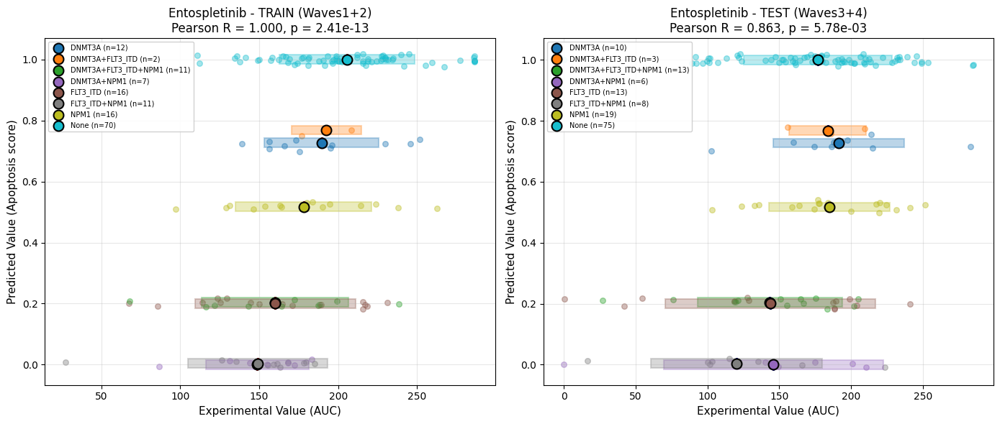

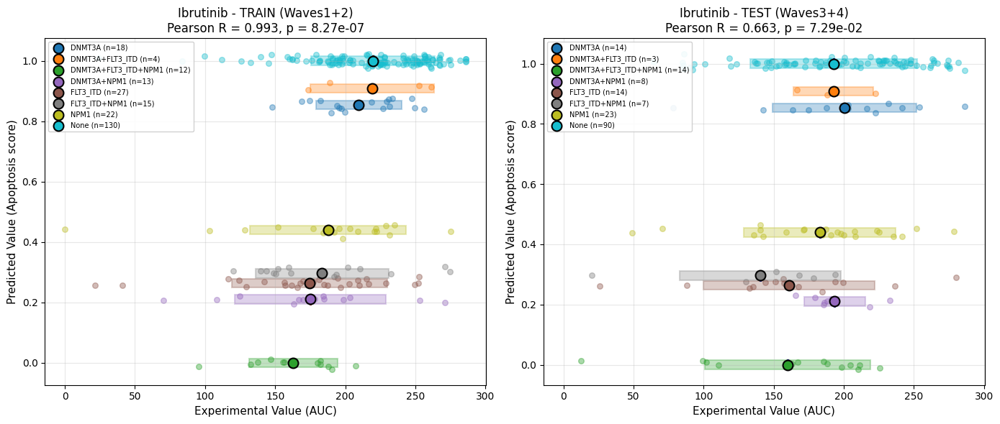

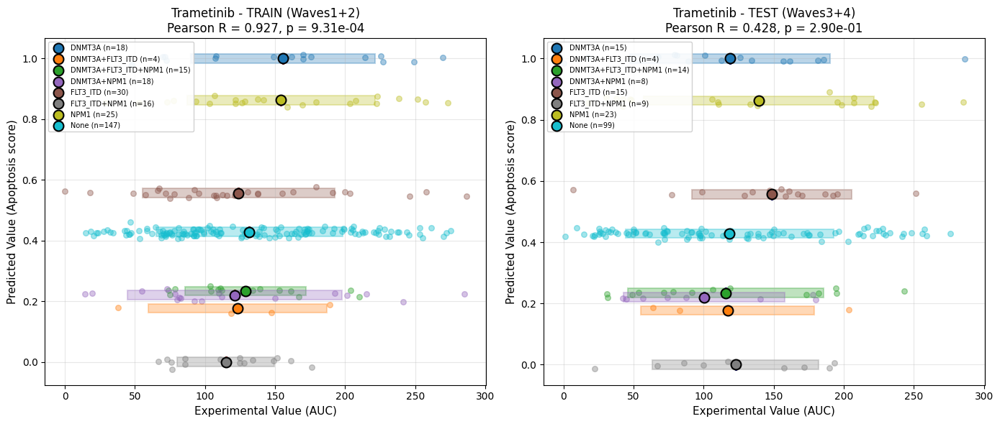

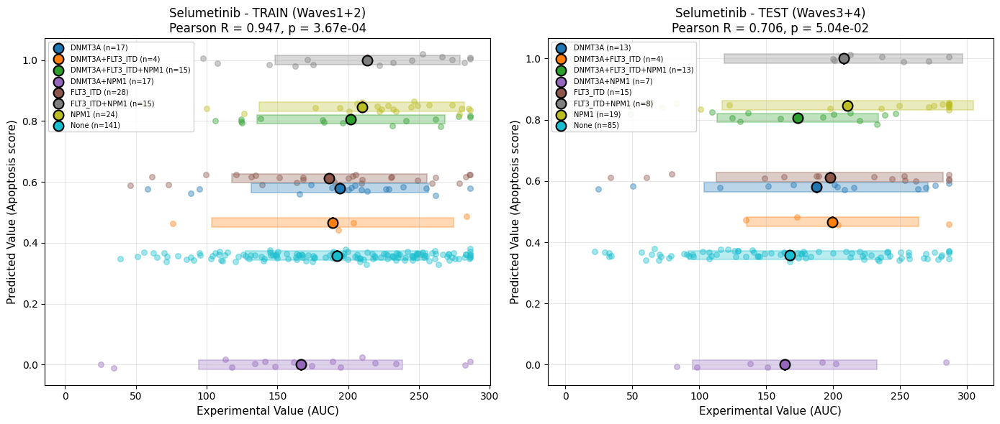

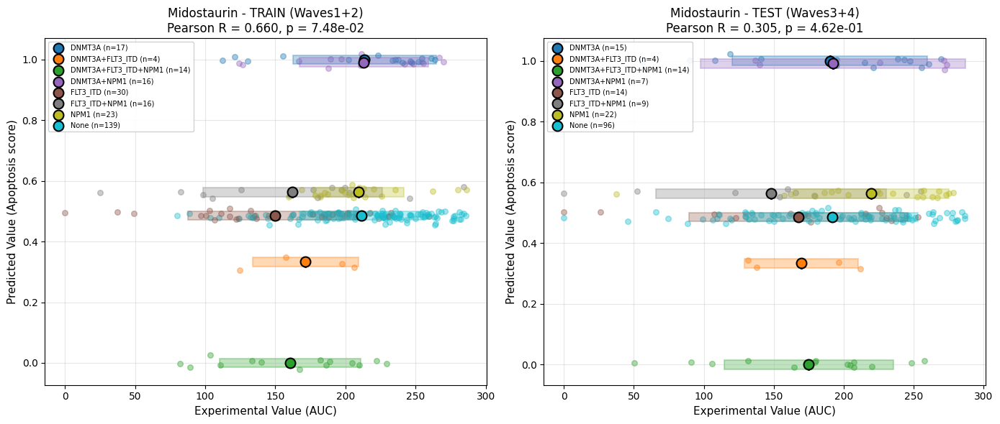

In [121]:
for drug in drugs:
    pred_vs_exp(drug,mutation_genes = ['FLT3_ITD', 'NPM1', 'DNMT3A'])

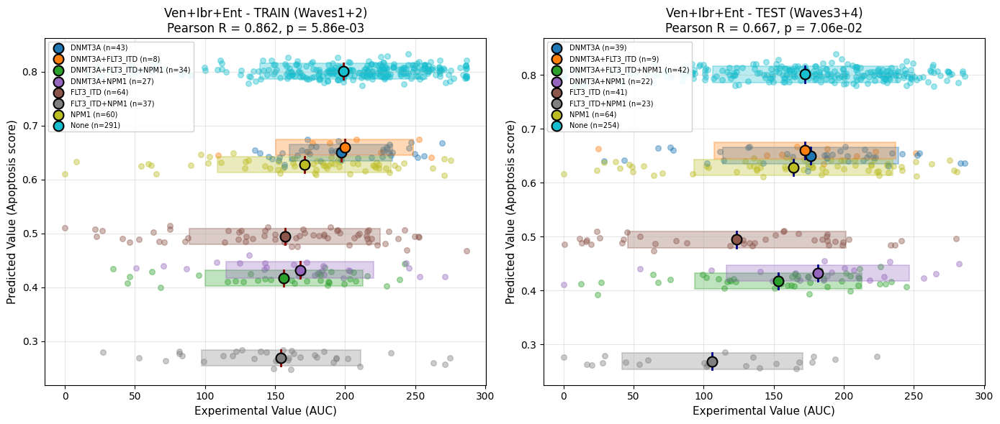

In [97]:
pred_vs_exp('Ven+Ibr+Ent',mutation_genes = ['FLT3_ITD', 'NPM1', 'DNMT3A'],drug2target = drug2target)

TRAIN: 564 samples, TEST: 494 samples
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/combined_train_test_correlation.png


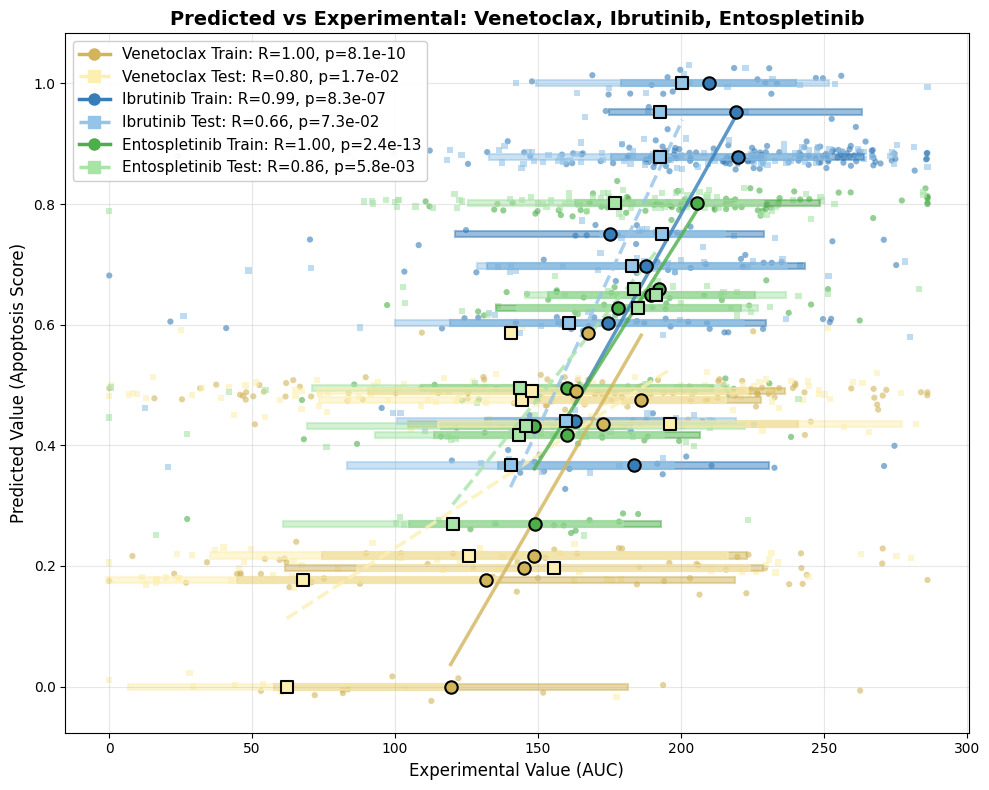

In [210]:
# Combined plot: 3 drugs, train+test on same plot with correlation lines for each

def combined_plot_train_test(drug, df, drug2target, save_path=None):
    """
    Combined plot for BeatAML data with 3 drugs, train and test on the same plot.
    Shows correlation lines for each drug-cohort combination with Pearson R and p annotated.
    """
    from scipy import stats
    from adjustText import adjust_text
    
    def normalize_profile_text(p):
        if isinstance(p, (set, frozenset, list, tuple)):
            genes = sorted(map(str, p))
        else:
            s = re.sub(r'[\{\}]', '', str(p))
            genes = sorted([g.strip() for g in s.split(',') if g.strip()])
        return "+".join(genes) if genes else "None"
    
    # Read simulation results from INDIVIDUAL drug folders (to match evaluation_report R values)
    # Load results for each drug separately
    individual_results = {}
    for drug_name in ['Venetoclax', 'Ibrutinib', 'Entospletinib']:
        train_path = f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug_name}_Waves1+2_AND+OR+IW/detailed_results.csv'
        test_path = f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug_name}_Waves1+2_AND+OR+IW/Waves3+4/detailed_results.csv'
        individual_results[drug_name] = {
            'train': pd.read_csv(train_path),
            'test': pd.read_csv(test_path)
        }
    
    # Also load combined results for plotting (normalized predicted values)
    train_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_Waves1+2_AND+OR+IW/detailed_results.csv')
    test_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_Waves1+2_AND+OR+IW/Waves3+4/detailed_results.csv')
    data_df = pd.read_csv(f'../data/BeatAML_AUC_{drug}_Waves1+2.csv')
    
    # Min-max normalize predicted values to 0-1 (combined normalization)
    def minmax_normalize(series):
        min_val = series.min()
        max_val = series.max()
        if max_val - min_val == 0:
            return series * 0
        return (series - min_val) / (max_val - min_val)
    
    # Normalization
    all_pred = pd.concat([train_results_df['Predicted_Value'], test_results_df['Predicted_Value']])
    min_pred, max_pred = all_pred.min(), all_pred.max()
    train_results_df['Predicted_Normalized'] = (train_results_df['Predicted_Value'] - min_pred) / (max_pred - min_pred)
    test_results_df['Predicted_Normalized'] = (test_results_df['Predicted_Value'] - min_pred) / (max_pred - min_pred)

    # Extract mutation profile from data_df
    all_drug_targets = set()
    for targets in drug2target.values():
        all_drug_targets.update(targets)
    
    def get_profile_label_from_exp(row):
        mutated_genes = set()
        stimuli = str(row.get('Stimuli', ''))
        if stimuli and stimuli != 'nan':
            for gene in stimuli.split(','):
                gene = gene.strip()
                if gene:
                    if gene == 'FLT3':
                        mutated_genes.add('FLT3_ITD')
                    else:
                        mutated_genes.add(gene)
        inhibitors = str(row.get('Inhibitors', ''))
        if inhibitors and inhibitors != 'nan':
            for gene in inhibitors.split(','):
                gene = gene.strip()
                if gene and gene not in all_drug_targets:
                    mutated_genes.add(gene)
        if mutated_genes:
            return '+'.join(sorted(mutated_genes))
        return 'None'
    
    data_df['profile_label'] = data_df.apply(get_profile_label_from_exp, axis=1)
    
    # Get drug name
    def get_drug_name(row):
        inhibitors = str(row.get('Inhibitors', ''))
        for drug_name, targets in drug2target.items():
            for target in targets:
                if target in inhibitors:
                    return drug_name
        return 'Unknown'
    data_df['drug_name'] = data_df.apply(get_drug_name, axis=1)
    
    exp_to_profile = dict(zip(data_df['Experiments'], data_df['profile_label']))
    exp_to_drug = dict(zip(data_df['Experiments'], data_df['drug_name']))
    
    for df_res in [train_results_df, test_results_df]:
        df_res['profile_label'] = df_res['Experiment_ID'].map(exp_to_profile)
        df_res['drug_name'] = df_res['Experiment_ID'].map(exp_to_drug)
    
    # Get individual samples
    drug_samples = df[df['inhibitor'].str.contains('Venetoclax|Ibrutinib|Entospletinib', case=False, na=False)].copy()
    drug_samples['profile_label'] = drug_samples['mutation_profile'].apply(normalize_profile_text)
    
    def get_drug_from_inhibitor(inhibitor):
        inhibitor_lower = str(inhibitor).lower()
        if 'venetoclax' in inhibitor_lower:
            return 'Venetoclax'
        elif 'ibrutinib' in inhibitor_lower:
            return 'Ibrutinib'
        elif 'entospletinib' in inhibitor_lower:
            return 'Entospletinib'
        return 'Unknown'
    
    drug_samples['Drug_name'] = drug_samples['inhibitor'].apply(get_drug_from_inhibitor)
    
    # Separate by cohort
    train_samples = drug_samples[drug_samples['cohort'] == 'Waves1+2'].copy()
    test_samples = drug_samples[drug_samples['cohort'] == 'Waves3+4'].copy()
    
    # Define colors for each drug (solid for train, lighter for test)
    drug_colors_train = {
        'Venetoclax': '#D2B55B',   # Yellow
        'Ibrutinib': '#377EB8',    # Blue
        'Entospletinib': '#4DAF4A', # Green
    }
    drug_colors_test = {
        'Venetoclax': '#FDEFB2',   # Light yellow
        'Ibrutinib': '#94C4E8',    # Light blue
        'Entospletinib': '#A8E4A8', # Light green
    }
    
    # Create single figure
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    box_height = 0.01
    np.random.seed(42)
    
    # Prepare data for train and test
    # Train
    train_results_df['profile_drug'] = train_results_df['profile_label'] + '_' + train_results_df['drug_name']
    pred_map_df = train_results_df[['profile_drug', 'Predicted_Normalized']].drop_duplicates(subset='profile_drug', keep='first')
    train_pred_map = dict(zip(pred_map_df['profile_drug'], pred_map_df['Predicted_Normalized']))
    
    train_samples['profile_drug'] = train_samples['profile_label'] + '_' + train_samples['Drug_name']
    train_samples['predicted'] = train_samples['profile_drug'].map(train_pred_map)
    train_samples = train_samples.dropna(subset=['predicted', 'auc'])
    
    # Test
    test_results_df['profile_drug'] = test_results_df['profile_label'] + '_' + test_results_df['drug_name']
    pred_map_df_test = test_results_df[['profile_drug', 'Predicted_Normalized']].drop_duplicates(subset='profile_drug', keep='first')
    test_pred_map = dict(zip(pred_map_df_test['profile_drug'], pred_map_df_test['Predicted_Normalized']))
    
    test_samples['profile_drug'] = test_samples['profile_label'] + '_' + test_samples['Drug_name']
    test_samples['predicted'] = test_samples['profile_drug'].map(test_pred_map)
    test_samples = test_samples.dropna(subset=['predicted', 'auc'])
    
    print(f"TRAIN: {len(train_samples)} samples, TEST: {len(test_samples)} samples")
    
    # Plot individual samples - TRAIN (filled markers)
    for drug_name in ['Venetoclax', 'Ibrutinib', 'Entospletinib']:
        subset = train_samples[train_samples['Drug_name'] == drug_name]
        for _, row in subset.iterrows():
            y_jitter = row['predicted'] + np.random.normal(0, 0.012)
            ax.scatter(row['auc'], y_jitter, alpha=0.6, s=20, color=drug_colors_train[drug_name], 
                      marker='o', edgecolor='none')
    
    # Plot individual samples - TEST (open markers)
    for drug_name in ['Venetoclax', 'Ibrutinib', 'Entospletinib']:
        subset = test_samples[test_samples['Drug_name'] == drug_name]
        for _, row in subset.iterrows():
            y_jitter = row['predicted'] + np.random.normal(0, 0.012)
            ax.scatter(row['auc'], y_jitter, alpha=0.6, s=20, color=drug_colors_test[drug_name],
                      marker='s', edgecolor='none')
    
    # Calculate mean ± s.d. per profile-drug combination
    # TRAIN
    train_profile_means = train_samples.groupby(['profile_label', 'Drug_name']).agg({
        'auc': ['mean', 'std', 'count'],
        'predicted': 'first'
    }).reset_index()
    train_profile_means.columns = ['profile_label', 'Drug_name', 'auc_mean', 'auc_std', 'count', 'predicted']
    
    # TEST
    test_profile_means = test_samples.groupby(['profile_label', 'Drug_name']).agg({
        'auc': ['mean', 'std', 'count'],
        'predicted': 'first'
    }).reset_index()
    test_profile_means.columns = ['profile_label', 'Drug_name', 'auc_mean', 'auc_std', 'count', 'predicted']
    
    # Plot mean ± s.d. boxes - TRAIN (only if count > 3)
    for _, row in train_profile_means.iterrows():
        mean_val = row['auc_mean']
        std_val = row['auc_std'] if pd.notna(row['auc_std']) else 0
        pred = row['predicted']
        count = row['count']
        color = drug_colors_train[row['Drug_name']]
        
        # Only draw s.d. box if more than 3 points
        if count > 3 and std_val > 0:
            ax.add_patch(plt.Rectangle((mean_val - std_val, pred - box_height/2), 
                                        2*std_val, box_height, 
                                        facecolor=color, alpha=0.5, 
                                        linewidth=1.5, edgecolor=color))
        ax.scatter(mean_val, pred, s=80, color=color, edgecolor='black', linewidth=1.5, zorder=15, marker='o')
    
    # Plot mean ± s.d. boxes - TEST (only if count > 3)
    for _, row in test_profile_means.iterrows():
        mean_val = row['auc_mean']
        std_val = row['auc_std'] if pd.notna(row['auc_std']) else 0
        pred = row['predicted']
        count = row['count']
        color = drug_colors_test[row['Drug_name']]
        
        # Only draw s.d. box if more than 3 points
        if count > 3 and std_val > 0:
            ax.add_patch(plt.Rectangle((mean_val - std_val, pred - box_height/2), 
                                        2*std_val, box_height, 
                                        facecolor=color, alpha=0.5, 
                                        linewidth=1.5, edgecolor=color))
        ax.scatter(mean_val, pred, s=80, color=color, edgecolor='black', linewidth=1.5, zorder=15, marker='s')
    
    # Calculate and plot correlation lines for each drug-cohort combination
    # Use INDIVIDUAL drug results for R and p (same as evaluation_report.txt)
    corr_stats = {}
    
    for drug_name in ['Venetoclax', 'Ibrutinib', 'Entospletinib']:
        # Get individual drug results (from separate optimization runs)
        train_indiv = individual_results[drug_name]['train']
        test_indiv = individual_results[drug_name]['test']
        
        # TRAIN correlation - use individual drug results (matches evaluation_report.txt)
        train_drug_plot = train_profile_means[train_profile_means['Drug_name'] == drug_name]
        if len(train_indiv) >= 2:
            r_train, p_train = stats.pearsonr(train_indiv['Predicted_Value'], train_indiv['Measured_Value'])
            corr_stats[(drug_name, 'Train')] = (r_train, p_train)
        if len(train_drug_plot) >= 2:
            slope, intercept, _, _, _ = stats.linregress(train_drug_plot['auc_mean'], train_drug_plot['predicted'])
            x_line = np.linspace(train_drug_plot['auc_mean'].min(), train_drug_plot['auc_mean'].max(), 100)
            y_line = slope * x_line + intercept
            line_color = drug_colors_train[drug_name]
            ax.plot(x_line, y_line, color=line_color, linewidth=2.5, linestyle='-', alpha=0.8)
        
        # TEST correlation - use individual drug results (matches evaluation_report.txt)
        test_drug_plot = test_profile_means[test_profile_means['Drug_name'] == drug_name]
        if len(test_indiv) >= 2:
            r_test, p_test = stats.pearsonr(test_indiv['Predicted_Value'], test_indiv['Measured_Value'])
            corr_stats[(drug_name, 'Test')] = (r_test, p_test)
        if len(test_drug_plot) >= 2:
            slope, intercept, _, _, _ = stats.linregress(test_drug_plot['auc_mean'], test_drug_plot['predicted'])
            x_line = np.linspace(test_drug_plot['auc_mean'].min(), test_drug_plot['auc_mean'].max(), 100)
            y_line = slope * x_line + intercept
            line_color = drug_colors_test[drug_name]
            ax.plot(x_line, y_line, color=line_color, linewidth=2.5, linestyle='--', alpha=0.8)
    
    ax.set_xlabel('Experimental Value (AUC)', fontsize=12)
    ax.set_ylabel('Predicted Value (Apoptosis Score)', fontsize=12)
    ax.set_title(f'Predicted vs Experimental: Venetoclax, Ibrutinib, Entospletinib', 
                fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    # Legend with R and p values
    from matplotlib.lines import Line2D
    legend_elements = []
    
    for drug_name in ['Venetoclax', 'Ibrutinib', 'Entospletinib']:
        # Train
        if (drug_name, 'Train') in corr_stats:
            r, p = corr_stats[(drug_name, 'Train')]
            legend_elements.append(Line2D([0], [0], color=drug_colors_train[drug_name], linewidth=2.5, 
                                         linestyle='-', marker='o', markersize=8,
                                         label=f'{drug_name} Train: R={r:.2f}, p={p:.1e}'))
        # Test
        if (drug_name, 'Test') in corr_stats:
            r, p = corr_stats[(drug_name, 'Test')]
            legend_elements.append(Line2D([0], [0], color=drug_colors_test[drug_name], linewidth=2.5, 
                                         linestyle='--', marker='s', markersize=8,
                                         label=f'{drug_name} Test: R={r:.2f}, p={p:.1e}'))
    
    ax.legend(handles=legend_elements, loc='upper left', fontsize=11, framealpha=0.95)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")
    
    plt.show()
    
# Run the combined plot
combined_plot_train_test(
    drug='Ven+Ibr+Ent', 
    df=df, 
    drug2target=drug2target,
    save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/combined_train_test_correlation.png'
)

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/BeatAML_AUC_Ven+Ibr+Ent_Waves1+2.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/Waves1+2')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/Waves1+2_AND+OR+IW/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/Waves1+2_AND+OR+IW/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/Waves1+2_AND+OR+IW/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/Waves1+2_AND+OR+IW/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/Waves1+2_AND+OR+IW/pbn.txt


In [507]:
def expanded_plot_beataml(drug, df, drug2target, text_size=7, extended_gene=None, use_spearman=False, save_path=None):
    """
    Expanded plot for BeatAML data with individual samples, colored by drug.
    Generates side-by-side plots for Waves1+2 (train) and Waves3+4 (test).
    
    Parameters:
    -----------
    drug : str
        Drug name or combined drugs (e.g., 'Venetoclax' or 'Ven+Ibr+Ent')
    df : DataFrame
        BeatAML data with columns: inhibitor, mutation_profile, auc, cohort
    drug2target : dict
        Mapping of drug names to their target genes
    text_size : int
        Font size for text annotations
    extended_gene : str
        Extended gene name (e.g., 'TP53')
    use_spearman : bool
        If True, use Spearman correlation; otherwise use Pearson
    save_path : str
        Path to save the figure (optional)
    """
    from scipy import stats
    from scipy.stats import spearmanr
    from itertools import combinations
    from adjustText import adjust_text

    # Color for highlighting points containing extended_gene in their label
    highlight_color = '#D783FF'
    
    def normalize_profile_text(p):
        """Normalize mutation profile to consistent text format"""
        if isinstance(p, (set, frozenset, list, tuple)):
            genes = sorted(map(str, p))
        else:
            s = re.sub(r'[\{\}]', '', str(p))
            genes = sorted([g.strip() for g in s.split(',') if g.strip()])
        return "+".join(genes) if genes else "None"
    
    # Read simulation results
    if extended_gene:
        name = f'{drug}_{extended_gene}'
    else:
        name = drug
    if extended_gene == 'NRAS':
        train_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_NRAS_DAB_Waves1+2_AND+OR+IW/detailed_results.csv')
        test_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_NRAS_DAB_Waves1+2_AND+OR+IW/Waves3+4/detailed_results.csv')
    else:
        train_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{name}_Waves1+2_AND+OR+IW/detailed_results.csv')
        test_results_df = pd.read_csv(f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{name}_Waves1+2_AND+OR+IW/Waves3+4/detailed_results.csv')
    data_df_train = pd.read_csv(f'../data/BeatAML_AUC_{name}_Waves1+2.csv')
    data_df_test = pd.read_csv(f'../data/BeatAML_AUC_{name}_Waves3+4.csv')
    
    # Min-max normalize predicted values to 0-1
    def minmax_normalize(series):
        min_val = series.min()
        max_val = series.max()
        if max_val - min_val == 0:
            return series * 0
        return (series - min_val) / (max_val - min_val)
    
    train_results_df['Predicted_Normalized'] = minmax_normalize(train_results_df['Predicted_Value'])
    test_results_df['Predicted_Normalized'] = minmax_normalize(test_results_df['Predicted_Value'])
    
    # Extract mutation profile from data_df
    all_drug_targets = set()
    for targets in drug2target.values():
        all_drug_targets.update(targets)
    
    def get_profile_label_from_exp(row):
        """Extract mutation profile from Stimuli and Inhibitors columns"""
        mutated_genes = set()
        stimuli = str(row.get('Stimuli', ''))
        if stimuli and stimuli != 'nan':
            for gene in stimuli.split(','):
                gene = gene.strip()
                if gene:
                    if gene == 'FLT3':
                        mutated_genes.add('FLT3_ITD')
                    else:
                        mutated_genes.add(gene)
        inhibitors = str(row.get('Inhibitors', ''))
        if inhibitors and inhibitors != 'nan':
            for gene in inhibitors.split(','):
                gene = gene.strip()
                if gene and gene not in all_drug_targets:
                    mutated_genes.add(gene)
        if mutated_genes:
            return '+'.join(sorted(mutated_genes))
        return 'None'
    
    # Add profile_label and drug name to data_df
    data_df_train['profile_label'] = data_df_train.apply(get_profile_label_from_exp, axis=1)
    data_df_test['profile_label'] = data_df_test.apply(get_profile_label_from_exp, axis=1)

    # Get drug name
    data_df_train['drug_name'] = drug
    data_df_test['drug_name'] = drug
    exp_to_drug_train = dict(zip(data_df_train['Experiments'], data_df_train['drug_name']))
    exp_to_drug_test = dict(zip(data_df_test['Experiments'], data_df_test['drug_name']))

    exp_to_profile_train = dict(zip(data_df_train['Experiments'], data_df_train['profile_label']))
    exp_to_profile_test = dict(zip(data_df_test['Experiments'], data_df_test['profile_label']))
    
    train_results_df['profile_label'] = train_results_df['Experiment_ID'].map(exp_to_profile_train)
    train_results_df['drug_name'] = train_results_df['Experiment_ID'].map(exp_to_drug_train)
    test_results_df['profile_label'] = test_results_df['Experiment_ID'].map(exp_to_profile_test)
    test_results_df['drug_name'] = test_results_df['Experiment_ID'].map(exp_to_drug_test)
    
    # Get individual samples from df
    if drug == 'Ven+Ibr+Ent':
        drug_samples = df[df['inhibitor'].str.contains('Venetoclax|Ibrutinib|Entospletinib', case=False, na=False)].copy()
    elif drug == '5drugs':
        drug_samples = df[df['inhibitor'].str.contains('Venetoclax|Ibrutinib|Entospletinib|Midostaurin|Selumetinib', case=False, na=False)].copy()
    else:
        drug_samples = df[df['inhibitor'].str.contains(drug, case=False, na=False)].copy()
    
    drug_samples['profile_label'] = drug_samples['mutation_profile'].apply(normalize_profile_text)
    
    # Map inhibitor to drug name for coloring
    def get_drug_from_inhibitor(inhibitor):
        inhibitor_lower = str(inhibitor).lower()
        if 'venetoclax' in inhibitor_lower:
            return 'Venetoclax'
        elif 'ibrutinib' in inhibitor_lower:
            return 'Ibrutinib'
        elif 'entospletinib' in inhibitor_lower:
            return 'Entospletinib'
        elif 'trametinib' in inhibitor_lower:
            return 'Trametinib'
        elif 'selumetinib' in inhibitor_lower:
            return 'Selumetinib'
        elif 'midostaurin' in inhibitor_lower:
            return 'Midostaurin'
        return 'Unknown'
    
    drug_samples['Drug_name'] = drug_samples['inhibitor'].apply(get_drug_from_inhibitor)
    
    # Separate by cohort
    train_samples = drug_samples[drug_samples['cohort'] == 'Waves1+2'].copy()
    test_samples = drug_samples[drug_samples['cohort'] == 'Waves3+4'].copy()
    
    # Create figure with 2 subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
    
    # Define colors for each drug
    drug_colors = {
        'Venetoclax': '#D2B55B',   # Yellow
        'Ibrutinib': '#377EB8',    # Blue
        'Entospletinib': '#4DAF4A', # Green
        'Selumetinib': '#C0C0C0',  # gray
        'Midostaurin': '#C0C0C0',  # gray
        'Trametinib': '#C0C0C0',  # gray
    }
    
    box_height = 0.01
    np.random.seed(42)
    
    # --- TRAIN PLOT (Waves1+2) ---
    # Create profile_drug mapping for train
    train_results_df['profile_drug'] = train_results_df['profile_label'] + '_' + train_results_df['drug_name']
    pred_map_df = train_results_df[['profile_drug', 'Predicted_Normalized']].drop_duplicates(subset='profile_drug', keep='first')
    train_pred_map = dict(zip(pred_map_df['profile_drug'], pred_map_df['Predicted_Normalized']))
    
    train_samples['profile_drug'] = train_samples['profile_label'] + '_' + train_samples['Drug_name']
    train_samples['predicted'] = train_samples['profile_drug'].map(train_pred_map)
    train_samples = train_samples.dropna(subset=['predicted', 'auc'])
    
    print(f"TRAIN: Matched {len(train_samples)} individual samples to predictions")
    
    if len(train_samples) > 0:
        # Plot individual samples with jitter, highlighting if profile_label has extended_gene
        for _, row in train_samples.iterrows():
            y_jitter = row['predicted'] + np.random.normal(0, 0.012)
            if extended_gene is not None and extended_gene in row['profile_label'].split('+'):
                color = highlight_color
            else:
                color = drug_colors.get(row['Drug_name'], 'gray')
            ax1.scatter(row['auc'], y_jitter, alpha=0.4, s=30, color=color)

        # Calculate mean ± s.d. per profile-drug combination
        profile_drug_means = train_samples.groupby(['profile_label', 'Drug_name']).agg({
            'auc': ['mean', 'std', 'count'],
            'predicted': 'first'
        }).reset_index()
        profile_drug_means.columns = ['profile_label', 'Drug_name', 'auc_mean', 'auc_std', 'count', 'predicted']
        
        # Correlation
        if use_spearman:
            r, p_value = spearmanr(profile_drug_means['auc_mean'], profile_drug_means['predicted'])
            corr_label = 'Spearman'
        else:
            r, p_value = stats.pearsonr(profile_drug_means['auc_mean'], profile_drug_means['predicted'])
            corr_label = 'Pearson'
        
        # Correlation line
        if len(profile_drug_means) >= 2:
            slope, intercept, _, _, _ = stats.linregress(profile_drug_means['auc_mean'], profile_drug_means['predicted'])
            x_line = np.linspace(profile_drug_means['auc_mean'].min(), profile_drug_means['auc_mean'].max(), 100)
            y_line = slope * x_line + intercept
            ax1.plot(x_line, y_line, color='gray', linewidth=2, linestyle='--', alpha=0.8)

        # Plot mean ± s.d. patches and collect text annotations (highlighting if label contains extended_gene)
        train_texts = []
        for _, row in profile_drug_means.iterrows():
            mean_val = row['auc_mean']
            std_val = row['auc_std'] if pd.notna(row['auc_std']) else 0
            pred = row['predicted']
            base_color = drug_colors.get(row['Drug_name'], 'gray')
            # Decide if highlight for dot (background of marker)
            if extended_gene is not None and extended_gene in row['profile_label'].split('+'):
                marker_facecolor = highlight_color
                edgecolor = highlight_color
            else:
                marker_facecolor = base_color
                edgecolor = 'black'
            # Patch remains drug color as normal
            ax1.add_patch(plt.Rectangle((mean_val - std_val, pred - box_height/2), 
                                        2*std_val, box_height, 
                                        facecolor=base_color, alpha=0.3, 
                                        linewidth=1.5, edgecolor=base_color))
            ax1.plot([mean_val, mean_val], [pred - box_height/2, pred + box_height/2], 
                    color='darkred', linewidth=2, zorder=10)
            ax1.scatter(mean_val, pred, s=100, color=marker_facecolor, edgecolor=edgecolor, linewidth=1.5, zorder=15)
            
            # Collect text annotations for adjustText
            txt = ax1.text(mean_val, pred, f'{row["profile_label"]}', 
                          fontsize=text_size, alpha=0.8, ha='center', va='top')
            train_texts.append(txt)
        
        # Adjust text positions to avoid overlap
        adjust_text(train_texts, ax=ax1, arrowprops=dict(arrowstyle='-', color='black', lw=0.5))
        
        ax1.set_xlabel('Experimental Value (AUC)', fontsize=11)
        ax1.set_ylabel('Predicted Value (reversed Apoptosis Score)', fontsize=11)
        if extended_gene:
            ax1.set_title(f'{drug} ({extended_gene} extension) - TRAIN (Waves1+2)\n({corr_label} r={r:.3f}, p={p_value:.3e})', fontsize=12, fontweight='bold')
        else:
            ax1.set_title(f'{drug} - TRAIN (Waves1+2)\n({corr_label} r={r:.3f}, p={p_value:.3e})', fontsize=12, fontweight='bold')
        ax1.grid(True, alpha=0.3)
    
    # --- TEST PLOT (Waves3+4) ---
    test_results_df['profile_drug'] = test_results_df['profile_label'] + '_' + test_results_df['drug_name']
    pred_map_df = test_results_df[['profile_drug', 'Predicted_Normalized']].drop_duplicates(subset='profile_drug', keep='first')
    test_pred_map = dict(zip(pred_map_df['profile_drug'], pred_map_df['Predicted_Normalized']))
    
    test_samples['profile_drug'] = test_samples['profile_label'] + '_' + test_samples['Drug_name']
    test_samples['predicted'] = test_samples['profile_drug'].map(test_pred_map)
    test_samples = test_samples.dropna(subset=['predicted', 'auc'])
    
    print(f"TEST: Matched {len(test_samples)} individual samples to predictions")
    
    if len(test_samples) > 0:
        # Plot individual samples with jitter, highlighting if profile_label has extended_gene
        for _, row in test_samples.iterrows():
            y_jitter = row['predicted'] + np.random.normal(0, 0.012)
            if extended_gene is not None and extended_gene in row['profile_label'].split('+'):
                color = highlight_color
            else:
                color = drug_colors.get(row['Drug_name'], 'gray')
            ax2.scatter(row['auc'], y_jitter, alpha=0.4, s=30, color=color)
        
        # Calculate mean ± s.d. per profile-drug combination
        profile_drug_means = test_samples.groupby(['profile_label', 'Drug_name']).agg({
            'auc': ['mean', 'std', 'count'],
            'predicted': 'first'
        }).reset_index()
        profile_drug_means.columns = ['profile_label', 'Drug_name', 'auc_mean', 'auc_std', 'count', 'predicted']
        
        # Correlation
        if use_spearman:
            r, p_value = spearmanr(profile_drug_means['auc_mean'], profile_drug_means['predicted'])
            corr_label = 'Spearman'
        else:
            r, p_value = stats.pearsonr(profile_drug_means['auc_mean'], profile_drug_means['predicted'])
            corr_label = 'Pearson'

        # Correlation line
        if len(profile_drug_means) >= 2:
            slope, intercept, _, _, _ = stats.linregress(profile_drug_means['auc_mean'], profile_drug_means['predicted'])
            x_line = np.linspace(profile_drug_means['auc_mean'].min(), profile_drug_means['auc_mean'].max(), 100)
            y_line = slope * x_line + intercept
            line_color = drug_colors[drug_name]
            ax2.plot(x_line, y_line, color='gray', linewidth=2, linestyle='--', alpha=0.8)    
                
        # Plot mean ± s.d. patches and collect text annotations
        test_texts = []
        for _, row in profile_drug_means.iterrows():
            mean_val = row['auc_mean']
            std_val = row['auc_std'] if pd.notna(row['auc_std']) else 0
            pred = row['predicted']
            base_color = drug_colors.get(row['Drug_name'], 'gray')
            # Decide if highlight for dot (background of marker)
            if extended_gene is not None and extended_gene in row['profile_label'].split('+'):
                marker_facecolor = highlight_color
                edgecolor = highlight_color
            else:
                marker_facecolor = base_color
                edgecolor = 'black'
            ax2.add_patch(plt.Rectangle((mean_val - std_val, pred - box_height/2), 
                                        2*std_val, box_height, 
                                        facecolor=base_color, alpha=0.3, 
                                        linewidth=1.5, edgecolor=base_color))
            ax2.plot([mean_val, mean_val], [pred - box_height/2, pred + box_height/2], 
                    color='darkblue', linewidth=2, zorder=10)
            ax2.scatter(mean_val, pred, s=100, color=marker_facecolor, edgecolor=edgecolor, linewidth=1.5, zorder=15)
            
            # Collect text annotations for adjustText
            txt = ax2.text(mean_val, pred, f'{row["profile_label"]}', 
                          fontsize=text_size, alpha=0.8, ha='center', va='top')
            test_texts.append(txt)
        
        # Adjust text positions to avoid overlap
        adjust_text(test_texts, ax=ax2, arrowprops=dict(arrowstyle='-', color='black', lw=0.5))
        
        ax2.set_xlabel('Experimental Value (AUC)', fontsize=11)
        ax2.set_ylabel('Predicted Value (reversed Apoptosis Score)', fontsize=11)
        if extended_gene:
            ax2.set_title(f'{drug} ({extended_gene} extension) - TEST (Waves3+4)\n({corr_label} r={r:.3f}, p={p_value:.3e})', fontsize=12, fontweight='bold')
        else:
            ax2.set_title(f'{drug} - TEST (Waves3+4)\n({corr_label} r={r:.3f}, p={p_value:.3e})', fontsize=12, fontweight='bold')
        ax2.grid(True, alpha=0.3)
    
    # Legend for drugs (outside plot)
    if drug == 'Ven+Ibr+Ent' or drug == '5drugs':
        used_drugs = set(drug_samples['Drug_name'].unique())
        legend_handles = [plt.scatter([], [], c=drug_colors.get(d, 'gray'), s=60, label=d) 
                        for d in drug_colors.keys() if d in used_drugs]
        ax2.legend(handles=legend_handles, loc='upper left', bbox_to_anchor=(1.02, 1), fontsize=9)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")
    
    plt.show()

TRAIN: Matched 178 individual samples to predictions
TEST: Matched 174 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


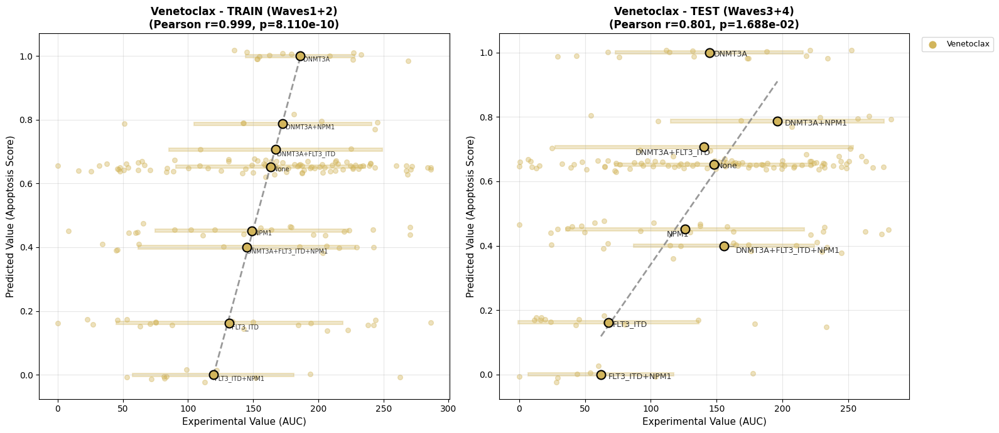

TRAIN: Matched 145 individual samples to predictions
TEST: Matched 147 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


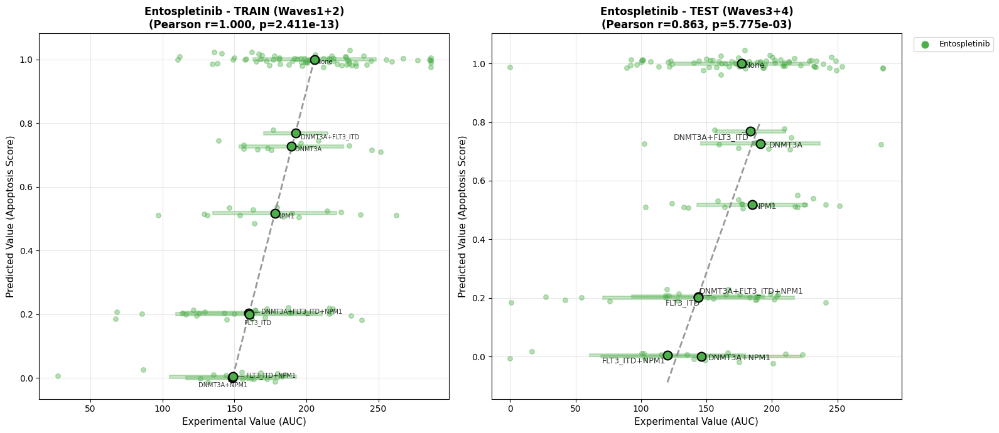

TRAIN: Matched 241 individual samples to predictions
TEST: Matched 173 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


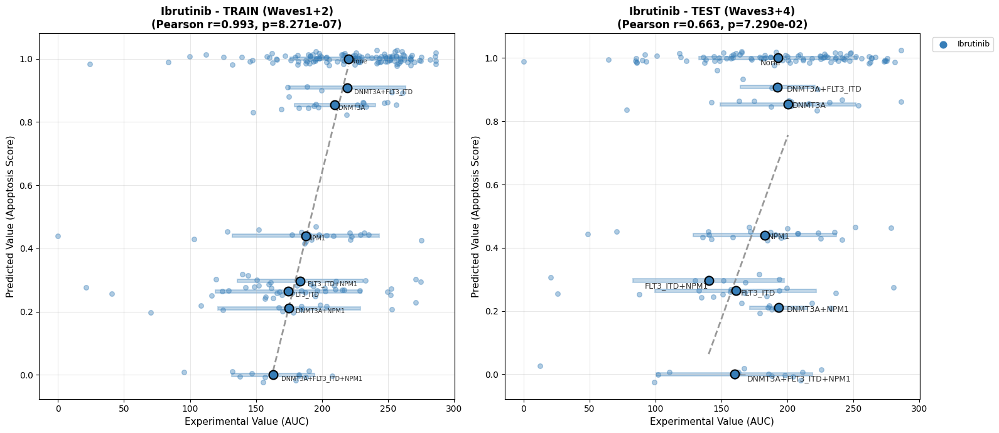

TRAIN: Matched 273 individual samples to predictions
TEST: Matched 187 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Trametinib_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


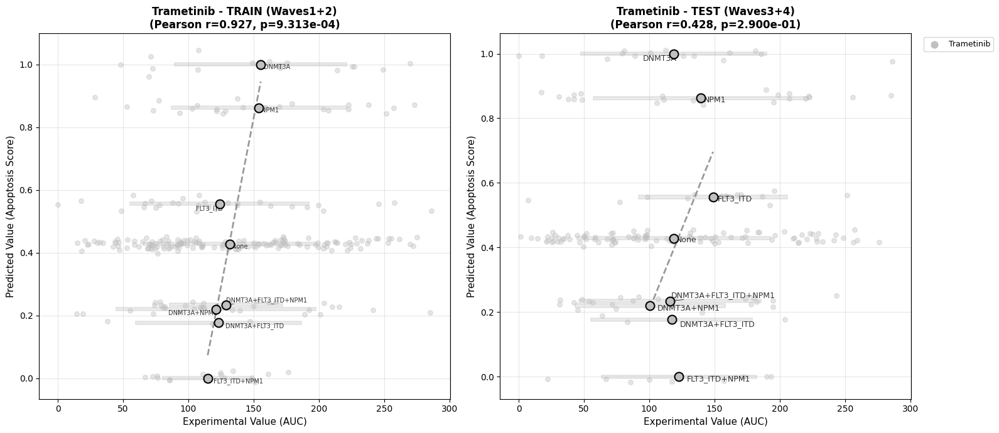

TRAIN: Matched 261 individual samples to predictions
TEST: Matched 164 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Selumetinib_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


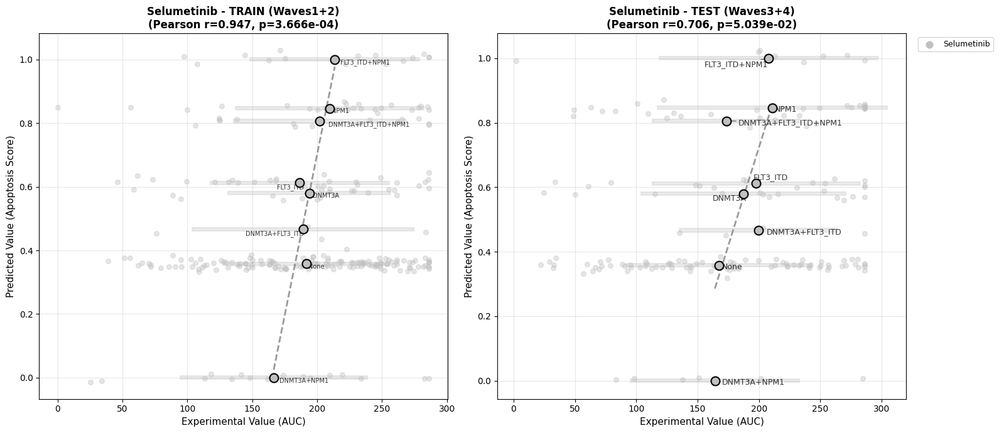

TRAIN: Matched 259 individual samples to predictions
TEST: Matched 181 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Midostaurin_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


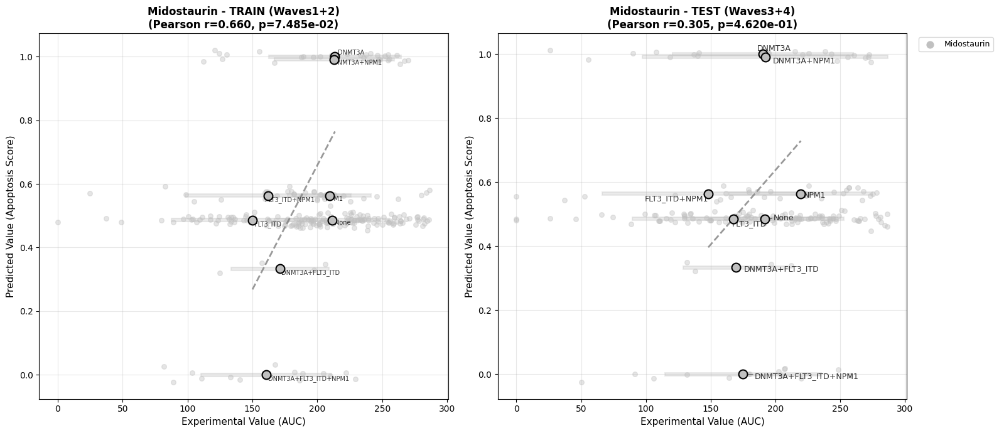

In [430]:
# Plot for each drug
for drug in drugs:
    expanded_plot_beataml(
        drug=drug, 
        df=df, 
        drug2target=drug2target, 
        text_size=9,
        use_spearman=False,
        save_path=f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png'
    )

TRAIN: Matched 564 individual samples to predictions
TEST: Matched 494 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


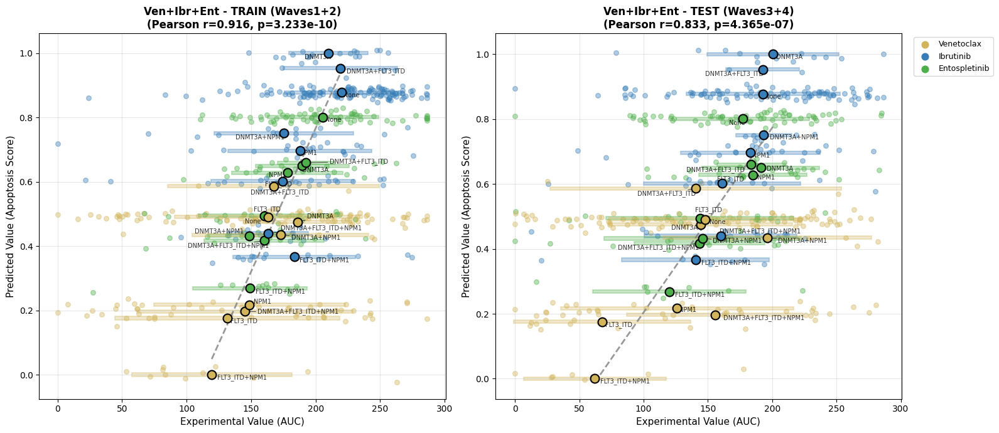

In [322]:
# Plot for combined drugs (Venetoclax + Ibrutinib + Entospletinib)
expanded_plot_beataml(
    drug='Ven+Ibr+Ent', 
    df=df, 
    drug2target=drug2target, 
    use_spearman=False,
    save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png'
)

In [320]:
drug2target

{'Venetoclax': ['BCL2'],
 'Ibrutinib': ['BTK'],
 'Entospletinib': ['SYK'],
 'Trametinib': ['MAP2K1', 'MAP2K2'],
 'Selumetinib': ['MAP2K1', 'MAP2K2'],
 'Midostaurin': ['FLT3', 'KIT']}

TRAIN: Matched 1084 individual samples to predictions
TEST: Matched 839 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


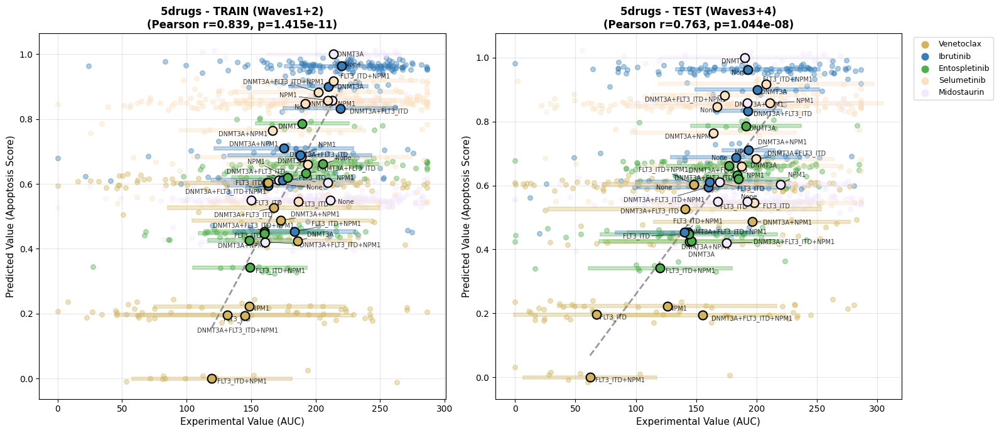

In [327]:
# Plot for combined 5 drugs
expanded_plot_beataml(
    drug='5drugs', 
    df=df, 
    drug2target=drug2target, 
    use_spearman=False,
    save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png'
)

# Extend to more genes
## NRAS

In [ ]:
# The Palma model
network = KGBN.load_network(network_file_no_phenotype)
# extended PBN by adding drug targets
genes = list(network.nodeDict.keys())
genes = genes + ['NRAS','TP53']
KG_string, relations = KGBN.load_signor_network(genes, joiner='&')
KG = KGBN.load_network_from_string(KG_string)
KGBN.vis_network(KG, output_html="NRAS+TP53_KG.html", interactive=True, color_node='#E1F2D0', physics=False)
# Visualize extended PBN
pbn_string = KGBN.merge_networks([network, KG], method="PBN", prob=0.6)
pbn = KGBN.load_pbn_from_string(pbn_string)
vis_extension(network,pbn, output_html="Palma2021+KG_NRAS+TP53.html", interactive=True, color_node='lightblue', color_edge='lightblue', extension_color_node='#D783FF', physics=False)

No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
number of genes found: 20
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 4893, 7157]
No initial state provided, using a random initial state
Network loaded successfully. There are 20 genes in the network.
Network visualization saved to NRAS+TP53_KG.html
No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Extension comparison:
  Original nodes: 18
  Extended nodes: 20
  New nodes: 2 - ['DAB2IP', 'NRAS']
  Original edges: 20
  Extended edges: 42
  New edges: 22
Extension visualization saved to Palma2021+KG_NRAS+TP53.html


In [499]:
# Create dataset with drug response and mutations
sample_mutations = {}
for ptid in mutation_matrix.index:
    mutated_genes = mutation_matrix.loc[ptid][mutation_matrix.loc[ptid] == 1].index.tolist()
    # Filter to only model genes
    # mutated_genes_in_model = [g for g in mutated_genes if g in pbn.nodeDict.keys()]
    mutated_genes_in_model = [g for g in mutated_genes if g in ['FLT3_ITD', 'NPM1', 'DNMT3A', 'NRAS']]
    sample_mutations[ptid] = set(mutated_genes_in_model)

# Create mutation profile mapping
mutation_profiles = []
for _, row in sample_to_ptid.iterrows():
    ptid = row['ptid']
    if ptid in sample_mutations:
        mutation_profiles.append({
            'dbgap_sample_id': row['dbgap_sample_id'],
            'ptid': ptid,
            'mutation_profile': sample_mutations[ptid]
        })

mutation_profile_df = pd.DataFrame(mutation_profiles)

# Merge with drug response data
drug_response_merged = pd.merge(
    mutation_profile_df,
    drug_response,
    left_on='dbgap_sample_id',
    right_on='dbgap_dnaseq_sample',
    how='inner'
)

# Filter for selected drugs of interest
df = drug_response_merged[drug_response_merged['inhibitor'].apply(lambda x: any(drug in x for drug in drugs))].copy()

# Merge cohort information
df = pd.merge(df, sample_to_ptid[['dbgap_sample_id', 'cohort']], on='dbgap_sample_id', how='left')

print(f"dataset: {len(df)} records")
print(f"Drugs: {sorted(df['inhibitor'].unique())}")

dataset: 2383 records
Drugs: ['Entospletinib (GS-9973)', 'Ibrutinib (PCI-32765)', 'Midostaurin', 'Selumetinib (AZD6244)', 'Trametinib (GSK1120212)', 'Venetoclax']


Drug:Entospletinib (GS-9973)


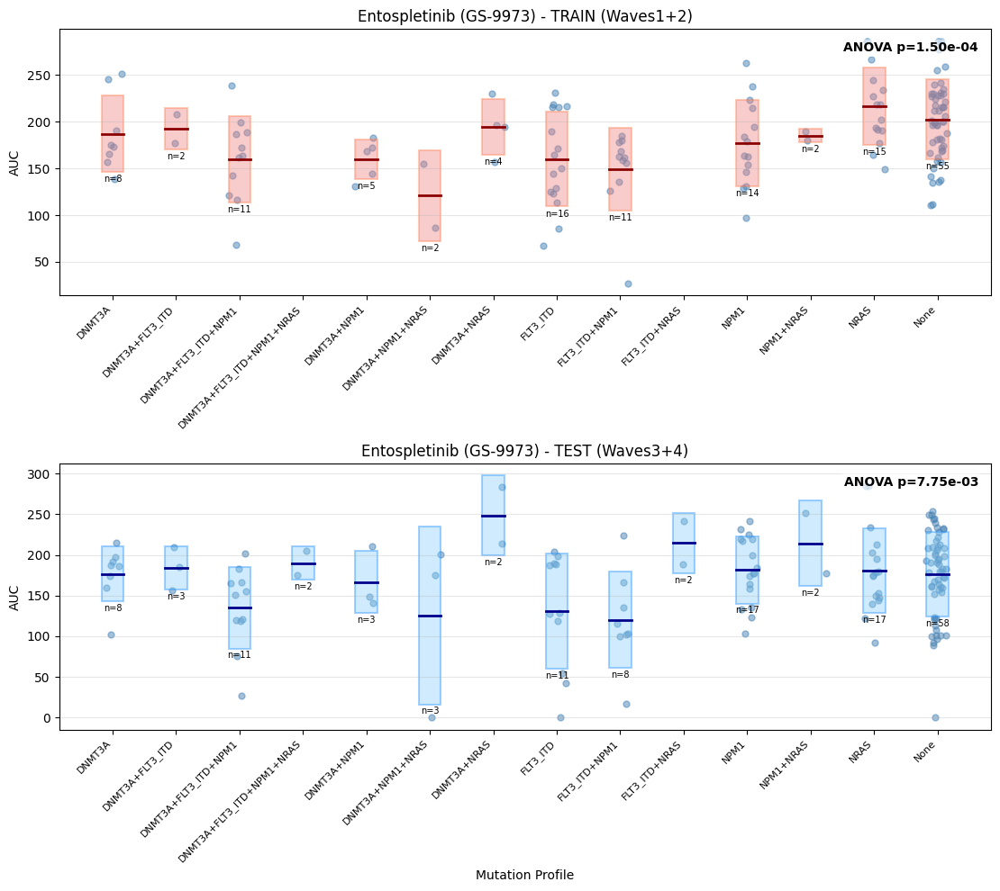

Drug:Ibrutinib (PCI-32765)


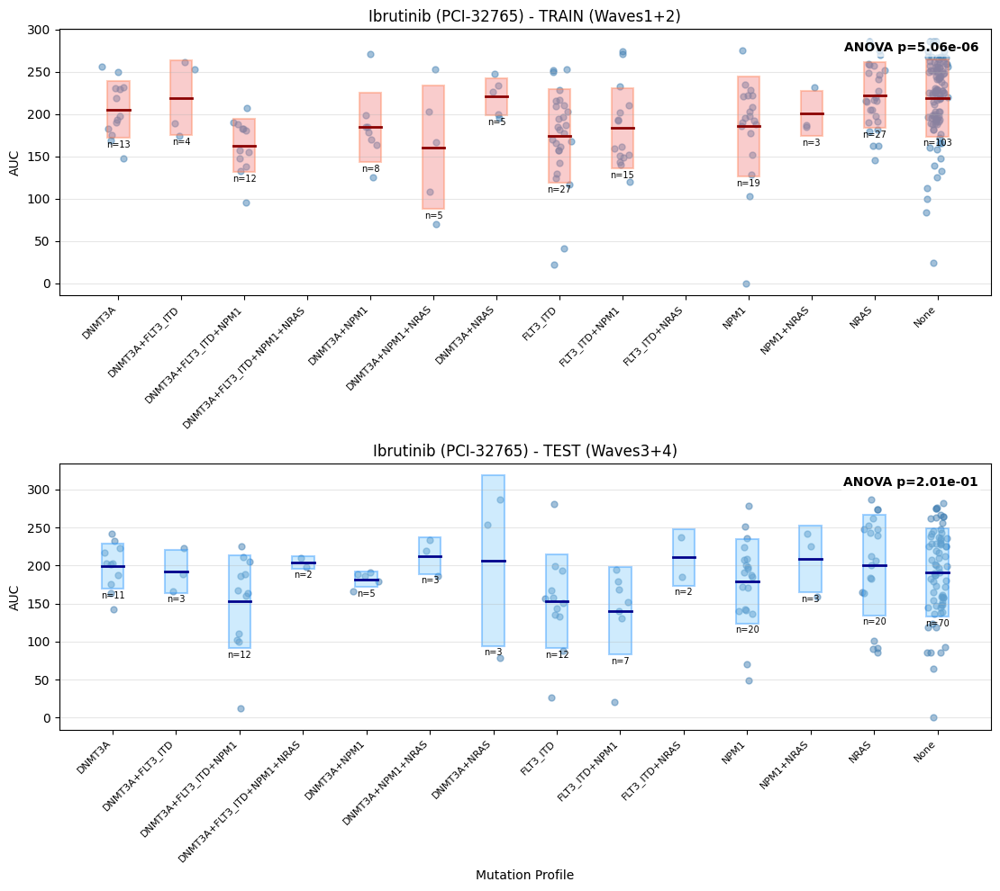

Drug:Midostaurin


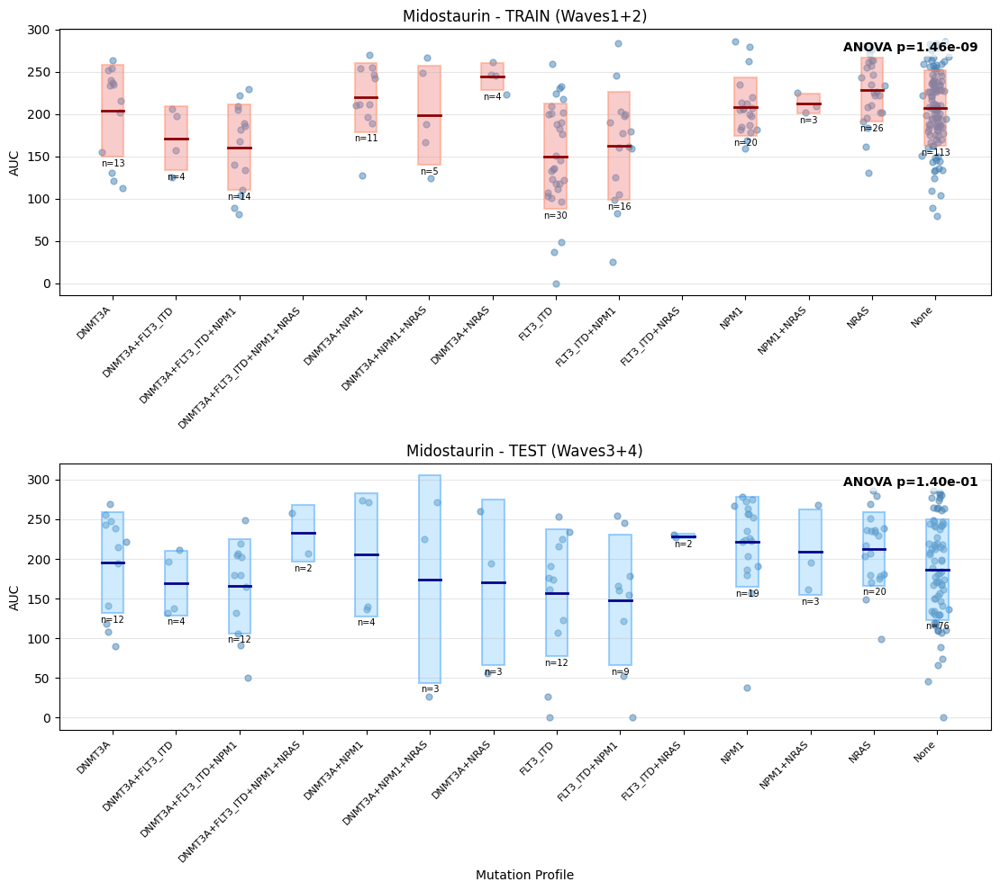

Drug:Selumetinib (AZD6244)


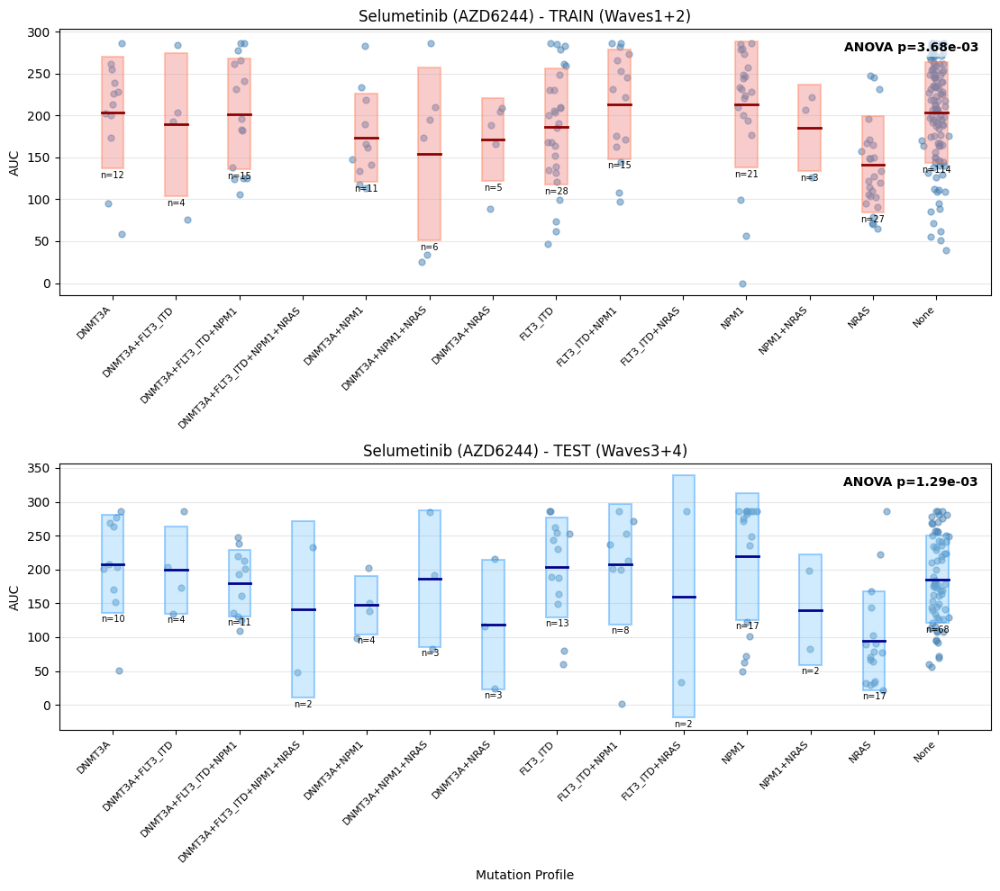

Drug:Trametinib (GSK1120212)


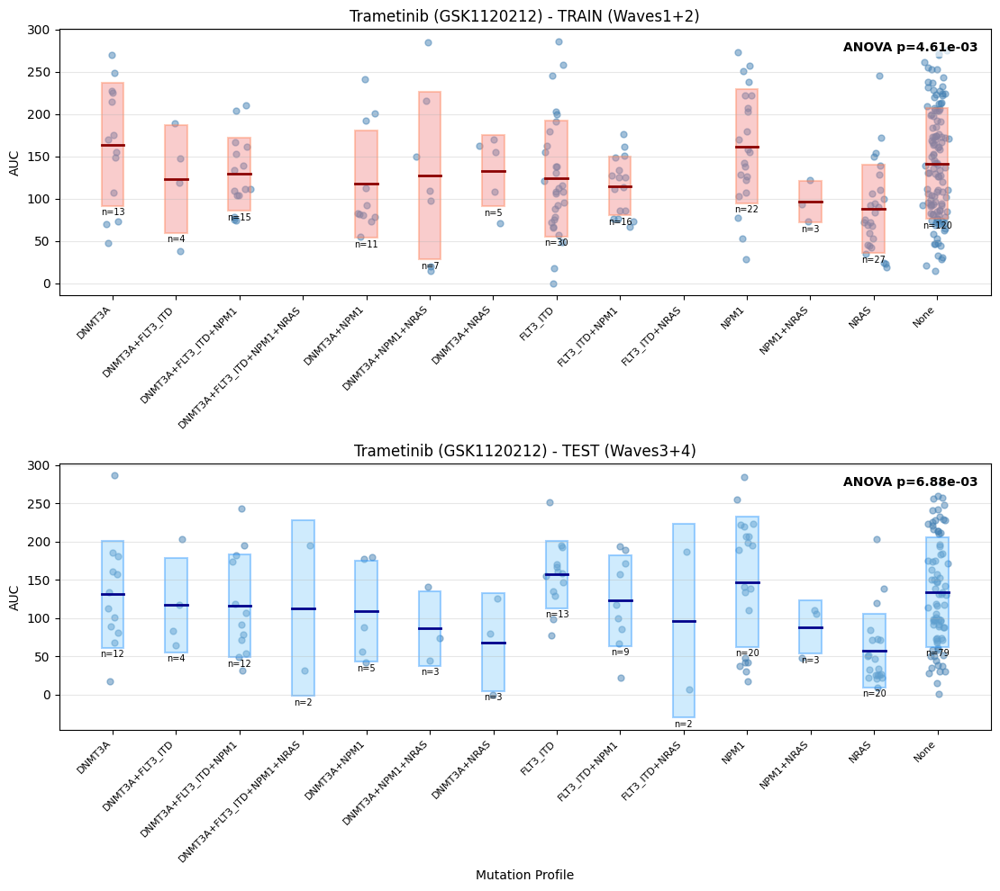

Drug:Venetoclax


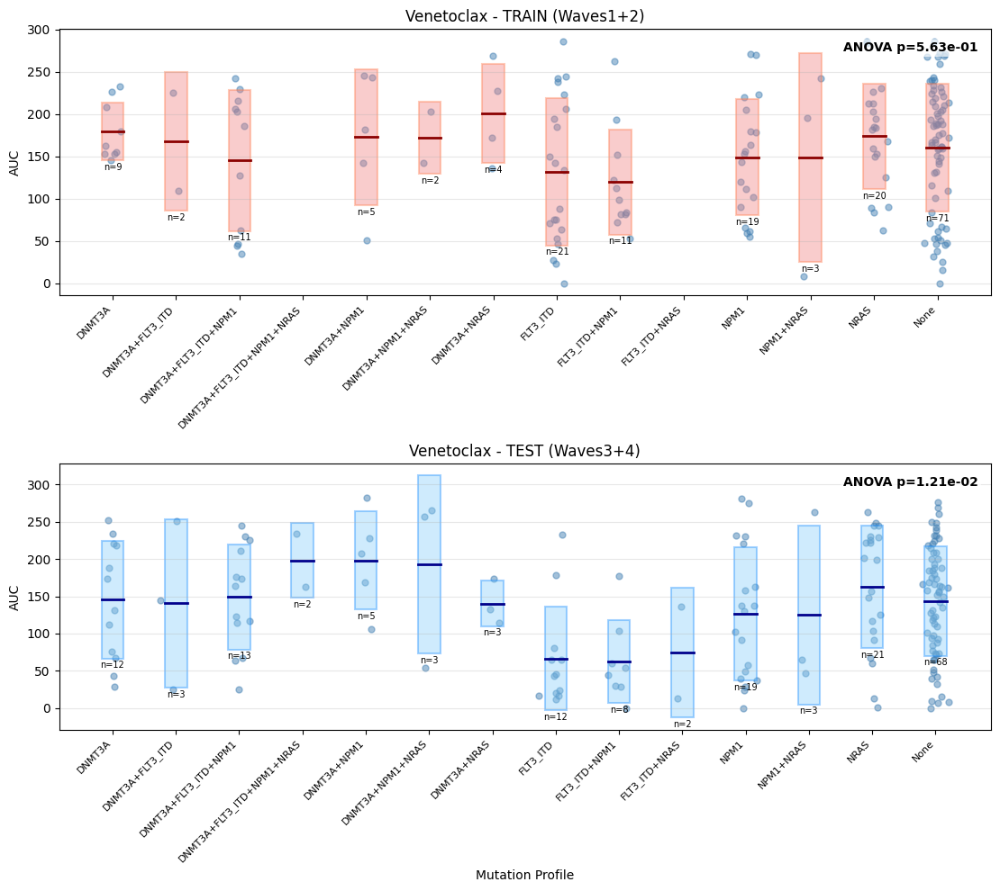

In [500]:
# AUC by mutation profile with mean ± s.d. boxes (Train vs Test)
AUC_by_mutation_profile(df)

In [ ]:
# Create experimental data
for drug in drugs:
    exp_data = create_experimental_data(
        df, 
        cohort='Waves1+2',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A', 'NRAS'],
        inhibitors=[drug],
        output_file=f'../data/BeatAML_AUC_{drug}_NRAS_Waves1+2.csv'
    )
    exp_data = create_experimental_data(
        df, 
        cohort='Waves3+4',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A', 'NRAS'],
        inhibitors=[drug],
        output_file=f'../data/BeatAML_AUC_{drug}_NRAS_Waves3+4.csv'
    )

\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 12 experiments to ../data/BeatAML_AUC_Venetoclax_NRAS_Waves1+2.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             178  160.12±22.46
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 14 experiments to ../data/BeatAML_AUC_Venetoclax_NRAS_Waves3+4.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             174  137.47±44.97
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 12 experiments to ../data/BeatAML_AUC_Entospletinib_NRAS_Waves1+2.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  175.50±26.49
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 14 experiments to ../data/BeatAML_AUC_Entospletinib_NRAS_Waves3+4.csv
\nSummary by dr

In [ ]:
# get phenotype score formula
network = KGBN.load_network(network_file_no_phenotype)
genes = list(network.nodeDict.keys())
genes = genes + ['BTK','NRAS']

KG_AND_string, relations = KGBN.load_signor_network(genes, joiner='&')
KG_AND = KGBN.load_network_from_string(KG_AND_string)
pbn_string = KGBN.merge_networks([network, KG_AND], method="PBN", prob=0.6)
pbn = KGBN.load_pbn_from_string(pbn_string)

formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS']
)
formula

No initial state provided, using a random initial state
Network loaded successfully. There are 18 genes in the network.
number of genes found: 20
[2322, 4869, 207, 596, 595, 1029, 1050, 1788, 5594, 2120, 55294, 2932, 3205, 4211, 4609, 6659, 6776, 7157, 695, 4893]
No initial state provided, using a random initial state
Network loaded successfully. There are 21 genes in the network.
No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']


{'APOPTOSIS': '- AKT1 -  BCL2 + CDKN2A + GSK3B -  MAPK1 -  MEIS1 -  NRAS -  STAT5A + TP53'}

TRAIN: Matched 178 individual samples to predictions
TEST: Matched 174 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_DAB_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


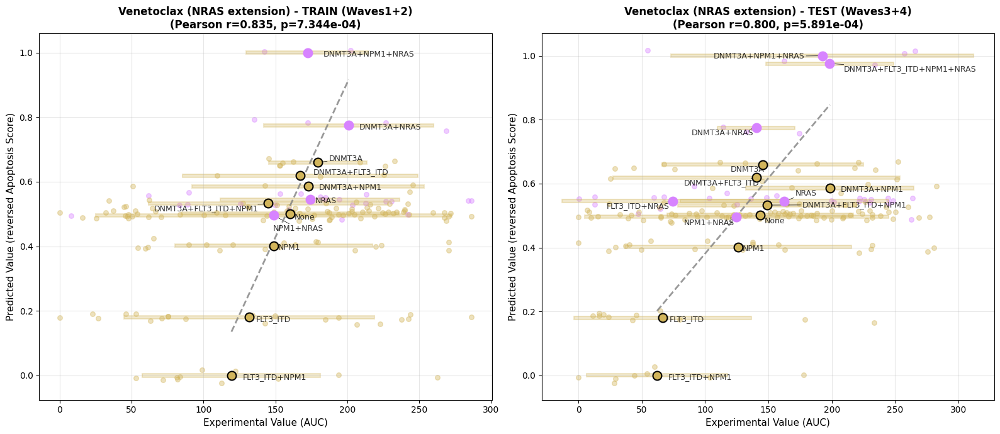

TRAIN: Matched 273 individual samples to predictions
TEST: Matched 187 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Trametinib_NRAS_DAB_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


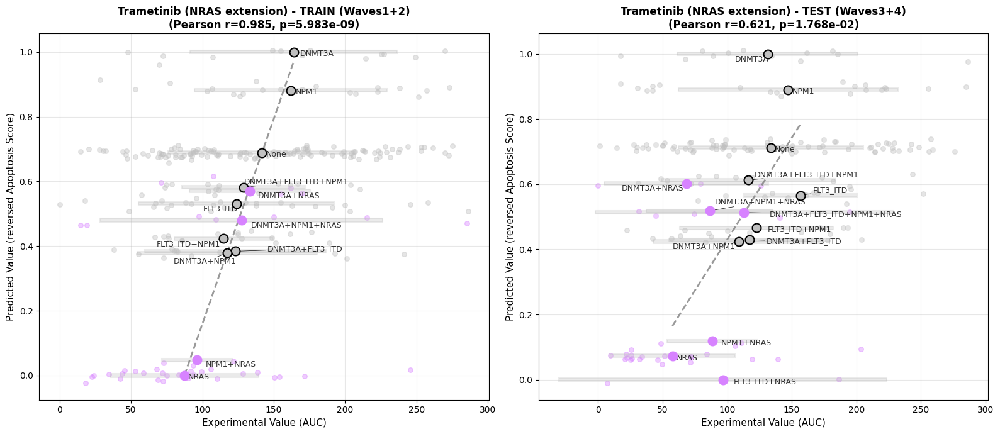

TRAIN: Matched 261 individual samples to predictions
TEST: Matched 164 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Selumetinib_NRAS_DAB_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


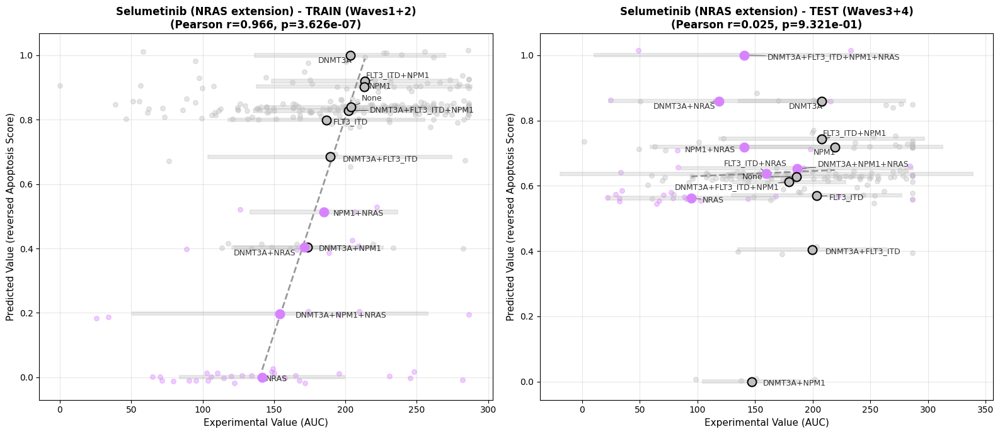

TRAIN: Matched 259 individual samples to predictions
TEST: Matched 181 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Midostaurin_NRAS_DAB_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


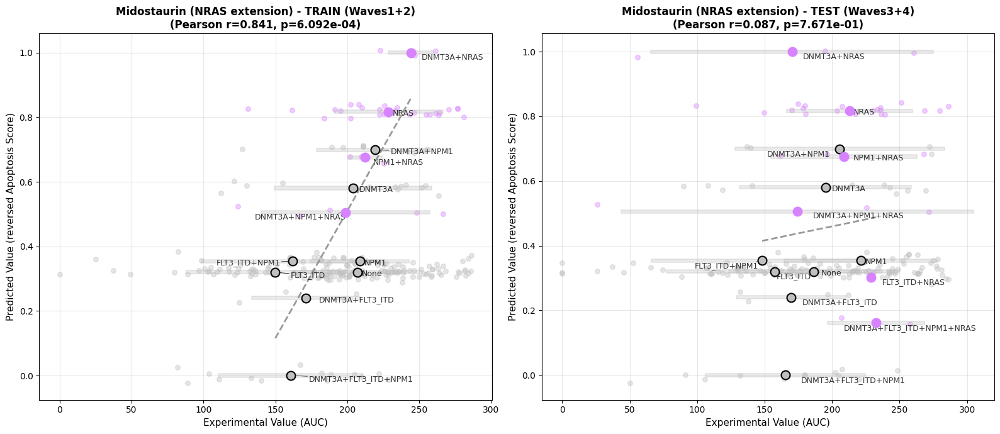

TRAIN: Matched 241 individual samples to predictions
TEST: Matched 173 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_DAB_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


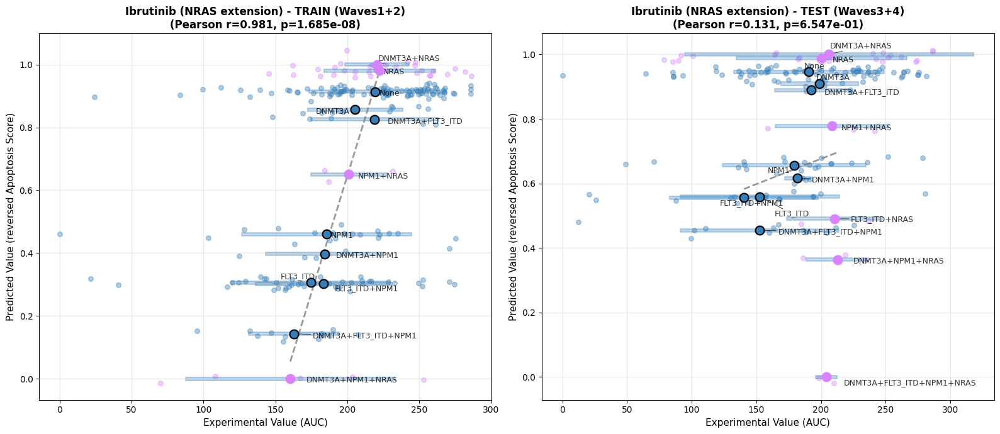

In [508]:
extended_gene = 'NRAS'
drugs = ['Venetoclax','Trametinib','Selumetinib','Midostaurin','Ibrutinib']
for drug in drugs:
    expanded_plot_beataml(
        drug=drug, 
        df=df, 
        drug2target=drug2target, 
        text_size=9,
        extended_gene=extended_gene,
        use_spearman=False,
        save_path=f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_NRAS_DAB_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png'
    )

## TP53

Drug:Entospletinib (GS-9973)


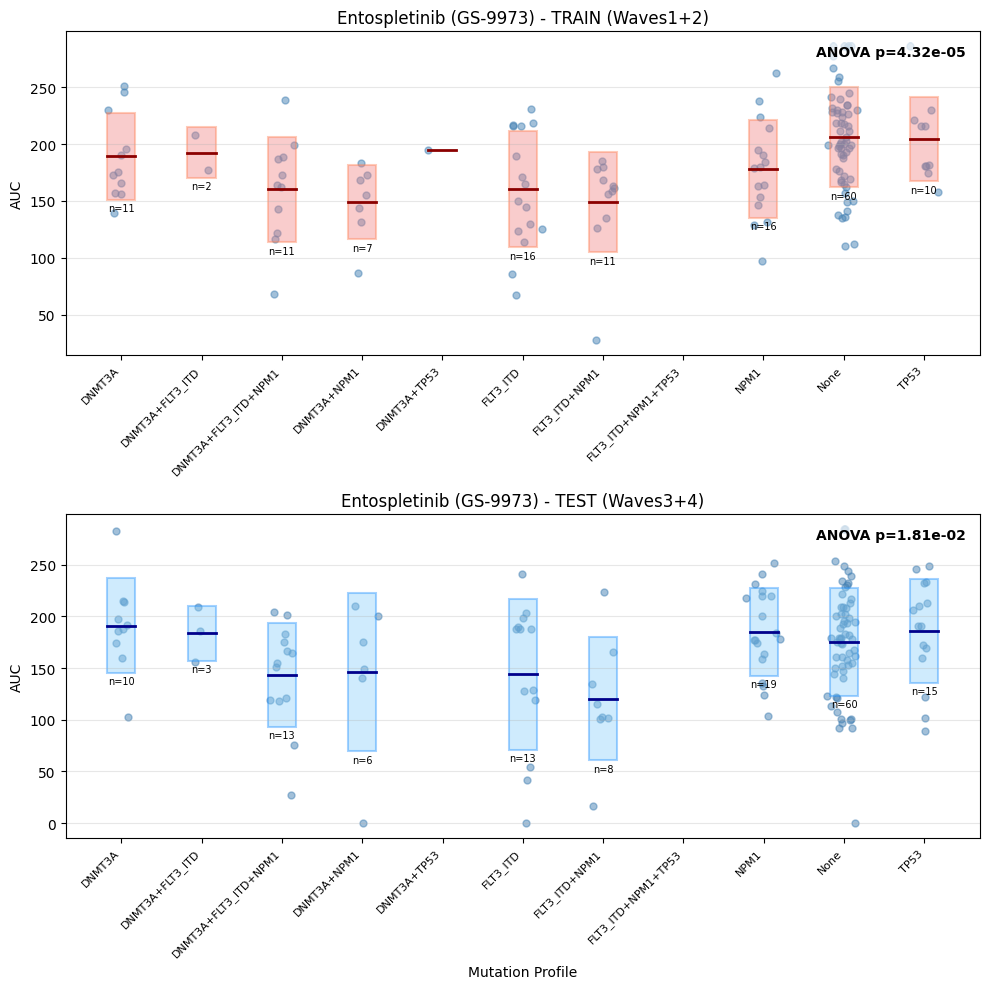

Drug:Ibrutinib (PCI-32765)


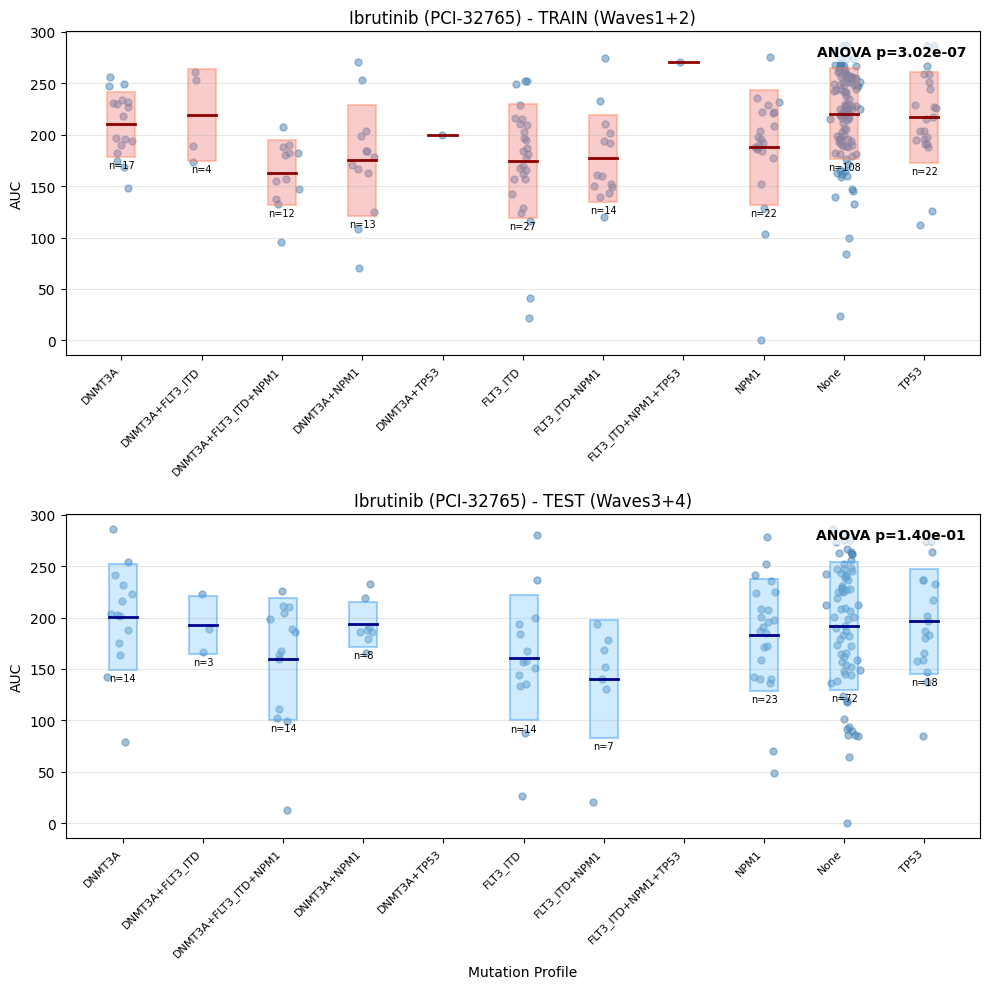

Drug:Midostaurin


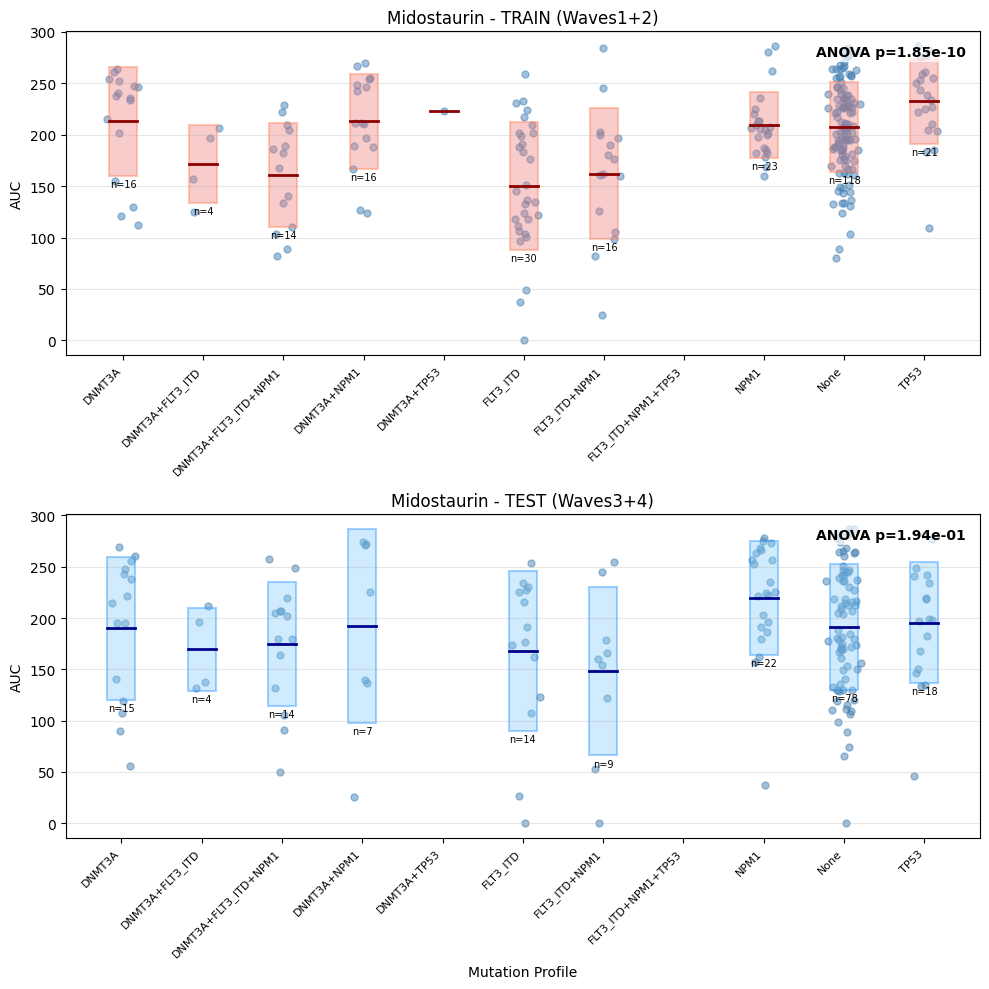

Drug:Selumetinib (AZD6244)


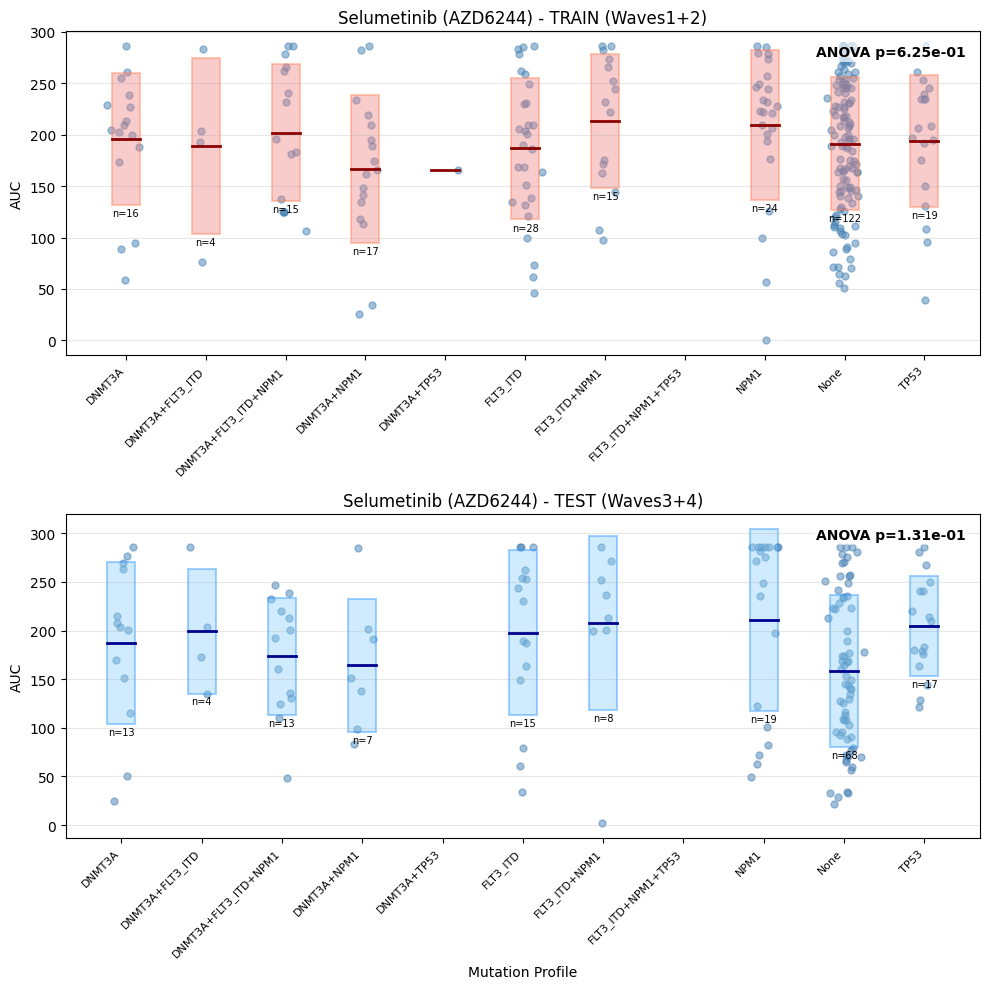

Drug:Trametinib (GSK1120212)


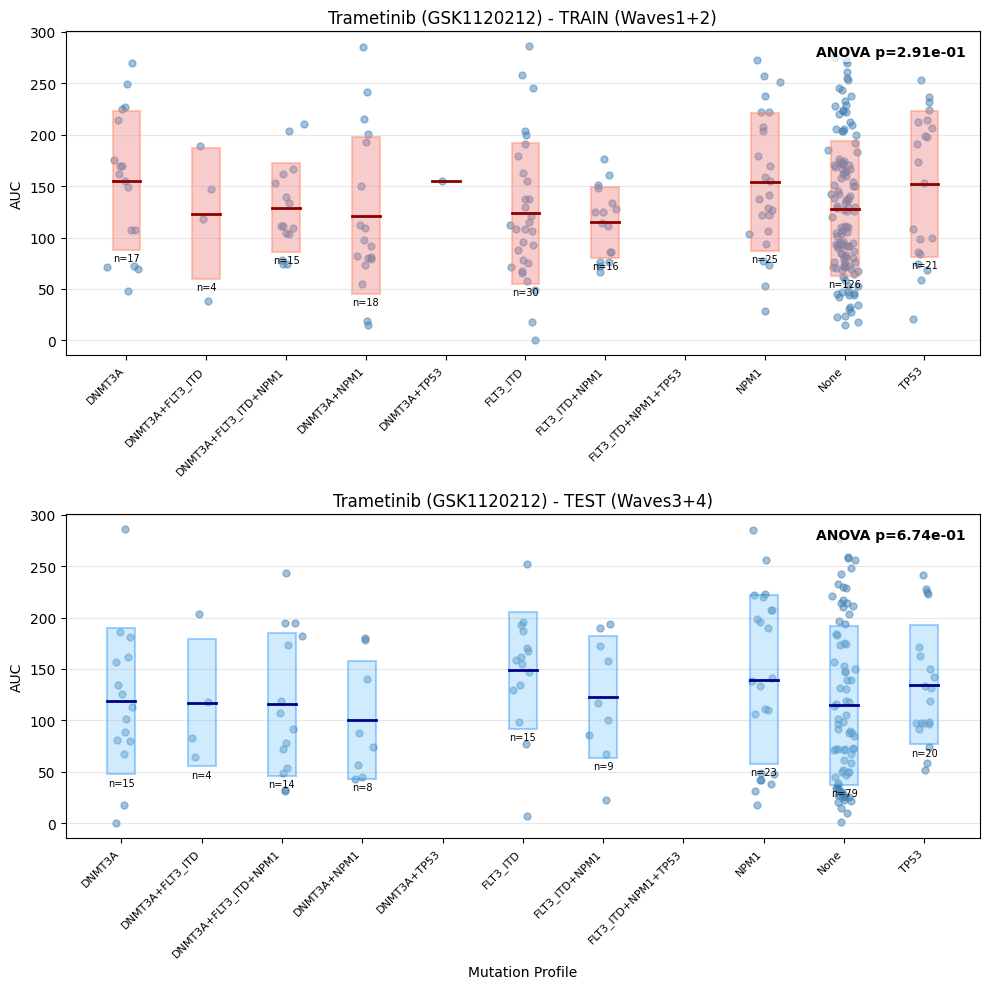

Drug:Venetoclax


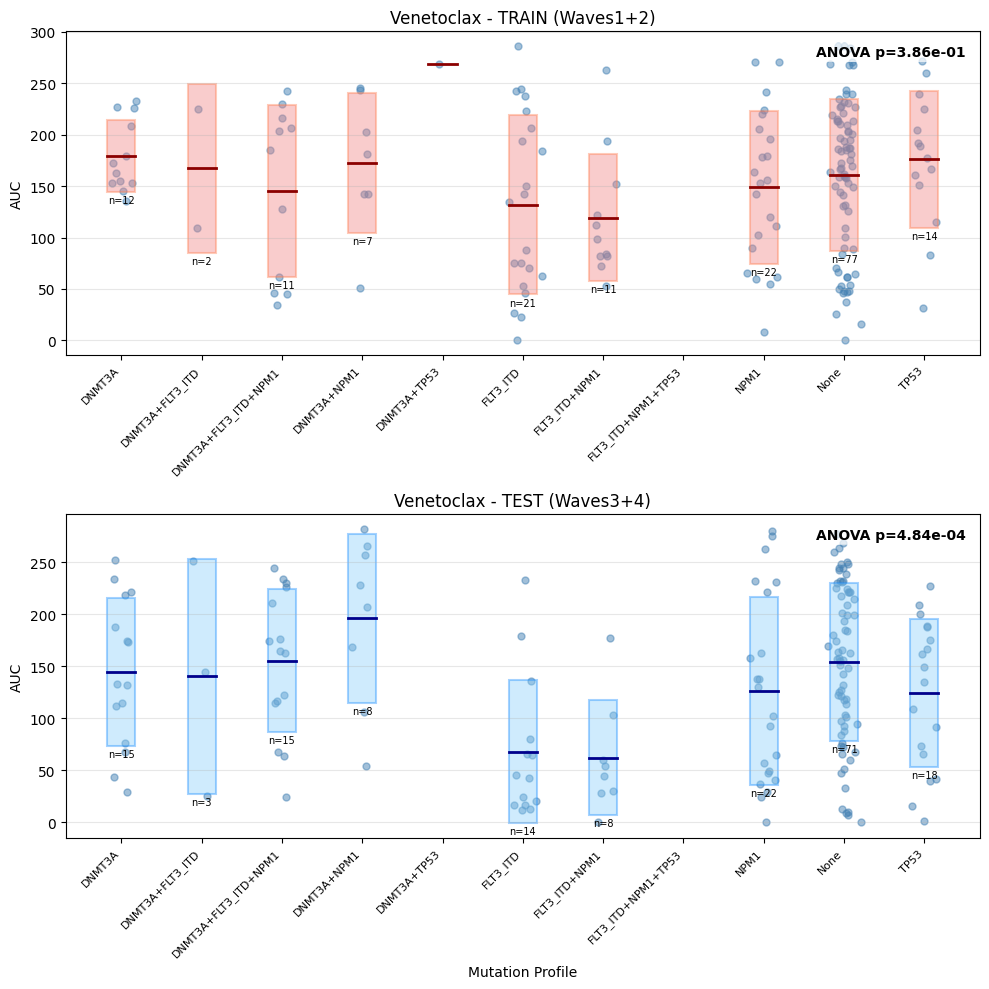

In [463]:
# Create dataset with drug response and mutations
sample_mutations = {}
for ptid in mutation_matrix.index:
    mutated_genes = mutation_matrix.loc[ptid][mutation_matrix.loc[ptid] == 1].index.tolist()
    # Filter to only model genes
    # mutated_genes_in_model = [g for g in mutated_genes if g in pbn.nodeDict.keys()]
    mutated_genes_in_model = [g for g in mutated_genes if g in ['FLT3_ITD', 'NPM1', 'DNMT3A', 'TP53']]
    sample_mutations[ptid] = set(mutated_genes_in_model)

# Create mutation profile mapping
mutation_profiles = []
for _, row in sample_to_ptid.iterrows():
    ptid = row['ptid']
    if ptid in sample_mutations:
        mutation_profiles.append({
            'dbgap_sample_id': row['dbgap_sample_id'],
            'ptid': ptid,
            'mutation_profile': sample_mutations[ptid]
        })

mutation_profile_df = pd.DataFrame(mutation_profiles)

# Merge with drug response data
drug_response_merged = pd.merge(
    mutation_profile_df,
    drug_response,
    left_on='dbgap_sample_id',
    right_on='dbgap_dnaseq_sample',
    how='inner'
)

# Filter for selected drugs of interest
df = drug_response_merged[drug_response_merged['inhibitor'].apply(lambda x: any(drug in x for drug in drugs))].copy()

# Merge cohort information
df = pd.merge(df, sample_to_ptid[['dbgap_sample_id', 'cohort']], on='dbgap_sample_id', how='left')

# AUC by mutation profile with mean ± s.d. boxes (Train vs Test)
AUC_by_mutation_profile(df)

In [10]:
for drug in drugs:
    exp_data = create_experimental_data(
        df, 
        cohort='Waves1+2',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A', 'TP53'],
        inhibitors=[drug],
        output_file=f'../data/BeatAML_AUC_{drug}_TP53_Waves1+2.csv'
    )
    exp_data = create_experimental_data(
        df, 
        cohort='Waves3+4',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A', 'TP53'],
        inhibitors=[drug],
        output_file=f'../data/BeatAML_AUC_{drug}_TP53_Waves3+4.csv'
    )

\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 10 experiments to ../data/BeatAML_AUC_Entospletinib_TP53_Waves1+2.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  178.33±22.19
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 9 experiments to ../data/BeatAML_AUC_Entospletinib_TP53_Waves3+4.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             147  163.76±25.55
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 11 experiments to ../data/BeatAML_AUC_Ibrutinib_TP53_Waves1+2.csv
\nSummary by drug:
           Total patients   Mean AUC±SD
drug                                   
Ibrutinib             241  201.39±30.87
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 9 experiments to ../data/BeatAML_AUC_Ibrutinib_TP53_Waves3+4.csv
\nSummary by 

TRAIN: Matched 178 individual samples to predictions
TEST: Matched 174 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_TP53_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


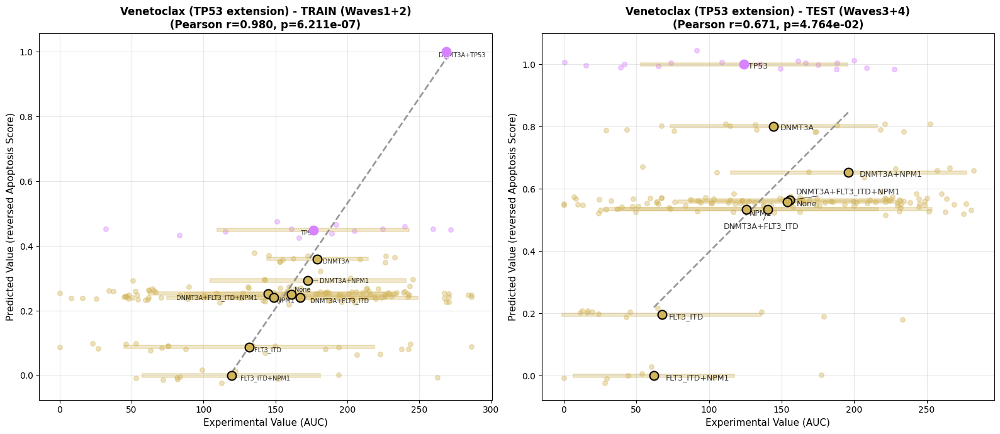

TRAIN: Matched 145 individual samples to predictions
TEST: Matched 147 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_TP53_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


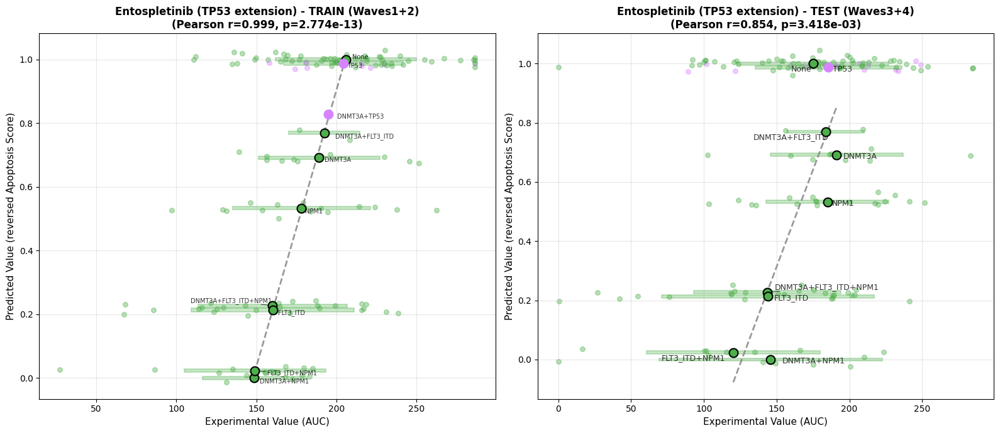

TRAIN: Matched 241 individual samples to predictions
TEST: Matched 173 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_TP53_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


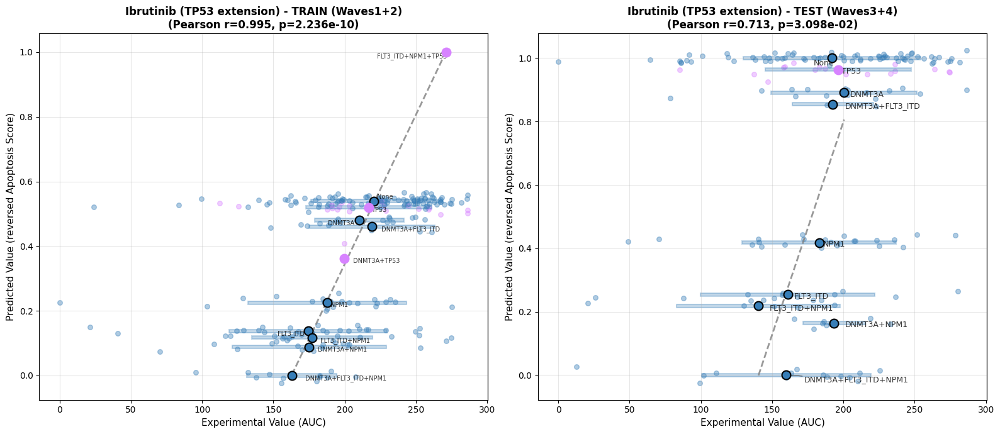

TRAIN: Matched 273 individual samples to predictions
TEST: Matched 187 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Trametinib_TP53_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


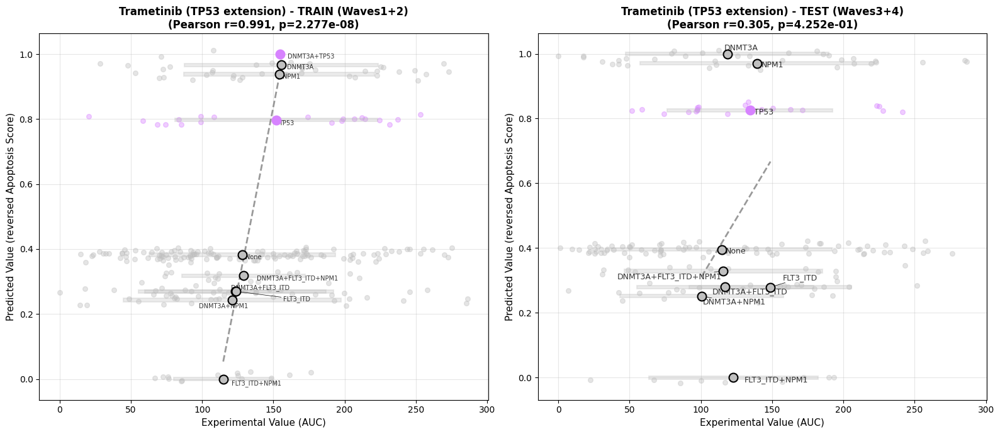

TRAIN: Matched 261 individual samples to predictions
TEST: Matched 164 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Selumetinib_TP53_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


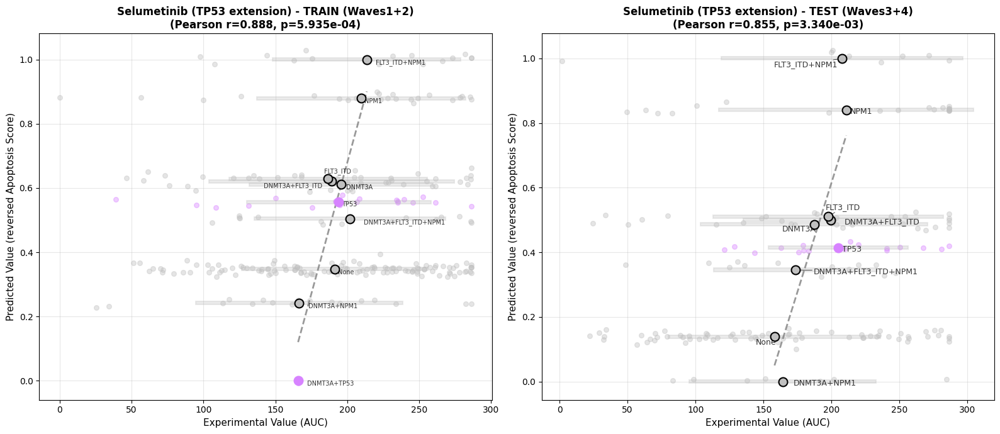

TRAIN: Matched 259 individual samples to predictions
TEST: Matched 181 individual samples to predictions
Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Midostaurin_TP53_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png


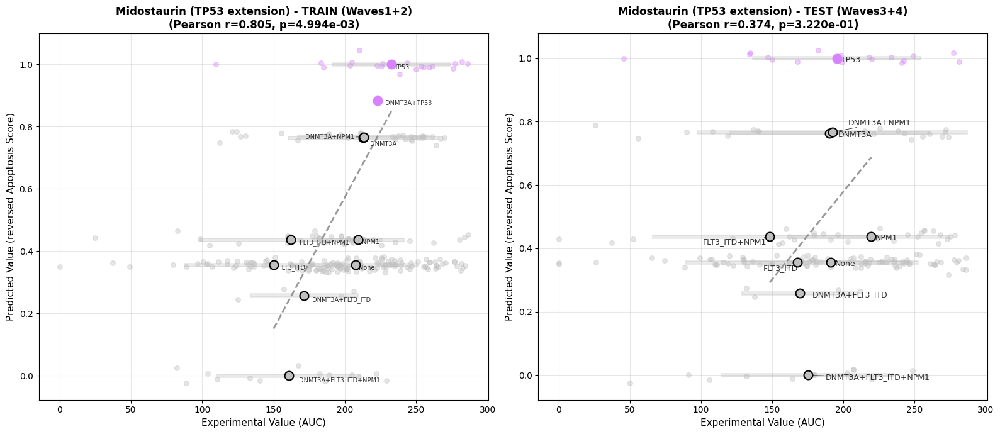

In [464]:
extended_gene = 'TP53'
for drug in drugs:
    expanded_plot_beataml(
        drug=drug, 
        df=df, 
        drug2target=drug2target, 
        text_size=9,
        extended_gene=extended_gene,
        use_spearman=False,
        save_path=f'/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_{drug}_{extended_gene}_Waves1+2_AND+OR+IW/prediction_vs_experimental_individual.png'
    )

## RUNX1

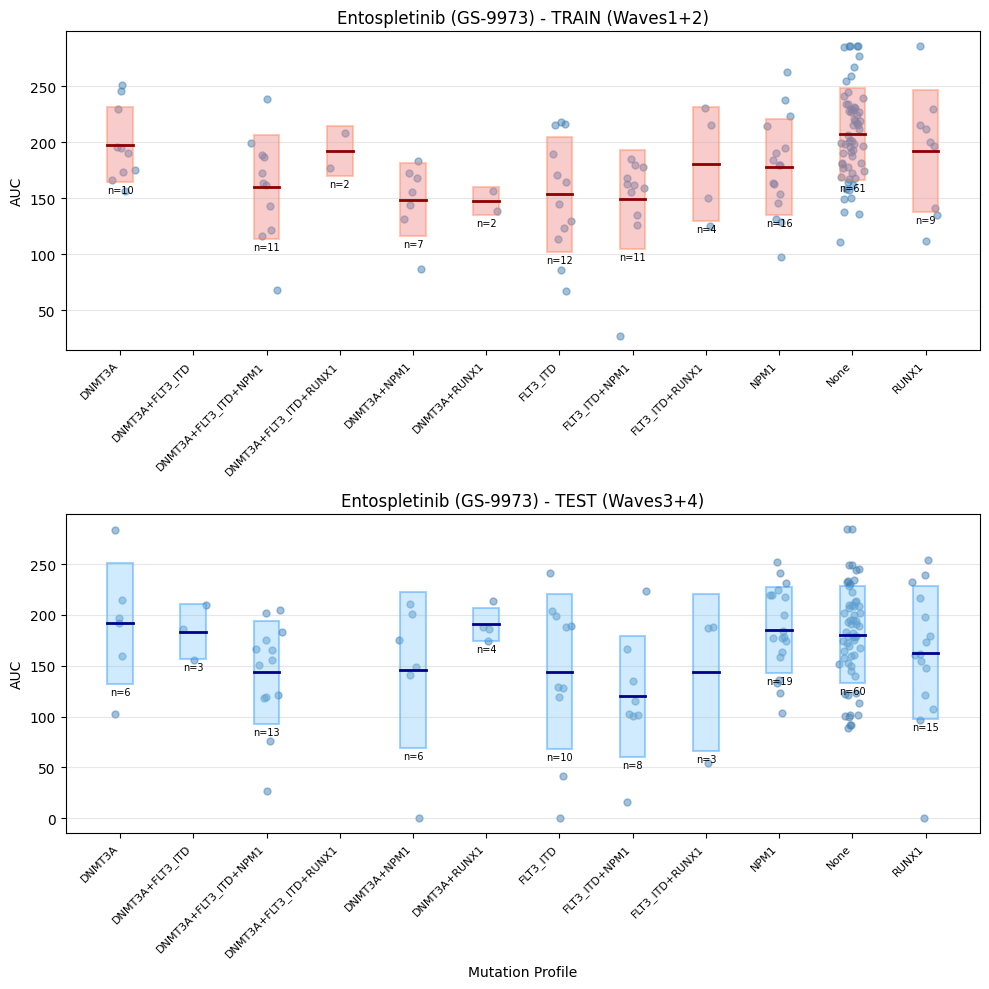

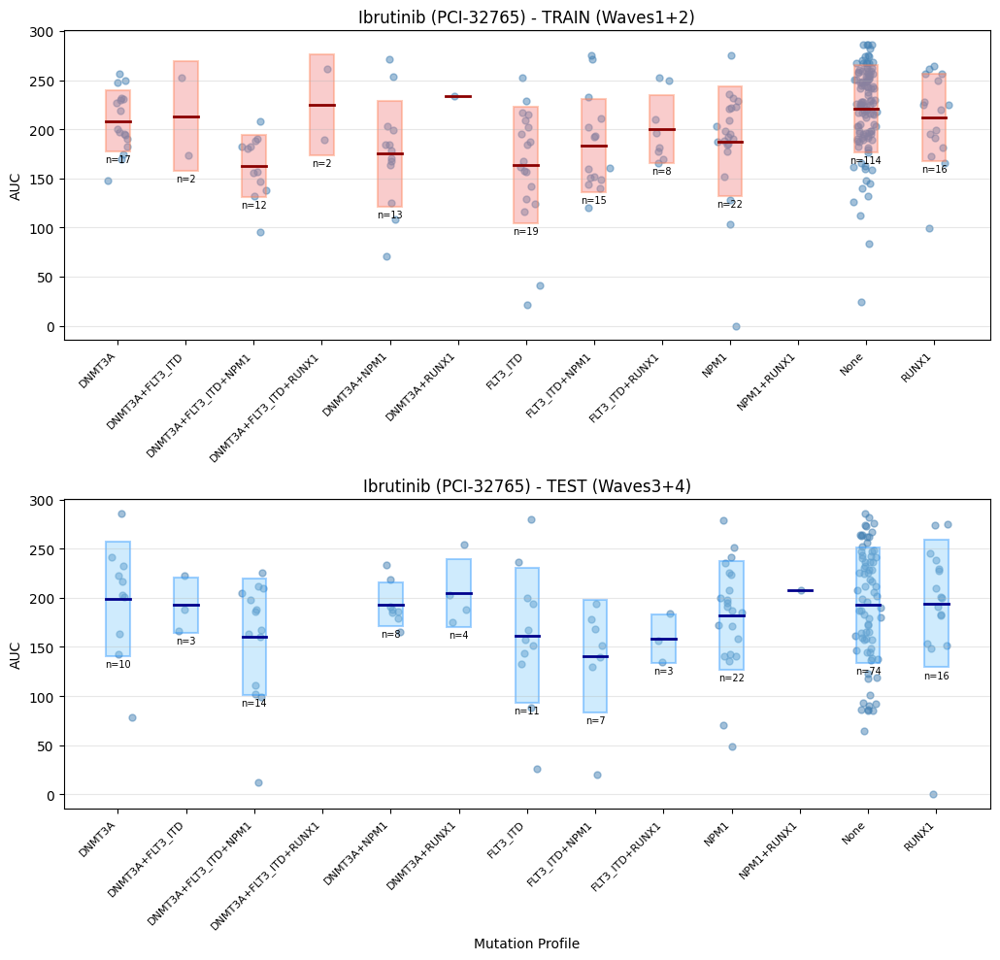

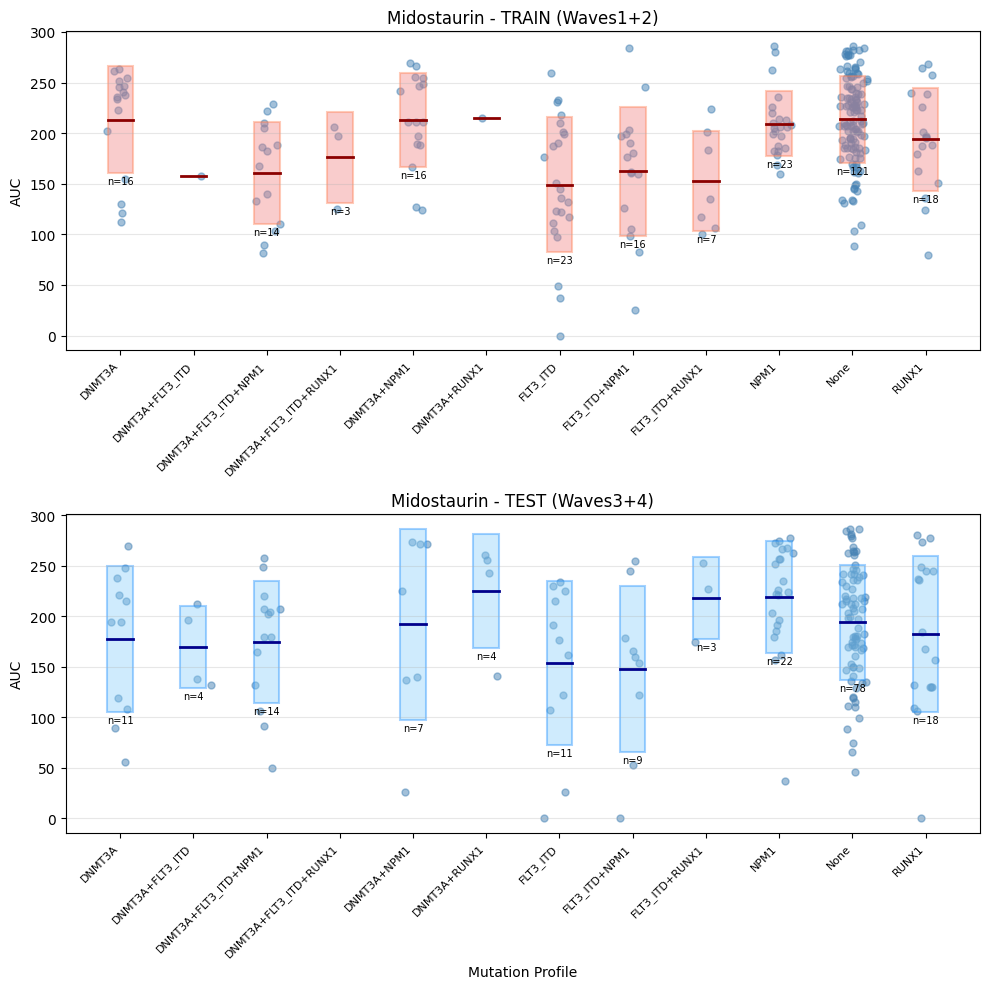

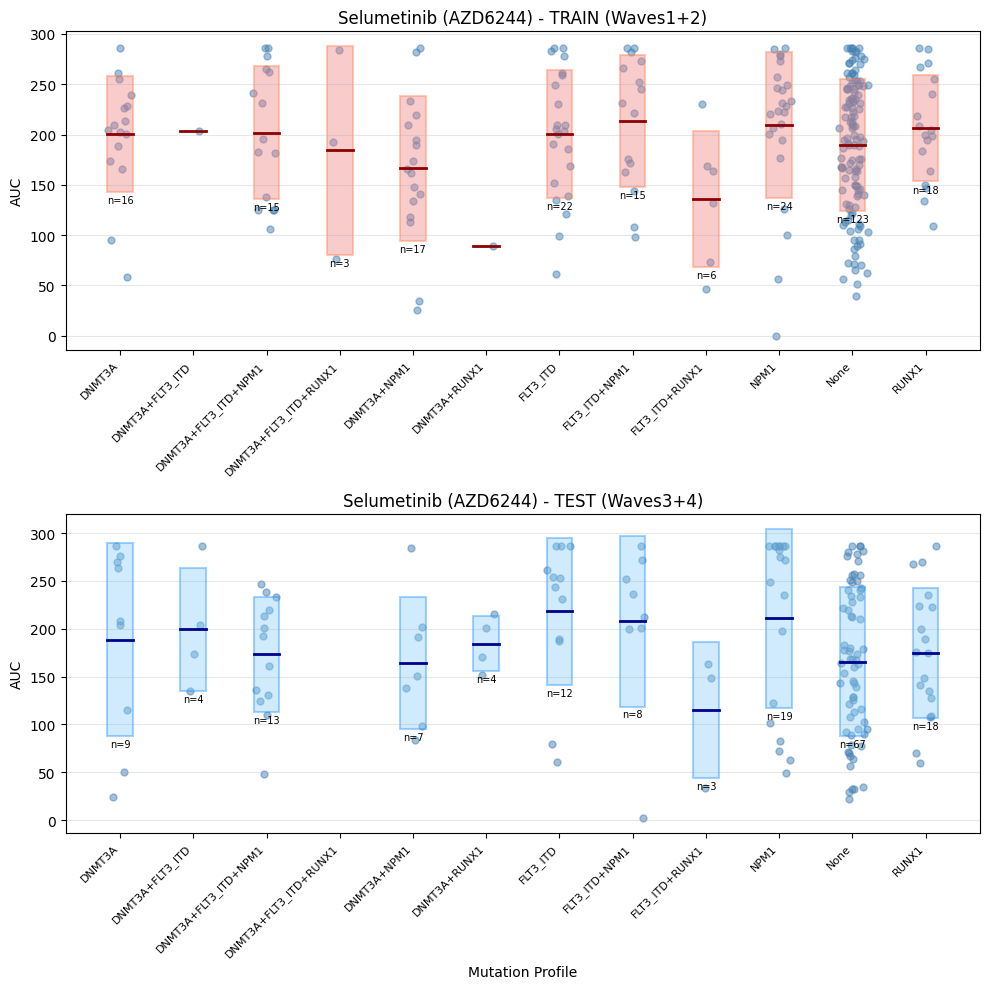

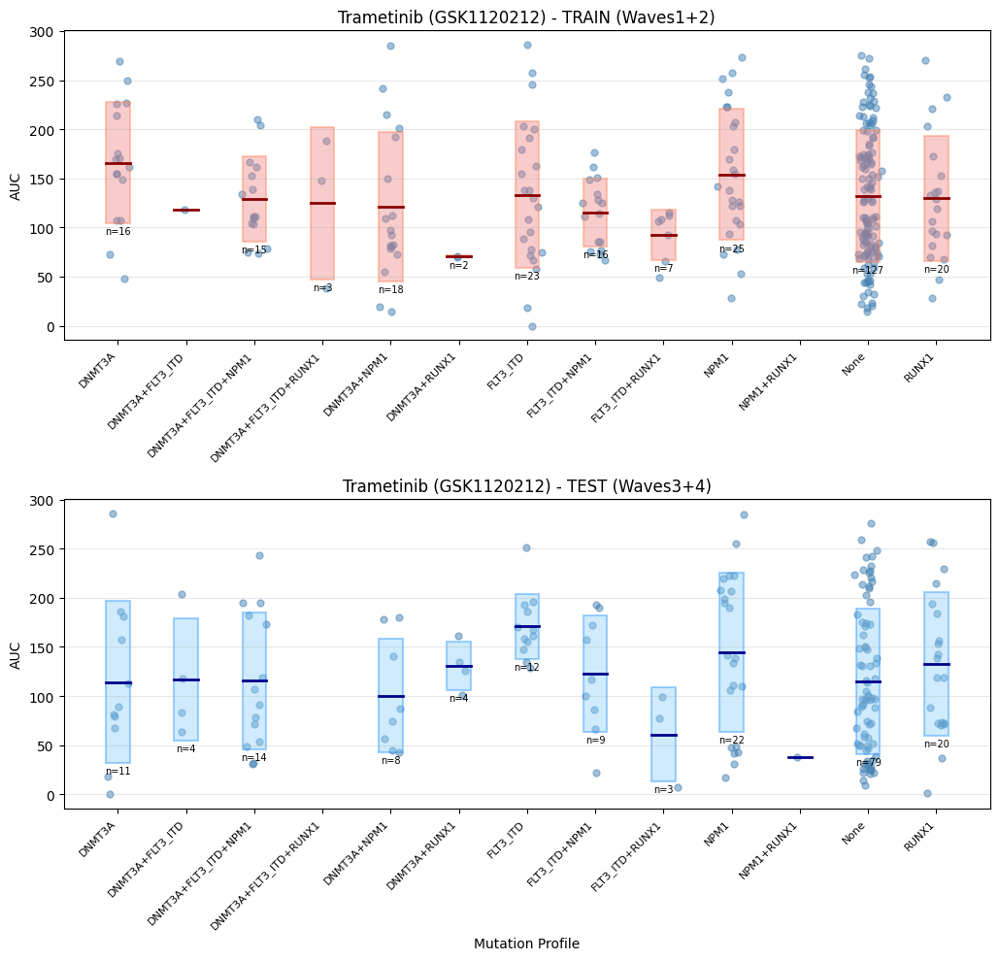

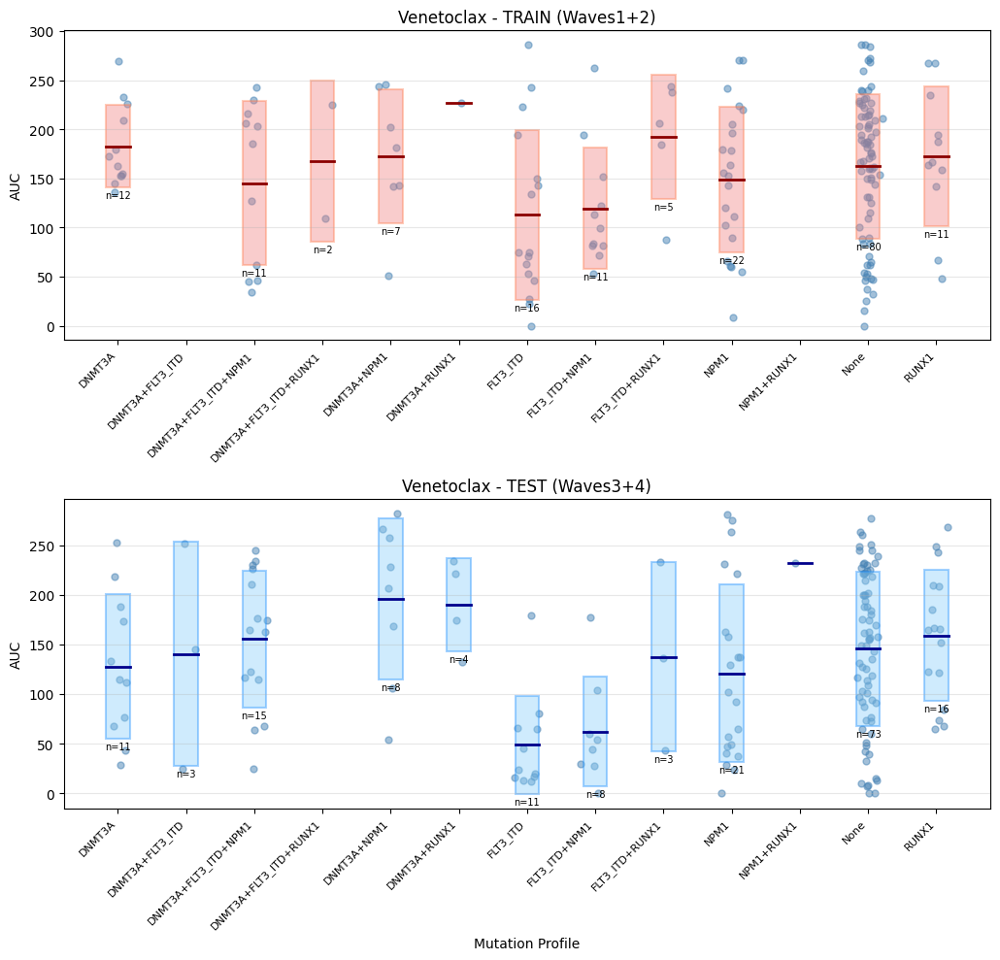

In [367]:
# Create dataset with drug response and mutations
sample_mutations = {}
for ptid in mutation_matrix.index:
    mutated_genes = mutation_matrix.loc[ptid][mutation_matrix.loc[ptid] == 1].index.tolist()
    # Filter to only model genes
    # mutated_genes_in_model = [g for g in mutated_genes if g in pbn.nodeDict.keys()]
    mutated_genes_in_model = [g for g in mutated_genes if g in ['FLT3_ITD', 'NPM1', 'DNMT3A', 'RUNX1']]
    sample_mutations[ptid] = set(mutated_genes_in_model)

# Create mutation profile mapping
mutation_profiles = []
for _, row in sample_to_ptid.iterrows():
    ptid = row['ptid']
    if ptid in sample_mutations:
        mutation_profiles.append({
            'dbgap_sample_id': row['dbgap_sample_id'],
            'ptid': ptid,
            'mutation_profile': sample_mutations[ptid]
        })

mutation_profile_df = pd.DataFrame(mutation_profiles)

# Merge with drug response data
drug_response_merged = pd.merge(
    mutation_profile_df,
    drug_response,
    left_on='dbgap_sample_id',
    right_on='dbgap_dnaseq_sample',
    how='inner'
)

# Filter for selected drugs of interest
df = drug_response_merged[drug_response_merged['inhibitor'].apply(lambda x: any(drug in x for drug in drugs))].copy()

# Merge cohort information
df = pd.merge(df, sample_to_ptid[['dbgap_sample_id', 'cohort']], on='dbgap_sample_id', how='left')

# AUC by mutation profile with mean ± s.d. boxes (Train vs Test)
AUC_by_mutation_profile(df)

In [368]:
classification = pd.read_csv("../input_files/Palma_class_extended.csv")
gene_to_class = dict(zip(classification['symbol'], classification['class']))

for drug in drugs:
    exp_data = create_experimental_data(
        df, 
        cohort='Waves1+2',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A', 'RUNX1'],
        inhibitors=[drug],
        gene_to_class=gene_to_class,
        output_file=f'../data/BeatAML_AUC_{drug}_RUNX1_Waves1+2.csv'
    )
    exp_data = create_experimental_data(
        df, 
        cohort='Waves3+4',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A', 'RUNX1'],
        inhibitors=[drug],
        gene_to_class=gene_to_class,
        output_file=f'../data/BeatAML_AUC_{drug}_RUNX1_Waves3+4.csv'
    )

\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 11 experiments to ../data/BeatAML_AUC_Venetoclax_RUNX1_Waves1+2.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             178  163.90±32.35
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 12 experiments to ../data/BeatAML_AUC_Venetoclax_RUNX1_Waves3+4.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             174  142.98±51.84
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 11 experiments to ../data/BeatAML_AUC_Entospletinib_RUNX1_Waves1+2.csv
\nSummary by drug:
               Total patients   Mean AUC±SD
drug                                       
Entospletinib             145  173.47±22.37
\nGenerating data for 16 profiles × 1 drugs = 16 experiments
\nSaved 11 experiments to ../data/BeatAML_AUC_Entospletinib_RUNX1_Waves3+4.csv
\nSummary b

# Other drugs

In [30]:
# map inhibitors to their target genes
drug_target_df = pd.read_excel("https://github.com/biodev/beataml2.0_data/raw/main/beataml_drug_families.xlsx", sheet_name='drug_gene', usecols=['inhibitor', 'Symbol'])
drugs = [
"Trametinib",
"Gilteritinib",
"Selumetinib",
"Midostaurin",
"Ivosidenib",
"Enasidenib"
]
drug_target_df = drug_target_df[drug_target_df['inhibitor'].apply(lambda x: any(drug in x for drug in drugs))].copy()
drug_target_df

,inhibitor,Symbol
80,Midostaurin,TBK1
93,Midostaurin,JAK3
101,Midostaurin,MAP3K9
102,Midostaurin,MAP3K11
197,Midostaurin,EGFR
202,Selumetinib (AZD6244),EGFR
245,Midostaurin,FLT3
264,Midostaurin,KIT
394,Midostaurin,RET
453,Midostaurin,PKN1


In [36]:
drug2target = {
    'Venetoclax': ['BCL2'], 
    'Ibrutinib': ['BTK'], 
    'Entospletinib': ['SYK'],
    'Trametinib': ['MAP2K1','MAP2K2'],
    'Selumetinib': ['MAP2K1','MAP2K2'],
    'Midostaurin': ['FLT3','KIT']
    }

for drug in drug2target.keys():
    print(drug)
    exp_data = create_experimental_data(
        df, 
        cohort='Waves1+2',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
        inhibitors=[drug],
        drug2target=drug2target,
        output_file=f'../data/BeatAML_AUC_{drug}_Waves1+2.csv'
    )
    exp_data = create_experimental_data(
        df, 
        cohort='Waves3+4',
        mutation_genes=['FLT3_ITD', 'NPM1', 'DNMT3A'],
        inhibitors=[drug],
        drug2target=drug2target,
        output_file=f'../data/BeatAML_AUC_{drug}_Waves3+4.csv'
    )

Venetoclax
\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 7 experiments to ../data/BeatAML_AUC_Venetoclax_Waves1+2.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             159  149.12±26.03
\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Venetoclax_Waves3+4.csv
\nSummary by drug:
            Total patients   Mean AUC±SD
drug                                    
Venetoclax             150  124.66±48.50
Ibrutinib
\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Ibrutinib_Waves1+2.csv
\nSummary by drug:
           Total patients   Mean AUC±SD
drug                                   
Ibrutinib             214  189.44±22.47
\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/BeatAML_AUC_Ibrutinib_Waves3+4.csv
\nSummary by drug:
           Total patients  

# FPMTB data
https://zenodo.org/records/7370747

In [233]:
df_mutation = pd.read_excel('/Users/luna/Desktop/Pancreatic cancer/Data/AML_FPMTB/Functional_Precision_Medicine_Tumor_Board_AML/File_6_Binary_mutation_225S_57G.xlsx',index_col=0)
df_dss = pd.read_excel('/Users/luna/Desktop/Pancreatic cancer/Data/AML_FPMTB/Functional_Precision_Medicine_Tumor_Board_AML/File_3.1_Drug_response_sDSS_164S_17Healthy.xlsx',index_col=0)
df_dss.set_index('Drug_name',inplace=True)

In [234]:
gene_of_interest = ['FLT3','NPM1','DNMT3A']

# Filter mutations to genes of interest
genes_to_use = df_mutation.index.intersection(gene_of_interest)
df_mut_filt = df_mutation.loc[genes_to_use]

# Build mutation_profile per sample (set of mutated genes)
mutation_profile = df_mut_filt.apply(
    lambda col: {gene for gene, val in col.items() if val == 1},
    axis=0
)

# Filter DSS to selected drugs
drugs_to_use = df_dss.index.intersection(drugs)
df_dss_filt = df_dss.loc[drugs_to_use]

# Long-format DSS: one row per (sample, drug)
df_long = (
    df_dss_filt
    .reset_index()    
    .rename(columns={'index': 'drug'})
    .melt(id_vars='Drug_name',
          var_name='sample_id',
          value_name='DSS')
)

# drop missing DSS values
df_long = df_long.dropna(subset=['DSS'])

# Add mutation_profile column
df_long['mutation_profile'] = df_long['sample_id'].map(mutation_profile)
df_long = df_long.dropna(subset=['mutation_profile'])
df_long

,Drug_name,sample_id,DSS,mutation_profile
0,Selumetinib,AML_084_04,15.46,{}
1,Trametinib,AML_084_04,16.54,{}
2,Midostaurin,AML_084_04,-0.96,{}
3,Ibrutinib,AML_084_04,0.00,{}
4,Venetoclax,AML_084_04,-2.14,{}
...,...,...,...,...
979,Trametinib,AML_183_02,10.03,{}
980,Midostaurin,AML_183_02,9.23,{}
981,Ibrutinib,AML_183_02,0.00,{}
982,Venetoclax,AML_183_02,1.10,{}


In [89]:
df_long['mutation_profile'].value_counts()

mutation_profile
{}                      513
{DNMT3A}                 64
{NPM1}                   49
{DNMT3A, NPM1}           33
{FLT3}                   30
{FLT3, DNMT3A}           21
{FLT3, NPM1}             18
{FLT3, DNMT3A, NPM1}     15
Name: count, dtype: int64

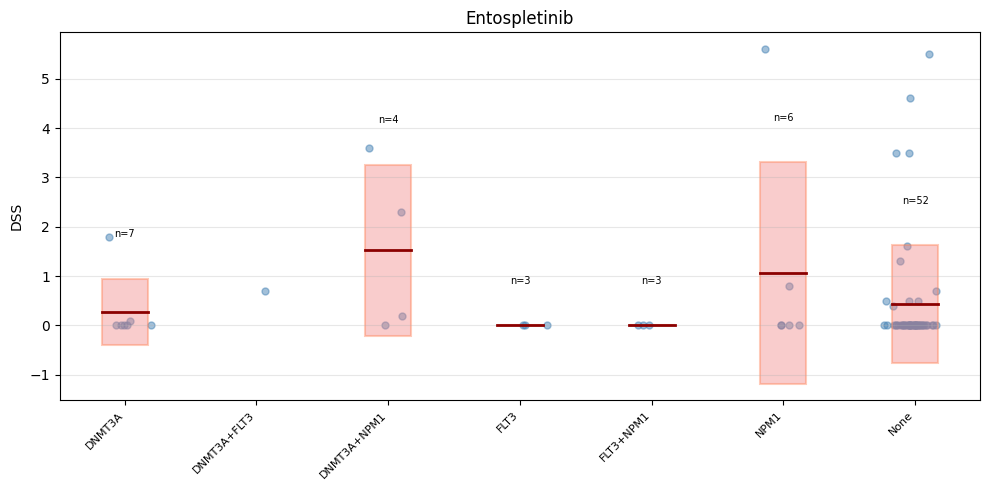

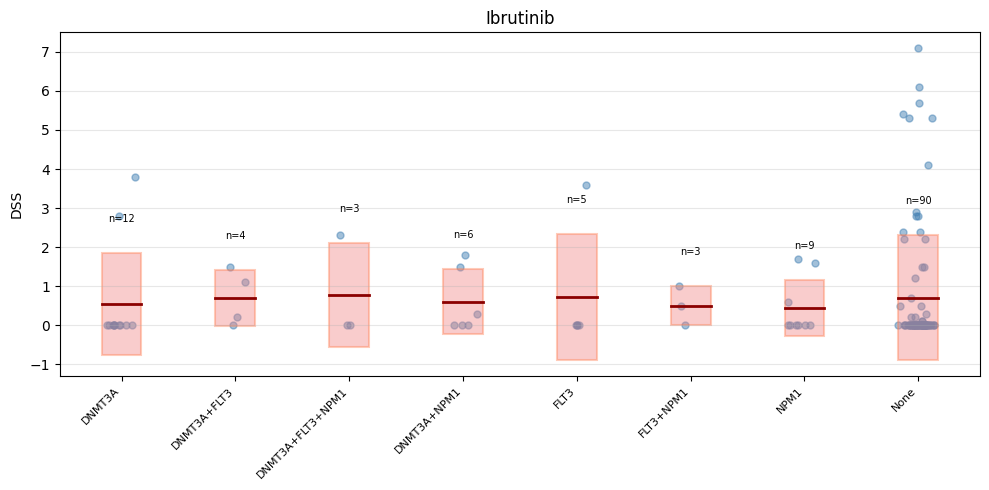

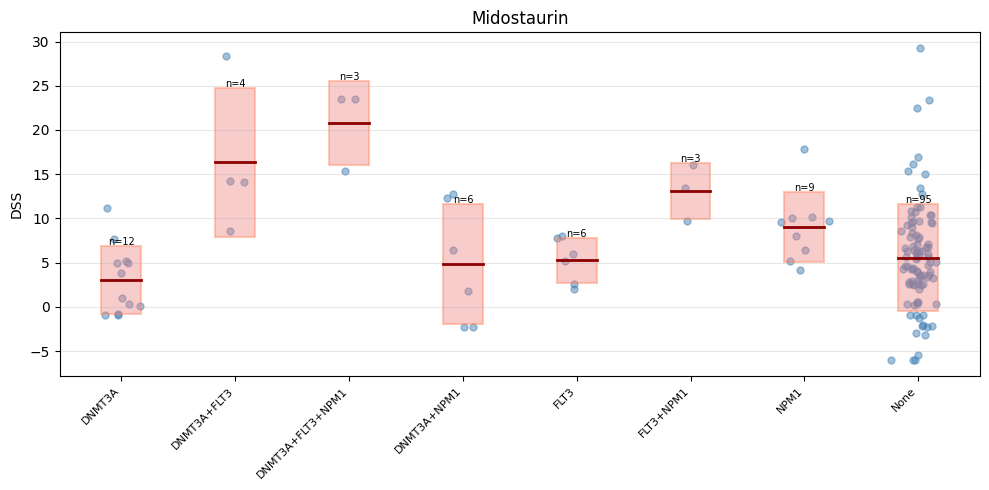

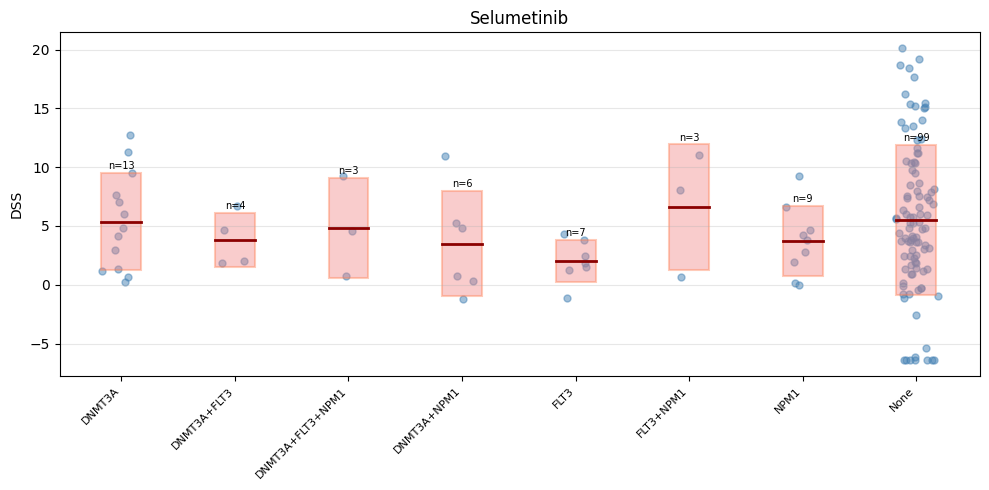

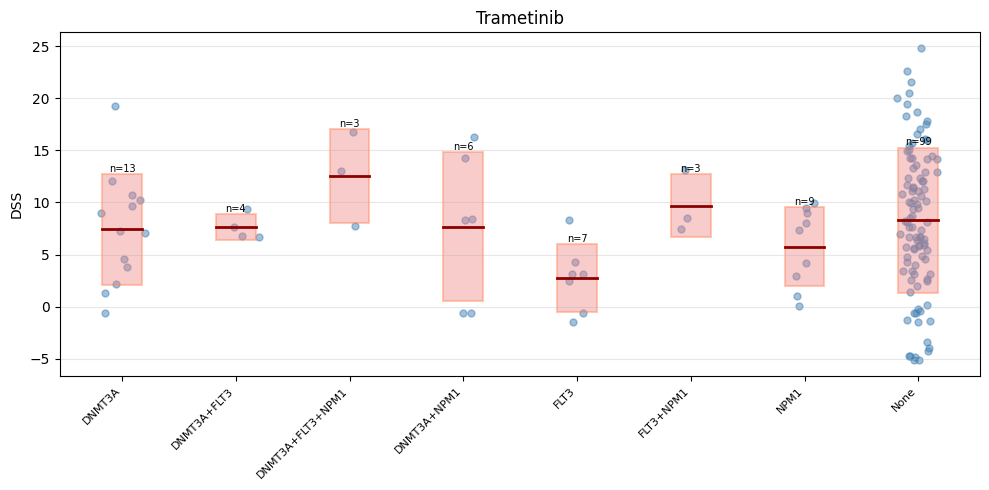

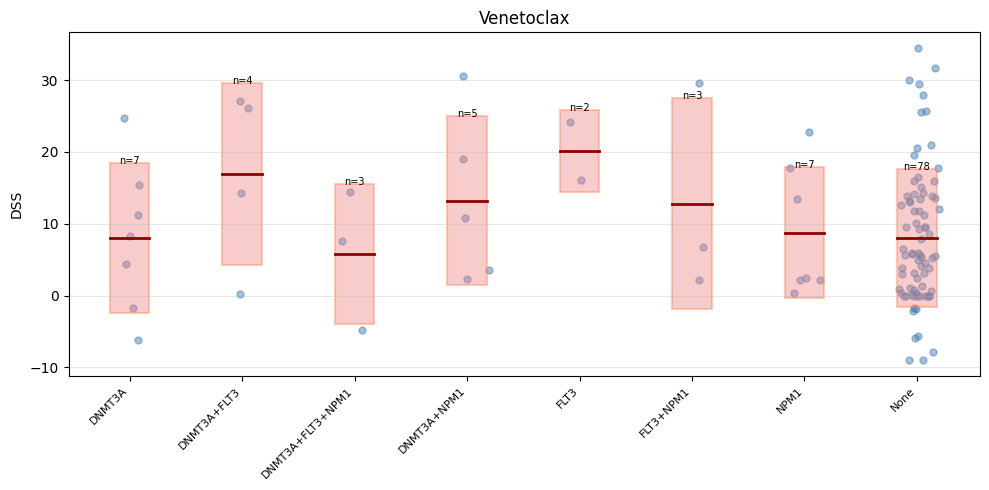

In [99]:
# DSS by mutation profile with mean ± s.d. boxes
def normalize_profile_text(p):
    if isinstance(p, (set, frozenset, list, tuple)):
        genes = sorted(map(str, p))
    else:
        s = re.sub(r'[\{\}]', '', str(p))
        genes = sorted([g.strip() for g in s.split(',') if g.strip()])
    return "+".join(genes) if genes else "None"

df_plot = df_long.copy()
df_plot["profile_label"] = df_plot["mutation_profile"].apply(normalize_profile_text)

# Create plots for each drug
for drug in sorted(df_plot["Drug_name"].unique()):
    sub = df_plot[df_plot["Drug_name"] == drug].copy()

    # Get profile statistics
    stats = sub.groupby("profile_label")['DSS'].agg(['mean', 'std', 'count']).reset_index()
    
    # Get union of profiles
    all_profiles = sorted(set(stats['profile_label'].tolist()))
    
    if len(all_profiles) == 0:
        continue
    
    # create figure
    fig, ax1 = plt.subplots(figsize=(max(10, len(all_profiles) * 0.8), 5))
    positions = range(len(all_profiles))

    # Create a stats lookup dict for each profile
    stats_by_profile = {row['profile_label']: row for _, row in stats.iterrows()}
    
    for i, profile in enumerate(all_profiles):
        profile_data = sub[sub['profile_label'] == profile]
        if len(profile_data) > 0:
            x_jitter = np.random.normal(i, 0.08, len(profile_data))
            ax1.scatter(x_jitter, profile_data['DSS'], alpha=0.5, s=25, color='steelblue')

        # Plot mean ± sd box for every profile
        row = stats_by_profile.get(profile)
        if row is not None and not pd.isnull(row['mean']) and not pd.isnull(row['std']):
            mean_val = row['mean']
            std_val = row['std']
            count = row['count']
            
            box_width = 0.35
            # Use facecolor and edgecolor separately to avoid warning
            ax1.add_patch(plt.Rectangle((i - box_width/2, mean_val - std_val), 
                                        box_width, 2*std_val, 
                                        facecolor='lightcoral', alpha=0.4, 
                                        linewidth=1.5, edgecolor='coral'))
            
            ax1.plot([i - box_width/2, i + box_width/2], [mean_val, mean_val], 
                    color='darkred', linewidth=2, zorder=10)
            
            ax1.text(i, mean_val + std_val+1, f'n={int(count)}', 
                    ha='center', va='top', fontsize=7)
    
    ax1.set_xticks(positions)
    ax1.set_xticklabels(all_profiles, rotation=45, ha='right', fontsize=8)
    ax1.set_ylabel('DSS')
    ax1.set_title(f'{drug}')
    ax1.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()

In [92]:
sub.groupby("profile_label")['DSS'].agg(['mean', 'std', 'count']).reset_index()

,profile_label,mean,std,count
0,DNMT3A,8.000000,10.435432,7
1,DNMT3A+FLT3,16.922500,12.604868,4
2,DNMT3A+FLT3+NPM1,5.760000,9.725739,3
3,DNMT3A+NPM1,13.228000,11.765053,5
4,FLT3,20.135000,5.706352,2
5,FLT3+NPM1,12.800000,14.729902,3
6,NPM1,8.734286,9.113448,7
7,None,8.038974,9.608254,78


In [235]:
def create_FPMTB(df, gene_of_interest,
                    inhibitors=['Venetoclax'],
                    drug2target=None,
                    min_patients=3,
                    output_file='beataml_experiments.csv'):
    """
    Create experimental data CSV from FPMTB drug response data.
    
    Parameters:
    - df: DataFrame with mutation_profile, Drug_name, and DSS columns
    - gene_of_interest: List of genes
    - inhibitors: List of drug names
    - min_patients: Minimum number of patients per profile
    - output_file: Output CSV filename
    
    Note: Oncogenes become Stimuli, TSGs become Inhibitors based on gene_to_class
    """
    
    # Drug to target mapping
    if drug2target is None:
        drug2target = {
            'Venetoclax': ['BCL2'],
            'Ibrutinib': ['BTK'], 
            'Entospletinib': ['SYK'],
            }
    
    # Normalize profile text for comparison
    def normalize_profile_text(p):
        if isinstance(p, (set, frozenset, list, tuple)):
            genes = sorted(map(str, p))
        else: 
            s = re.sub(r'[\\{\\}]', '', str(p))
            genes = sorted([g.strip() for g in s.split(',') if g.strip()])
        return set(genes) if genes else set()
    
    df_work = df.copy()
    df_work['profile_set'] = df_work['mutation_profile'].apply(normalize_profile_text)
   
    # Generate all mutation profile combinations
    from itertools import combinations
    all_profiles = []
    for r in range(len(gene_of_interest) + 1):
        for combo in combinations(gene_of_interest, r):
            all_profiles.append(set(combo))
    
    print(f"\nGenerating data for {len(all_profiles)} profiles × {len(inhibitors)} drugs = {len(all_profiles) * len(inhibitors)} experiments")
    
    # Create experiment rows
    experiments = []
    exp_id = 1
    
    for profile in all_profiles:
        for drug in inhibitors:
            # Filter data for this profile and drug
            matching_data = df_work[
                (df_work['profile_set'] == profile) & 
                (df_work['Drug_name'] == drug)
            ]
            
            if len(matching_data) == 0:
                continue
            
            # Calculate average AUC
            avg_dss = matching_data['DSS'].mean()
            std_dss = matching_data['DSS'].std()
            n_patients = len(matching_data)
            if n_patients < min_patients:
                print(f"Not enough patients for {drug} {profile}, skipping...")
                continue
            
            # Classify genes as oncogenes or TSGs
            oncogenes = []
            tsgs = []
            
            for gene in profile:
                gene_class = gene_to_class.get(gene, 'unknown')
                if gene_class == 'oncogene':
                    oncogenes.append(gene)
                elif gene_class == 'TSG':
                    tsgs.append(gene)
                else:
                    print(f"Warning: Unknown classification for {gene}, treating as oncogene")
                    oncogenes.append(gene)
            
            # Oncogenes → Stimuli (activate)
            stimuli = ','.join(sorted(oncogenes)) if oncogenes else ''
            stimuli_efficacy = ','.join(['1'] * len(oncogenes)) if oncogenes else ''
            
            # TSGs + Drug target → Inhibitors (knockdown)
            target = drug2target.get(drug, '')
            if not target:
                print(f"Warning: No target mapping for {drug}, skipping...")
                continue
            
            all_inhibitors = sorted(tsgs + target)
            inhibitors_str = ','.join(all_inhibitors)
            inhibitors_efficacy = ','.join(['1'] * len(all_inhibitors))
            
            measured_nodes = 'DSS'
            measured_values = f'{avg_dss:.2f}'
            
            experiments.append({
                'Experiments': exp_id,
                'Stimuli': stimuli,
                'Stimuli_efficacy': stimuli_efficacy,
                'Inhibitors': inhibitors_str,
                'Inhibitors_efficacy': inhibitors_efficacy,
                'Measured_nodes': measured_nodes,
                'Measured_values': measured_values,
                'n_patients': n_patients,
                'std': f'{std_dss:.2f}',
                'drug': drug
            })
            
            exp_id += 1
    
    # Create DataFrame
    exp_df = pd.DataFrame(experiments)
    
    # Save to CSV
    exp_df.to_csv(output_file, index=False)
    
    print(f"\nSaved {len(exp_df)} experiments to {output_file}")
    print(f"\nSummary by drug:")
    print(exp_df.groupby('drug').agg({
        'n_patients': 'sum',
        'Measured_values': lambda x: f"{pd.to_numeric(x).mean():.2f}±{pd.to_numeric(x).std():.2f}"
    }).rename(columns={'Measured_values': 'Mean DSS±SD', 'n_patients': 'Total patients'}))
    
    return exp_df 

## Venetoclax

In [75]:
create_FPMTB(df_long, gene_of_interest = ['FLT3','NPM1','DNMT3A'],
                            inhibitors=['Venetoclax'],
                            drug2target=drug2target,
                            min_patients=3,
                            output_file='../data/FPMTB_sDSS_Venetoclax_min3.csv')


Generating data for 8 profiles × 1 drugs = 8 experiments
Not enough patients for Venetoclax {'FLT3'}, skipping...

Saved 7 experiments to ../data/FPMTB_sDSS_Venetoclax_min3.csv

Summary by drug:
            Total patients Mean DSS±SD
drug                                  
Venetoclax             107  10.50±3.91


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,DSS,8.04,78,9.61,Venetoclax
1,2,,,"BCL2,NPM1","1,1",DSS,8.73,7,9.11,Venetoclax
2,3,,,"BCL2,DNMT3A","1,1",DSS,8.00,7,10.44,Venetoclax
3,4,FLT3,1,"BCL2,NPM1","1,1",DSS,12.80,3,14.73,Venetoclax
4,5,FLT3,1,"BCL2,DNMT3A","1,1",DSS,16.92,4,12.60,Venetoclax
5,6,,,"BCL2,DNMT3A,NPM1","1,1,1",DSS,13.23,5,11.77,Venetoclax
6,7,FLT3,1,"BCL2,DNMT3A,NPM1","1,1,1",DSS,5.76,3,9.73,Venetoclax


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Venetoclax_min3.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3')

No initial state provided, using a random initial state
PBN loaded successfully. There are 18 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/pbn.txt


{'metrics': {'overall': {'correlation': -0.013615493097955872,
   'p_value': 0.9768877634534572,
   'mse': 1.5727091557299606,
   'rmse': 1.2540770134764294,
   'mae': 1.188122504236556,
   'r_squared': -13.925952477240058,
   'n_points': 7},
  'per_node': {'Formula': {'correlation': -0.013615493097955872,
    'p_value': 0.9768877634534572,
    'mse': 1.5727091557299606,
    'mae': 1.188122504236556,
    'n_points': 7}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Venetoclax_min3.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3')

No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/pbn.txt


{'metrics': {'overall': {'correlation': 0.06349692285536179,
   'p_value': 0.8924214529070874,
   'mse': 1.046801377900372,
   'rmse': 1.0231331183674839,
   'mae': 0.909810547875064,
   'r_squared': -8.934772467448612,
   'n_points': 7},
  'per_node': {'Formula': {'correlation': 0.06349692285536179,
    'p_value': 0.8924214529070874,
    'mse': 1.046801377900372,
    'mae': 0.909810547875064,
    'n_points': 7}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatA

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Venetoclax.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/pbn.txt


{'metrics': {'overall': {'correlation': -0.27266530145601175,
   'p_value': 0.5135269808493999,
   'mse': 0.7990802461404245,
   'rmse': 0.8939128850958713,
   'mae': 0.7992524339360223,
   'r_squared': -6.63119802543485,
   'n_points': 8},
  'per_node': {'Formula': {'correlation': -0.27266530145601175,
    'p_value': 0.5135269808493999,
    'mse': 0.7990802461404245,
    'mae': 0.7992524339360223,
    'n_points': 8}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Venetoclax_min3.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/pbn.txt


{'metrics': {'overall': {'correlation': 0.25842709684642007,
   'p_value': 0.5757824309894568,
   'mse': 0.2772816862754841,
   'rmse': 0.5265754326546996,
   'mae': 0.46313764213233793,
   'r_squared': -1.6315693890876601,
   'n_points': 7},
  'per_node': {'Formula': {'correlation': 0.25842709684642007,
    'p_value': 0.5757824309894568,
    'mse': 0.2772816862754841,
    'mae': 0.46313764213233793,
    'n_points': 7}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Venetoclax_min3/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancrea

## Entospletinib

In [79]:
create_FPMTB(df_long, gene_of_interest = gene_of_interest,
                            inhibitors=['Entospletinib'],
                            drug2target=drug2target,
                            min_patients=3,
                            output_file='../data/FPMTB_sDSS_Entospletinib_min3.csv')


Generating data for 8 profiles × 1 drugs = 8 experiments
Not enough patients for Entospletinib {'DNMT3A', 'FLT3'}, skipping...

Saved 6 experiments to ../data/FPMTB_sDSS_Entospletinib_min3.csv

Summary by drug:
               Total patients Mean DSS±SD
drug                                     
Entospletinib              75   0.55±0.62


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,SYK,1,DSS,0.43,52,1.19,Entospletinib
1,2,FLT3,1,SYK,1,DSS,0.00,3,0.00,Entospletinib
2,3,,,"NPM1,SYK","1,1",DSS,1.07,6,2.24,Entospletinib
3,4,,,"DNMT3A,SYK","1,1",DSS,0.27,7,0.68,Entospletinib
4,5,FLT3,1,"NPM1,SYK","1,1",DSS,0.00,3,0.00,Entospletinib
5,6,,,"DNMT3A,NPM1,SYK","1,1,1",DSS,1.52,4,1.73,Entospletinib


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Entospletinib_min3.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3')

No initial state provided, using a random initial state
PBN loaded successfully. There are 19 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/pbn.txt


{'metrics': {'overall': {'correlation': -0.13176965586143397,
   'p_value': 0.8034894904329004,
   'mse': 1.2784460192290834,
   'rmse': 1.1306838723662258,
   'mae': 1.0081994701347539,
   'r_squared': -8.28316212682941,
   'n_points': 6},
  'per_node': {'Formula': {'correlation': -0.13176965586143397,
    'p_value': 0.8034894904329004,
    'mse': 1.2784460192290834,
    'mae': 1.0081994701347539,
    'n_points': 6}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAM

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Entospletinib_min3.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3')

No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/pbn.txt


{'metrics': {'overall': {'correlation': -0.13574675666351554,
   'p_value': 0.7976305800964449,
   'mse': 2.4351651791081,
   'rmse': 1.560501579335343,
   'mae': 1.4664857832029057,
   'r_squared': -16.682430719211556,
   'n_points': 6},
  'per_node': {'Formula': {'correlation': -0.13574675666351554,
    'p_value': 0.7976305800964449,
    'mse': 2.4351651791081,
    'mae': 1.4664857832029057,
    'n_points': 6}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Entospletinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS_min3/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Re

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Entospletinib_min3.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/pbn.txt


{'metrics': {'overall': {'correlation': 0.10422088315739883,
   'p_value': 0.8442346984887776,
   'mse': 0.6779054288076631,
   'rmse': 0.8233501252855089,
   'mae': 0.7353119490429072,
   'r_squared': -3.9224651707032256,
   'n_points': 6},
  'per_node': {'Formula': {'correlation': 0.10422088315739883,
    'p_value': 0.8442346984887776,
    'mse': 0.6779054288076631,
    'mae': 0.7353119490429072,
    'n_points': 6}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Entospletinib_min3/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/

## Ibrutinib

In [78]:
create_FPMTB(df_long, gene_of_interest = gene_of_interest,
                            inhibitors=['Ibrutinib'],
                            drug2target=drug2target,
                            output_file='../data/FPMTB_sDSS_Ibrutinib.csv')

\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 8 experiments to ../data/FPMTB_sDSS_Ibrutinib.csv
\nSummary by drug:
           Total patients Mean DSS±SD
drug                                 
Ibrutinib             132   0.62±0.12


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BTK,1,DSS,0.71,90,1.61,Ibrutinib
1,2,FLT3,1,BTK,1,DSS,0.72,5,1.61,Ibrutinib
2,3,,,"BTK,NPM1","1,1",DSS,0.43,9,0.72,Ibrutinib
3,4,,,"BTK,DNMT3A","1,1",DSS,0.55,12,1.30,Ibrutinib
4,5,FLT3,1,"BTK,NPM1","1,1",DSS,0.50,3,0.50,Ibrutinib
5,6,FLT3,1,"BTK,DNMT3A","1,1",DSS,0.70,4,0.72,Ibrutinib
6,7,,,"BTK,DNMT3A,NPM1","1,1,1",DSS,0.60,6,0.83,Ibrutinib
7,8,FLT3,1,"BTK,DNMT3A,NPM1","1,1,1",DSS,0.77,3,1.33,Ibrutinib


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ibrutinib.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS')

No initial state provided, using a random initial state
PBN loaded successfully. There are 19 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/pbn.txt


{'metrics': {'overall': {'correlation': -0.01249539309046862,
   'p_value': 0.9765735765490249,
   'mse': 0.2742331846788109,
   'rmse': 0.5236727839775626,
   'mae': 0.4698518905918371,
   'r_squared': -1.4682321089144956,
   'n_points': 8},
  'per_node': {'Formula': {'correlation': -0.01249539309046862,
    'p_value': 0.9765735765490249,
    'mse': 0.2742331846788109,
    'mae': 0.4698518905918371,
    'n_points': 8}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_Waves1+2

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ibrutinib.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS')

No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/pbn.txt


{'metrics': {'overall': {'correlation': -0.08790565028079708,
   'p_value': 0.8360240403357684,
   'mse': 2.423818252595156,
   'rmse': 1.5568616677775697,
   'mae': 1.3888235294117648,
   'r_squared': -20.81554374695865,
   'n_points': 8},
  'per_node': {'Formula': {'correlation': -0.08790565028079708,
    'p_value': 0.8360240403357684,
    'mse': 2.423818252595156,
    'mae': 1.3888235294117648,
    'n_points': 8}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibruti

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ibrutinib.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS')

No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/pbn.txt


{'metrics': {'overall': {'correlation': -0.01907653585686897,
   'p_value': 0.964240172099321,
   'mse': 0.3811175076225902,
   'rmse': 0.6173471532473364,
   'mae': 0.5373553369787536,
   'r_squared': -2.4302430272444924,
   'n_points': 8},
  'per_node': {'Formula': {'correlation': -0.01907653585686897,
    'p_value': 0.964240172099321,
    'mse': 0.3811175076225902,
    'mae': 0.5373553369787536,
    'n_points': 8}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_8_Waves1+2_AND+OR+IW/FPMTB_sDSS/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ibrutinib.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/pbn.txt


{'metrics': {'overall': {'correlation': 0.03616011216834998,
   'p_value': 0.9322588681119011,
   'mse': 0.6983155961277651,
   'rmse': 0.8356527963979807,
   'mae': 0.734736235364386,
   'r_squared': -5.285180178092043,
   'n_points': 8},
  'per_node': {'Formula': {'correlation': 0.03616011216834998,
    'p_value': 0.9322588681119011,
    'mse': 0.6983155961277651,
    'mae': 0.734736235364386,
    'n_points': 8}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ibrutinib/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/

## 3 drug combined

In [112]:
create_FPMTB(df_long, gene_of_interest = gene_of_interest,
                            inhibitors=['Ibrutinib','Entospletinib','Venetoclax'],
                            drug2target=drug2target,
                            output_file='../data/FPMTB_sDSS_Ven+Ibr+Ent.csv')


Generating data for 8 profiles × 3 drugs = 24 experiments
Not enough patients for Venetoclax {'FLT3'}, skipping...
Not enough patients for Entospletinib {'DNMT3A', 'FLT3'}, skipping...

Saved 21 experiments to ../data/FPMTB_sDSS_Ven+Ibr+Ent.csv

Summary by drug:
               Total patients Mean DSS±SD
drug                                     
Entospletinib              75   0.55±0.62
Ibrutinib                 132   0.62±0.12
Venetoclax                107  10.50±3.91


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BTK,1,DSS,0.71,90,1.61,Ibrutinib
1,2,,,SYK,1,DSS,0.43,52,1.19,Entospletinib
2,3,,,BCL2,1,DSS,8.04,78,9.61,Venetoclax
3,4,FLT3,1,BTK,1,DSS,0.72,5,1.61,Ibrutinib
4,5,FLT3,1,SYK,1,DSS,0.00,3,0.00,Entospletinib
5,6,,,"BTK,NPM1","1,1",DSS,0.43,9,0.72,Ibrutinib
6,7,,,"NPM1,SYK","1,1",DSS,1.07,6,2.24,Entospletinib
7,8,,,"BCL2,NPM1","1,1",DSS,8.73,7,9.11,Venetoclax
8,9,,,"BTK,DNMT3A","1,1",DSS,0.55,12,1.30,Ibrutinib
9,10,,,"DNMT3A,SYK","1,1",DSS,0.27,7,0.68,Entospletinib


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ven+Ibr+Ent.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent/pbn.txt


In [276]:
def expanded_plot(data_df, df_long, eval_result, drug2target, use_spearman=False, save_path=None):
    # Expanded plot: show individual samples instead of aggregated experiments
    import numpy as np
    from scipy import stats
    from scipy.stats import spearmanr
    from adjustText import adjust_text

    def normalize_profile_text(p):
        """Normalize mutation profile to consistent text format"""
        if isinstance(p, (set, frozenset, list, tuple)):
            genes = sorted(map(str, p))
        else:
            s = re.sub(r'[\{\}]', '', str(p))
            genes = sorted([g.strip() for g in s.split(',') if g.strip()])
        return "+".join(genes) if genes else "None"

    # Get predicted values from eval_result
    sim_results = eval_result['simulation_results']
    exp_ids = sim_results['experiment_ids']

    # Min-max normalize predicted values to 0-1
    def minmax_normalize(values):
        arr = np.array(values)
        min_val = np.min(arr)
        max_val = np.max(arr)
        if max_val - min_val == 0:
            return np.zeros_like(arr, dtype=float)
        return (arr - min_val) / (max_val - min_val)
    predicted_values = minmax_normalize(sim_results['predicted_values'])

    # Create mapping: experiment_id -> predicted_value
    exp_to_pred = dict(zip(exp_ids, predicted_values))

    # Also get the profile_label and drug for each experiment from data_df
    all_drug_targets = set()
    for targets in drug2target.values():
        all_drug_targets.update(targets)

    def get_profile_label_from_row(row):
        """Extract mutation profile from Stimuli and Inhibitors columns"""
        mutated_genes = set()
        stimuli = str(row.get('Stimuli', ''))
        if stimuli and stimuli != 'nan':
            for gene in stimuli.split(','):
                gene = gene.strip()
                if gene:
                    mutated_genes.add(gene)
        inhibitors = str(row.get('Inhibitors', ''))
        if inhibitors and inhibitors != 'nan':
            for gene in inhibitors.split(','):
                gene = gene.strip()
                if gene and gene not in all_drug_targets:
                    mutated_genes.add(gene)
        if mutated_genes:
            return '+'.join(sorted(mutated_genes))
        return 'None'

    data_df['profile_label'] = data_df.apply(get_profile_label_from_row, axis=1)
    data_df['predicted'] = data_df['Experiments'].map(exp_to_pred)

    # Create mapping: (profile_label, drug) -> predicted_value
    profile_drug_to_pred = {}
    for _, row in data_df.iterrows():
        key = (row['profile_label'], row['drug'])
        profile_drug_to_pred[key] = row['predicted']

    # Map individual samples in df_long to predicted values
    df_samples = df_long.copy()
    df_samples['profile_label'] = df_samples['mutation_profile'].apply(normalize_profile_text)
    df_samples['profile_drug'] = list(zip(df_samples['profile_label'], df_samples['Drug_name']))
    df_samples['predicted'] = df_samples['profile_drug'].map(profile_drug_to_pred)
    df_samples = df_samples.dropna(subset=['predicted', 'DSS'])

    print(f"Matched {len(df_samples)} individual samples to predictions")

    # Create the expanded plot
    fig, ax = plt.subplots(figsize=(8, 7))

    # Define colors for each drug
    drug_colors = {
        'Venetoclax': '#D2B55B',   # Yellow
        'Ibrutinib': '#377EB8',    # Blue
        'Entospletinib': '#4DAF4A', # Green
        # 'Trametinib': '#984EA3',   # Purple
        # 'Selumetinib': '#FF7F00',  # Orange
        # 'Midostaurin': '#FFFF33',  # Yellow
    }

    # Plot individual samples with jitter on y-axis
    np.random.seed(42) 
    for _, row in df_samples.iterrows():
        y_jitter = row['predicted'] + np.random.normal(0, 0.015)
        color = drug_colors.get(row['Drug_name'], 'gray')
        ax.scatter(row['DSS'], y_jitter, alpha=0.4, s=30, color=color)

    # Calculate and plot mean ± s.d. for each profile-drug combination
    profile_drug_means = df_samples.groupby(['profile_label', 'Drug_name']).agg({
        'DSS': ['mean', 'std', 'count'],
        'predicted': 'first'
    }).reset_index()
    profile_drug_means.columns = ['profile_label', 'Drug_name', 'DSS_mean', 'DSS_std', 'count', 'predicted']

    # Correlation on means (Spearman or Pearson based on option)
    if use_spearman:
        r, p_value = spearmanr(profile_drug_means['DSS_mean'], profile_drug_means['predicted'])
        corr_label = 'Spearman'
    else:
        r, p_value = stats.pearsonr(profile_drug_means['DSS_mean'], profile_drug_means['predicted'])
        corr_label = 'Pearson'

    box_height = 0.01
    texts = []
    for _, row in profile_drug_means.iterrows():
        # print(f"drug: {row['Drug_name']}, profile: {row['profile_label']}, n: {row['count']}")
        mean_val = row['DSS_mean']
        std_val = row['DSS_std'] if pd.notna(row['DSS_std']) else 0
        pred = row['predicted']
        color = drug_colors.get(row['Drug_name'], 'gray')
        
        # Horizontal patch for mean ± s.d. in DSS (like in pred_vs_exp)
        ax.add_patch(plt.Rectangle((mean_val - std_val, pred - box_height/2), 
                                    2*std_val, box_height, 
                                    facecolor=color, alpha=0.3, 
                                    linewidth=1.5, edgecolor=color))
        # Vertical line at mean
        ax.plot([mean_val, mean_val], [pred - box_height/2, pred + box_height/2], 
                color='darkred', linewidth=2, zorder=10)
        
        # Mean marker
        ax.scatter(mean_val, pred, s=100, color=color, edgecolor='black', linewidth=1.5, zorder=15)
        
        # Collect text annotations for adjustText
        txt = ax.text(mean_val, pred, f'{row["profile_label"]} (n={int(row["count"])})      ', 
                     fontsize=7, alpha=0.8, ha='right', va='top')
        texts.append(txt)
    
    # Adjust text positions to avoid overlap
    adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

    # Regression line
    slope, intercept, _, _, _ = stats.linregress(df_samples['DSS'], df_samples['predicted'])
    x_reg = np.linspace(df_samples['DSS'].min(), df_samples['DSS'].max(), 100)
    y_reg = slope * x_reg + intercept
    ax.plot(x_reg, y_reg, 'k--', linewidth=1.5, alpha=0.6, label='Regression line')

    # Legend for drugs
    legend_handles = [plt.scatter([], [], c=color, s=60, label=drug) 
                    for drug, color in drug_colors.items()]
    ax.legend(handles=legend_handles, loc='upper right', bbox_to_anchor=(0.98, 1), fontsize=9)

    ax.set_xlabel('Experimental Value (DSS)', fontsize=11)
    ax.set_ylabel('Predicted Value (Apoptosis Score)', fontsize=11)
    ax.set_title(f'{drug} - TEST (FPMTB)\n({corr_label} r={r:.3f}, p={p_value:.3e})', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: {save_path}")

Matched 314 individual samples to predictions


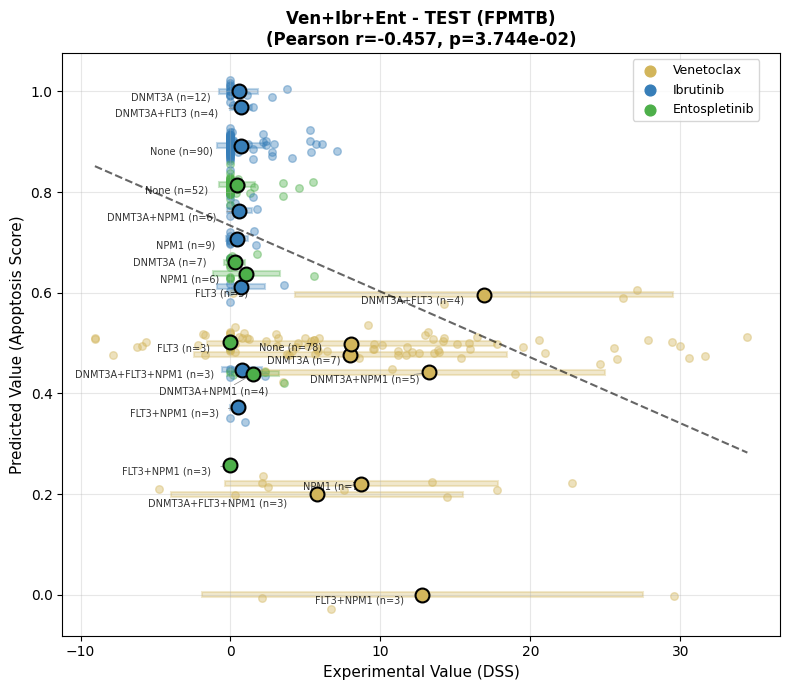

Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent/prediction_vs_experimental_individual.png


In [277]:
data_df = pd.read_csv('../data/FPMTB_sDSS_Ven+Ibr+Ent.csv')
expanded_plot(data_df, df_long, eval_result, drug2target, use_spearman=False, save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent/prediction_vs_experimental_individual.png')

In [128]:
create_FPMTB(df_long, gene_of_interest = gene_of_interest,
                            inhibitors=['Ibrutinib','Entospletinib','Venetoclax'],
                            drug2target=drug2target,
                            min_patients=5,
                            output_file='../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv')


Generating data for 8 profiles × 3 drugs = 24 experiments
Not enough patients for Entospletinib {'FLT3'}, skipping...
Not enough patients for Venetoclax {'FLT3'}, skipping...
Not enough patients for Ibrutinib {'NPM1', 'FLT3'}, skipping...
Not enough patients for Entospletinib {'NPM1', 'FLT3'}, skipping...
Not enough patients for Venetoclax {'NPM1', 'FLT3'}, skipping...
Not enough patients for Ibrutinib {'DNMT3A', 'FLT3'}, skipping...
Not enough patients for Entospletinib {'DNMT3A', 'FLT3'}, skipping...
Not enough patients for Venetoclax {'DNMT3A', 'FLT3'}, skipping...
Not enough patients for Entospletinib {'NPM1', 'DNMT3A'}, skipping...
Not enough patients for Ibrutinib {'NPM1', 'DNMT3A', 'FLT3'}, skipping...
Not enough patients for Venetoclax {'NPM1', 'DNMT3A', 'FLT3'}, skipping...

Saved 12 experiments to ../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv

Summary by drug:
               Total patients Mean DSS±SD
drug                                     
Entospletinib              65   0.59±0

,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BTK,1,DSS,0.71,90,1.61,Ibrutinib
1,2,,,SYK,1,DSS,0.43,52,1.19,Entospletinib
2,3,,,BCL2,1,DSS,8.04,78,9.61,Venetoclax
3,4,FLT3,1,BTK,1,DSS,0.72,5,1.61,Ibrutinib
4,5,,,"BTK,NPM1","1,1",DSS,0.43,9,0.72,Ibrutinib
5,6,,,"NPM1,SYK","1,1",DSS,1.07,6,2.24,Entospletinib
6,7,,,"BCL2,NPM1","1,1",DSS,8.73,7,9.11,Venetoclax
7,8,,,"BTK,DNMT3A","1,1",DSS,0.55,12,1.30,Ibrutinib
8,9,,,"DNMT3A,SYK","1,1",DSS,0.27,7,0.68,Entospletinib
9,10,,,"BCL2,DNMT3A","1,1",DSS,8.00,7,10.44,Venetoclax


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5/pbn.txt


Matched 284 individual samples to predictions


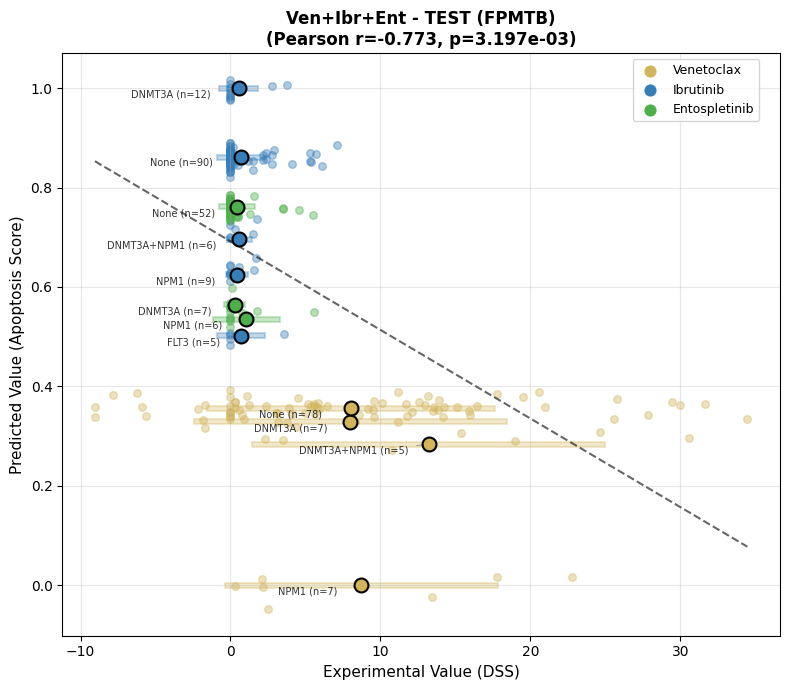

Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5/prediction_vs_experimental_individual.png


In [279]:
data_df = pd.read_csv('../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv')
expanded_plot(data_df, df_long, eval_result, drug2target, use_spearman=False, save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5/prediction_vs_experimental_individual.png')

## Not reversed apoptosis score

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=False
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ven+Ibr+Ent.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_apoptosis_not_reversed')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_apoptosis_not_reversed/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_apoptosis_not_reversed/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_apoptosis_not_reversed/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_apoptosis_not_reversed/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+

Matched 314 individual samples to predictions


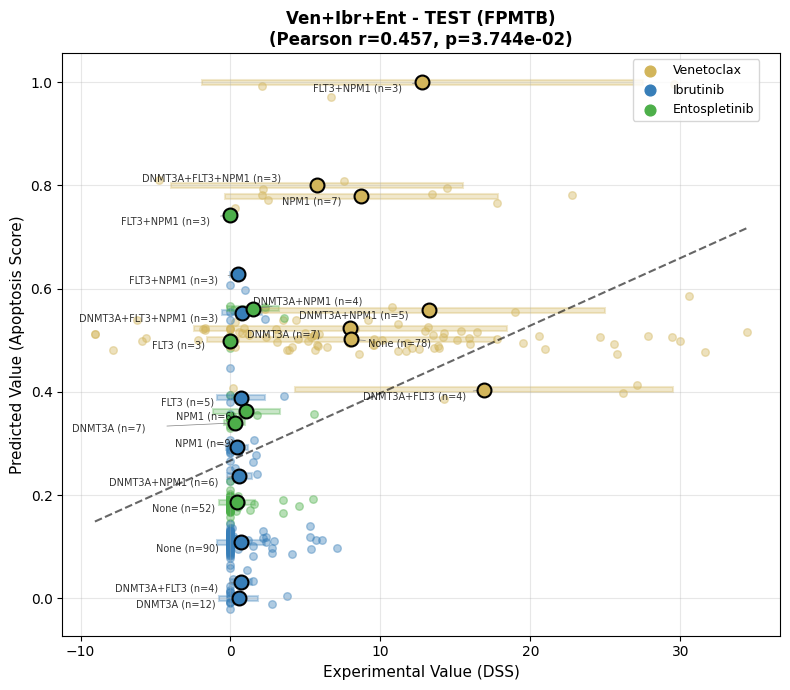

Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_apoptosis_not_reversed/prediction_vs_experimental_individual.png


In [286]:
data_df = pd.read_csv('../data/FPMTB_sDSS_Ven+Ibr+Ent.csv')
drug = 'Ven+Ibr+Ent'
expanded_plot(data_df, df_long, eval_result, drug2target, use_spearman=False, save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_apoptosis_not_reversed/prediction_vs_experimental_individual.png')

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=False
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5_apoptosis_not_reversed')

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5_apoptosis_not_reversed/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5_apoptosis_not_reversed/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5_apoptosis_not_reversed/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5_apoptosis_not_reversed/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+I

Matched 284 individual samples to predictions


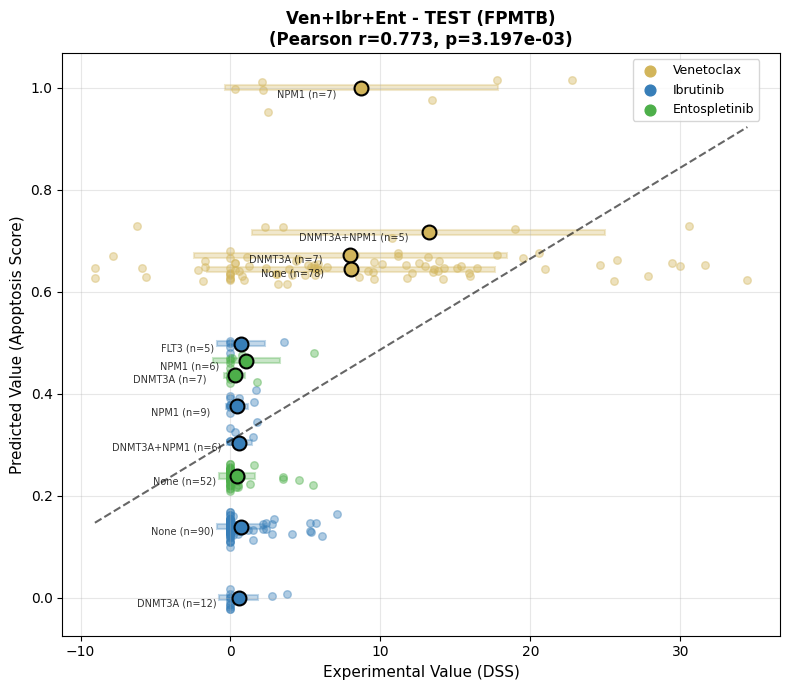

Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5_apoptosis_not_reversed/prediction_vs_experimental_individual.png


In [288]:
data_df = pd.read_csv('../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv')
expanded_plot(data_df, df_long, eval_result, drug2target, use_spearman=False, save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/FPMTB_sDSS_Ven+Ibr+Ent_min5_apoptosis_not_reversed/prediction_vs_experimental_individual.png')

## 3 drugs - extended

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ven+Ibr+Ent.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent')

No initial state provided, using a random initial state
PBN loaded successfully. There are 24 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent/pbn.txt


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent_min5')

No initial state provided, using a random initial state
PBN loaded successfully. There are 24 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent_min5/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent_min5/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent_min5/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+Ent_min5/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/FPMTB_sDSS_Ven+Ibr+En

## 5 drugs combined

In [289]:
create_FPMTB(df_long, gene_of_interest = gene_of_interest,
                            inhibitors=['Venetoclax', 'Ibrutinib', 'Entospletinib','Selumetinib','Midostaurin'],
                            drug2target=drug2target,
                            output_file='../data/FPMTB_sDSS_5drugs.csv')


Generating data for 8 profiles × 5 drugs = 40 experiments
Not enough patients for Venetoclax {'FLT3'}, skipping...
Not enough patients for Entospletinib {'DNMT3A', 'FLT3'}, skipping...

Saved 21 experiments to ../data/FPMTB_sDSS_5drugs.csv

Summary by drug:
               Total patients Mean DSS±SD
drug                                     
Entospletinib              75   0.55±0.62
Ibrutinib                 132   0.62±0.12
Venetoclax                107  10.50±3.91


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,DSS,8.04,78,9.61,Venetoclax
1,2,,,BTK,1,DSS,0.71,90,1.61,Ibrutinib
2,3,,,SYK,1,DSS,0.43,52,1.19,Entospletinib
3,4,FLT3,1,BTK,1,DSS,0.72,5,1.61,Ibrutinib
4,5,FLT3,1,SYK,1,DSS,0.00,3,0.00,Entospletinib
5,6,,,"BCL2,NPM1","1,1",DSS,8.73,7,9.11,Venetoclax
6,7,,,"BTK,NPM1","1,1",DSS,0.43,9,0.72,Ibrutinib
7,8,,,"NPM1,SYK","1,1",DSS,1.07,6,2.24,Entospletinib
8,9,,,"BCL2,DNMT3A","1,1",DSS,8.00,7,10.44,Venetoclax
9,10,,,"BTK,DNMT3A","1,1",DSS,0.55,12,1.30,Ibrutinib


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_5drugs.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs')

No initial state provided, using a random initial state
PBN loaded successfully. There are 24 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs/pbn.txt


Matched 314 individual samples to predictions


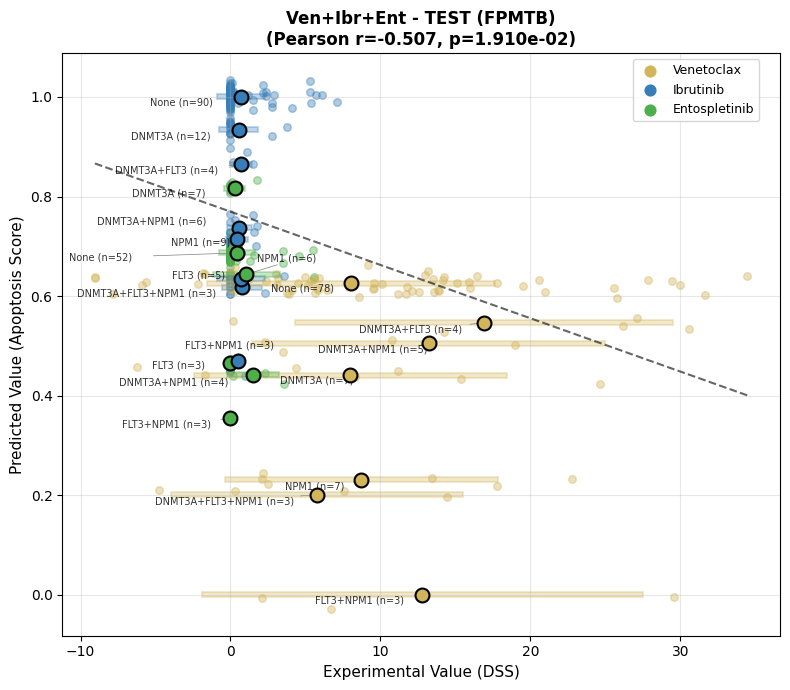

Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs/prediction_vs_experimental_individual.png


In [291]:
data_df = pd.read_csv('../data/FPMTB_sDSS_5drugs.csv')
expanded_plot(data_df, df_long, eval_result, drug2target, use_spearman=False, save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs/prediction_vs_experimental_individual.png')

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
eval_result = KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5')

No initial state provided, using a random initial state
PBN loaded successfully. There are 24 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5/pbn.txt


Matched 284 individual samples to predictions


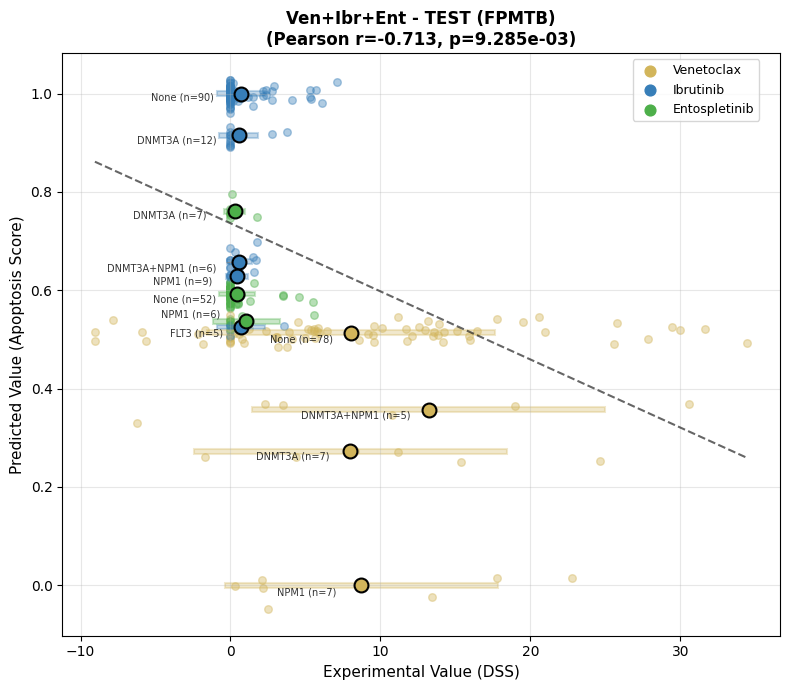

Saved: /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5/prediction_vs_experimental_individual.png


In [293]:
data_df = pd.read_csv('../data/FPMTB_sDSS_Ven+Ibr+Ent_min5.csv')
expanded_plot(data_df, df_long, eval_result, drug2target, use_spearman=False, save_path='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_5drugs_Waves1+2_AND+OR+IW_run2/FPMTB_sDSS_5drugs_min5/prediction_vs_experimental_individual.png')

## Extend on NRAS

In [347]:
gene_of_interest = ['FLT3','NPM1','DNMT3A','TP53']

genes_to_use = df_mutation.index.intersection(gene_of_interest)
df_mut_filt = df_mutation.loc[genes_to_use]

# Build mutation_profile per sample (set of mutated genes)
mutation_profile = df_mut_filt.apply(
    lambda col: {gene for gene, val in col.items() if val == 1},
    axis=0
)

# Filter DSS to selected drugs
drugs_to_use = df_dss.index.intersection(drugs)
df_dss_filt = df_dss.loc[drugs_to_use]

# Long-format DSS: one row per (sample, drug)
df_long = (
    df_dss_filt
    .reset_index()    
    .rename(columns={'index': 'drug'})
    .melt(id_vars='Drug_name',
          var_name='sample_id',
          value_name='DSS')
)

# drop missing DSS values
df_long = df_long.dropna(subset=['DSS'])

# Add mutation_profile column
df_long['mutation_profile'] = df_long['sample_id'].map(mutation_profile)
df_long = df_long.dropna(subset=['mutation_profile'])

create_FPMTB(df_long, gene_of_interest = gene_of_interest,
                            inhibitors=['Venetoclax'],
                            drug2target=drug2target,
                            output_file='../data/FPMTB_sDSS_Venetoclax_NRAS.csv')


Generating data for 16 profiles × 1 drugs = 16 experiments
Not enough patients for Venetoclax {'FLT3'}, skipping...

Saved 8 experiments to ../data/FPMTB_sDSS_Venetoclax_NRAS.csv

Summary by drug:
            Total patients Mean DSS±SD
drug                                  
Venetoclax             107   9.98±3.91


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,,,BCL2,1,DSS,8.11,75,9.78,Venetoclax
1,2,,,"BCL2,NPM1","1,1",DSS,8.73,7,9.11,Venetoclax
2,3,,,"BCL2,DNMT3A","1,1",DSS,8.00,7,10.44,Venetoclax
3,4,,,"BCL2,TP53","1,1",DSS,6.31,3,2.95,Venetoclax
4,5,FLT3,1,"BCL2,NPM1","1,1",DSS,12.80,3,14.73,Venetoclax
5,6,FLT3,1,"BCL2,DNMT3A","1,1",DSS,16.92,4,12.60,Venetoclax
6,7,,,"BCL2,DNMT3A,NPM1","1,1,1",DSS,13.23,5,11.77,Venetoclax
7,8,FLT3,1,"BCL2,DNMT3A,NPM1","1,1,1",DSS,5.76,3,9.73,Venetoclax


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Venetoclax_NRAS.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS')

No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/pbn.txt


{'metrics': {'overall': {'correlation': 0.1670101308244641,
   'p_value': 0.623556480264164,
   'mse': 1.209226143235943,
   'rmse': 1.0996481906664253,
   'mae': 0.9910843987763744,
   'r_squared': -12.248720421037985,
   'n_points': 11},
  'per_node': {'Formula': {'correlation': 0.1670101308244641,
    'p_value': 0.623556480264164,
    'mse': 1.209226143235943,
    'mae': 0.9910843987763744,
    'n_points': 11}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/Beat

In [ ]:
create_FPMTB(df_long, gene_of_interest = gene_of_interest,
                            inhibitors=['Ibrutinib'],
                            drug2target=drug2target,
                            output_file='../data/FPMTB_sDSS_Ibrutinib_NRAS.csv')
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)
KGBN.evaluate_pbn(pbn, '../data/FPMTB_sDSS_Ibrutinib_NRAS.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS')


Generating data for 8 profiles × 1 drugs = 8 experiments

Saved 8 experiments to ../data/FPMTB_sDSS_Ibrutinib_NRAS.csv

Summary by drug:
           Total patients Mean DSS±SD
drug                                 
Ibrutinib             132   0.62±0.12
No initial state provided, using a random initial state
PBN loaded successfully. There are 21 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+

{'metrics': {'overall': {'correlation': -0.08790565028079708,
   'p_value': 0.8360240403357684,
   'mse': 2.423818252595156,
   'rmse': 1.5568616677775697,
   'mae': 1.3888235294117648,
   'r_squared': -20.81554374695865,
   'n_points': 8},
  'per_node': {'Formula': {'correlation': -0.08790565028079708,
    'p_value': 0.8360240403357684,
    'mse': 2.423818252595156,
    'mae': 1.3888235294117648,
    'n_points': 8}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ibrutinib_NRAS_Waves1+2_AND+OR+IW/FPMTB_sDSS_NRAS/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/Beat

# Clinical cancer research data


In [213]:
df_mutation = pd.read_excel('/Users/luna/Desktop/Pancreatic cancer/Data/AML_ClinicalCancerResearch_QIN/ccr-23-1674_supplementary_table_s1-s14_suppts1.xlsx',sheet_name='TableS2 Var_AF0.01', usecols=['Sample', 'Gene'])
df_auc = pd.read_excel('/Users/luna/Desktop/Pancreatic cancer/Data/AML_ClinicalCancerResearch_QIN/ccr-23-1674_supplementary_table_s1-s14_suppts1.xlsx',sheet_name='TableS6 AUC')

In [214]:
gene_of_interest = ['FLT3','NPM1','DNMT3A']

# Filter mutations to genes of interest
df_mut_filt = df_mutation[df_mutation['Gene'].isin(gene_of_interest)]

# Build mutation_profile per sample (set of mutated genes)
mutation_profile = df_mut_filt.groupby('Sample')['Gene'].apply(set).to_dict()

# Filter to selected drugs
df_auc_filt = df_auc[df_auc['Drug_name'].isin(drugs)]

# Long-format DSS: one row per (sample, drug)
df_long = (
    df_auc_filt
    .reset_index()
    .melt(id_vars='Drug_name',
          var_name='sample_id',
          value_name='AUC')
)

# drop missing DSS values
df_long = df_long.dropna(subset=['AUC'])

# Add mutation_profile column
df_long['mutation_profile'] = df_long['sample_id'].map(mutation_profile)
df_long = df_long.dropna(subset=['mutation_profile'])
df_long

,Drug_name,sample_id,AUC,mutation_profile
25,Venetoclax,AML030,5.662928e-04,{NPM1}
26,Selumetinib,AML030,8.914090e-04,{NPM1}
27,Midostaurin,AML030,8.451757e-04,{NPM1}
28,Trametinib,AML030,2.608271e-05,{NPM1}
30,Venetoclax,AML039,5.092413e-04,{FLT3}
...,...,...,...,...
463,Trametinib,AML285,7.991812e-04,"{DNMT3A, FLT3}"
476,Selumetinib,AML291,3.674840e-05,{NPM1}
477,Midostaurin,AML291,1.229511e-03,{NPM1}
478,Trametinib,AML291,5.290032e-04,{NPM1}


In [215]:
df_long['Drug_name'].unique()

array(['Venetoclax', 'Selumetinib', 'Midostaurin', 'Trametinib',
       'Ibrutinib'], dtype=object)

In [216]:
df_long['mutation_profile'].value_counts()

mutation_profile
{DNMT3A}                20
{NPM1, DNMT3A}          14
{DNMT3A, FLT3}          14
{FLT3}                  12
{NPM1}                  10
{NPM1, FLT3}            10
{NPM1, DNMT3A, FLT3}     4
Name: count, dtype: int64

In [223]:
def create_CCR(df, gene_of_interest,
                    inhibitors=['Venetoclax'],
                    drug2target=None,
                    output_file='ccr_experiments.csv'):
    """
    Create experimental data CSV from CCR AUC data.
    
    Parameters:
    - df: DataFrame with mutation_profile, Drug_name, and AUC columns
    - gene_of_interest: List of genes
    - inhibitors: List of drug names
    - output_file: Output CSV filename
    
    Note: Oncogenes become Stimuli, TSGs become Inhibitors based on gene_to_class
    """
    
    # Drug to target mapping
    if drug2target is None:
        drug2target = {
            'Venetoclax': ['BCL2'], 
            'Ibrutinib': ['BTK'], 
            'Entospletinib': ['SYK'],
            'Trametinib': ['MAP2K1','MAP2K2'],
            'Selumetinib': ['MAP2K1','MAP2K2'],
            'Midostaurin': ['FLT3','KIT'],
            }
    
    # Normalize profile text for comparison
    def normalize_profile_text(p):
        if isinstance(p, (set, frozenset, list, tuple)):
            genes = sorted(map(str, p))
        else: 
            s = re.sub(r'[\\{\\}]', '', str(p))
            genes = sorted([g.strip() for g in s.split(',') if g.strip()])
        return set(genes) if genes else set()
    
    df_work = df.copy()
    df_work['profile_set'] = df_work['mutation_profile'].apply(normalize_profile_text)
   
    # Generate all mutation profile combinations
    from itertools import combinations
    all_profiles = []
    for r in range(len(gene_of_interest) + 1):
        for combo in combinations(gene_of_interest, r):
            all_profiles.append(set(combo))
    
    print(f"\\nGenerating data for {len(all_profiles)} profiles × {len(inhibitors)} drugs = {len(all_profiles) * len(inhibitors)} experiments")
    
    # Create experiment rows
    experiments = []
    exp_id = 1
    
    for profile in all_profiles:
        for drug in inhibitors:
            # Filter data for this profile and drug
            matching_data = df_work[
                (df_work['profile_set'] == profile) & 
                (df_work['Drug_name'] == drug)
            ]
            
            if len(matching_data) == 0:
                continue
            
            # Calculate average AUC
            avg_auc = matching_data['AUC'].mean()
            std_auc = matching_data['AUC'].std()
            n_patients = len(matching_data)
            
            # Classify genes as oncogenes or TSGs
            oncogenes = []
            tsgs = []
            
            for gene in profile:
                gene_class = gene_to_class.get(gene, 'unknown')
                if gene_class == 'oncogene':
                    oncogenes.append(gene)
                elif gene_class == 'TSG':
                    tsgs.append(gene)
                else:
                    print(f"Warning: Unknown classification for {gene}, treating as oncogene")
                    oncogenes.append(gene)
            
            # Oncogenes → Stimuli (activate)
            stimuli = ','.join(sorted(oncogenes)) if oncogenes else ''
            stimuli_efficacy = ','.join(['1'] * len(oncogenes)) if oncogenes else ''
            
            # TSGs + Drug target → Inhibitors (knockdown)
            target = drug2target.get(drug, '')
            if not target:
                print(f"Warning: No target mapping for {drug}, skipping...")
                continue
            
            all_inhibitors = sorted(tsgs + target)
            inhibitors_str = ','.join(all_inhibitors)
            inhibitors_efficacy = ','.join(['1'] * len(all_inhibitors))
            
            measured_nodes = 'AUC'
            measured_values = avg_auc
            
            experiments.append({
                'Experiments': exp_id,
                'Stimuli': stimuli,
                'Stimuli_efficacy': stimuli_efficacy,
                'Inhibitors': inhibitors_str,
                'Inhibitors_efficacy': inhibitors_efficacy,
                'Measured_nodes': measured_nodes,
                'Measured_values': measured_values,
                'n_patients': n_patients,
                'std': f'{std_auc:.2f}',
                'drug': drug
            })
            print(f"Found {len(matching_data)} patients for {drug} with {profile}")
            exp_id += 1
    if experiments is not None:
        # Create DataFrame
        exp_df = pd.DataFrame(experiments)
        
        # Save to CSV
        exp_df.to_csv(output_file, index=False)
        
        print(f"\\nSaved {len(exp_df)} experiments to {output_file}")
        print(f"\\nSummary by drug:")
        print(exp_df.groupby('drug').agg({
            'n_patients': 'sum',
            'Measured_values': lambda x: f"{pd.to_numeric(x).mean():.2f}±{pd.to_numeric(x).std():.2f}"
        }).rename(columns={'Measured_values': 'Mean AUC±SD', 'n_patients': 'Total patients'}))
        
        return exp_df 
    else:
        print("No experiments generated")
        return None

## Evaluation

In [29]:
df_long[df_long['Drug_name'] == 'Venetoclax']

,Drug_name,sample_id,AUC,mutation_profile
25,Venetoclax,AML030,0.000566,{NPM1}
30,Venetoclax,AML039,0.000509,{FLT3}
75,Venetoclax,AML062,0.000507,"{DNMT3A, NPM1}"
105,Venetoclax,AML071,0.000445,"{DNMT3A, NPM1}"
145,Venetoclax,AML098,0.001928,"{FLT3, DNMT3A}"
160,Venetoclax,AML133,0.000009,"{FLT3, NPM1}"
165,Venetoclax,AML135,0.000011,{DNMT3A}
175,Venetoclax,AML140,0.000022,{DNMT3A}
215,Venetoclax,AML154,0.000003,"{FLT3, NPM1}"


In [28]:
create_CCR(df_long, gene_of_interest = ['FLT3','NPM1','DNMT3A'],
                            inhibitors=['Venetoclax'],
                            drug2target=drug2target,
                            output_file='../data/CCR_AUC_Venetoclax.csv')

\nGenerating data for 8 profiles × 1 drugs = 8 experiments
\nSaved 6 experiments to ../data/CCR_AUC_Venetoclax.csv
\nSummary by drug:
            Total patients Mean AUC±SD
drug                                  
Venetoclax               9   0.00±0.00


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,FLT3,1,BCL2,1,AUC,0.000509,1,nan,Venetoclax
1,2,,,"BCL2,NPM1","1,1",AUC,0.000566,1,nan,Venetoclax
2,3,,,"BCL2,DNMT3A","1,1",AUC,0.000017,2,0.00,Venetoclax
3,4,FLT3,1,"BCL2,NPM1","1,1",AUC,0.000006,2,0.00,Venetoclax
4,5,FLT3,1,"BCL2,DNMT3A","1,1",AUC,0.001928,1,nan,Venetoclax
5,6,,,"BCL2,DNMT3A,NPM1","1,1,1",AUC,0.000476,2,0.00,Venetoclax


In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)

KGBN.evaluate_pbn(pbn, '../data/CCR_AUC_Venetoclax.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC')

No initial state provided, using a random initial state
PBN loaded successfully. There are 18 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/pbn.txt


{'metrics': {'overall': {'correlation': 0.20534937528762628,
   'p_value': 0.6963055608689779,
   'mse': 1.7634123126187689,
   'rmse': 1.3279353570933974,
   'mae': 1.270772646801901,
   'r_squared': -14.762564815013674,
   'n_points': 6},
  'per_node': {'Formula': {'correlation': 0.20534937528762628,
    'p_value': 0.6963055608689779,
    'mse': 1.7634123126187689,
    'mae': 1.270772646801901,
    'n_points': 6}}},
 'plot_paths': {'prediction_vs_experimental': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/prediction_vs_experimental.png',
  'residual_analysis': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/residual_analysis.png'},
 'report_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+IW/CCR_AUC/evaluation_report.txt',
 'csv_path': '/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Venetoclax_Waves1+2_AND+OR+I

In [221]:
df_long[df_long['Drug_name'] == 'Ibrutinib']

,Drug_name,sample_id,AUC,mutation_profile
479,Ibrutinib,AML291,4.273625e-07,{NPM1}


In [224]:
create_CCR(df_long, gene_of_interest = ['FLT3','NPM1','DNMT3A'],
                            inhibitors=['Entospletinib','Ibrutinib','Venetoclax'],
                            drug2target=drug2target,
                            output_file='../data/CCR_AUC_Ven+Ibr+Ent.csv')

\nGenerating data for 8 profiles × 3 drugs = 24 experiments
Found 1 patients for Venetoclax with {'FLT3'}
Found 1 patients for Ibrutinib with {'NPM1'}
Found 1 patients for Venetoclax with {'NPM1'}
Found 2 patients for Venetoclax with {'DNMT3A'}
Found 2 patients for Venetoclax with {'NPM1', 'FLT3'}
Found 1 patients for Venetoclax with {'DNMT3A', 'FLT3'}
Found 2 patients for Venetoclax with {'NPM1', 'DNMT3A'}
\nSaved 7 experiments to ../data/CCR_AUC_Ven+Ibr+Ent.csv
\nSummary by drug:
            Total patients Mean AUC±SD
drug                                  
Ibrutinib                1    0.00±nan
Venetoclax               9   0.00±0.00


,Experiments,Stimuli,Stimuli_efficacy,Inhibitors,Inhibitors_efficacy,Measured_nodes,Measured_values,n_patients,std,drug
0,1,FLT3,1,BCL2,1,AUC,5.092413e-04,1,nan,Venetoclax
1,2,,,"BTK,NPM1","1,1",AUC,4.273625e-07,1,nan,Ibrutinib
2,3,,,"BCL2,NPM1","1,1",AUC,5.662928e-04,1,nan,Venetoclax
3,4,,,"BCL2,DNMT3A","1,1",AUC,1.660301e-05,2,0.00,Venetoclax
4,5,FLT3,1,"BCL2,NPM1","1,1",AUC,5.772400e-06,2,0.00,Venetoclax
5,6,FLT3,1,"BCL2,DNMT3A","1,1",AUC,1.927834e-03,1,nan,Venetoclax
6,7,,,"BCL2,DNMT3A,NPM1","1,1,1",AUC,4.758314e-04,2,0.00,Venetoclax


# Drug combination - 3 drugs

In [ ]:
# Mutation profile × Drug combination Heatmap
# Simulate PBN on all mutation profile + drug treatment combinations

import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Load the PBN trained on all 3 drugs
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')

# Gene classification from Palma_class.csv
gene_to_class = {
    'FLT3': 'oncogene', 'NPM1': 'TSG', 'DNMT3A': 'TSG',
    'AKT1': 'oncogene', 'BCL2': 'oncogene', 'CCND1': 'oncogene',
    'CDKN2A': 'TSG', 'CEBPA': 'TSG', 'ETV6': 'TSG', 'FBXW7': 'TSG',
    'GSK3B': 'oncogene', 'HOXA9': 'oncogene', 'MAPK1': 'oncogene',
    'MEIS1': 'oncogene', 'MYC': 'oncogene', 'SOX4': 'oncogene',
    'STAT5A': 'oncogene', 'TP53': 'TSG', 'NRAS': 'oncogene'
}

# Drug to target mapping
drug2target = {
    'Venetoclax': ['BCL2'],
    'Ibrutinib': ['BTK'], 
    'Entospletinib': ['SYK'],
}
mutation_genes = ['FLT3', 'NPM1', 'DNMT3A']

drugs = ['Venetoclax', 'Ibrutinib', 'Entospletinib']

# Generate all mutation profile combinations (2^3 = 8 profiles)
all_mutation_profiles = []
for r in range(len(mutation_genes) + 1):
    for combo in itertools.combinations(mutation_genes, r):
        all_mutation_profiles.append(set(combo))

# Generate all drug combinations (2^3 = 8 conditions including no drug)
all_drug_combos = []
for r in range(len(drugs) + 1):
    for combo in itertools.combinations(drugs, r):
        all_drug_combos.append(list(combo))

print(f"Mutation profiles ({len(all_mutation_profiles)}):")
for p in all_mutation_profiles:
    label = '+'.join(sorted(p)) if p else 'None'
    print(f"  {label}")

print(f"\nDrug combinations ({len(all_drug_combos)}):")
for d in all_drug_combos:
    label = '+'.join(d) if d else 'No drug'
    print(f"  {label}")

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Mutation profiles (8):
  None
  FLT3
  NPM1
  DNMT3A
  FLT3+NPM1
  DNMT3A+FLT3
  DNMT3A+NPM1
  DNMT3A+FLT3+NPM1

Drug combinations (8):
  No drug
  Venetoclax
  Ibrutinib
  Entospletinib
  Venetoclax+Ibrutinib
  Venetoclax+Entospletinib
  Ibrutinib+Entospletinib
  Venetoclax+Ibrutinib+Entospletinib


In [ ]:
# Run simulation for all mutation profiles × drug combinations
np.random.seed(9)

# Store results: columns = mutation profiles, rows = drug conditions
results_matrix = []
condition_labels = []  # Row labels (drug conditions)
profile_labels = []    # Column labels (mutation profiles)

# Create profile labels
for profile in all_mutation_profiles:
    label = '+'.join(sorted(profile)) if profile else 'None'
    profile_labels.append(label)

# Simulation for each drug condition
for drug_combo in all_drug_combos:
    drug_label = '+'.join(drug_combo) if drug_combo else 'No drug'
    condition_labels.append(drug_label)
    
    # Get drug targets for this combination
    drug_targets = []
    for drug in drug_combo:
        drug_targets.extend(drug2target.get(drug, []))
    
    row_results = []
    
    # For each mutation profile
    for profile in all_mutation_profiles:
        # Classify mutation genes
        oncogenes_in_profile = []
        tsgs_in_profile = []
        
        for gene in profile:
            gene_class = gene_to_class.get(gene, 'unknown')
            if gene_class == 'oncogene':
                oncogenes_in_profile.append(gene)
            elif gene_class == 'TSG':
                tsgs_in_profile.append(gene)
        
        # Oncogenes → Stimuli (activate, fix to 1)
        stimuli = oncogenes_in_profile if oncogenes_in_profile else []
        
        # TSGs + Drug targets → Inhibitors (knockdown, fix to 0)
        inhibitors = list(set(tsgs_in_profile + drug_targets))
        
        # Filter to only genes that exist in the network
        stimuli = [g for g in stimuli if g in pbn.nodeDict]
        inhibitors = [g for g in inhibitors if g in pbn.nodeDict]
        
        # Run steady state simulation
        calc = KGBN.SteadyStateCalculator(pbn)
        calc.set_experimental_conditions(
            stimuli=stimuli if stimuli else None,
            inhibitors=inhibitors if inhibitors else None
        )
        
        steady_state = calc.compute_steady_state(
            method='tsmc',
            epsilon=0.05,
            r=0.1,
            s=0.85,
            p_mir=0.01,
            freeze_constant=True
        )
        
        # Calculate phenotype score (APOPTOSIS)
        # Using formula: - AKT1 - BCL2 + CDKN2A + GSK3B - MAPK1 - MEIS1 - STAT5A + TP53
        phenotype_genes = {
            'AKT1': -1, 'BCL2': -1, 'CDKN2A': 1, 'GSK3B': 1, 
            'MAPK1': -1, 'MEIS1': -1, 'STAT5A': -1, 'TP53': 1
        }
        
        score = 0
        for gene, coef in phenotype_genes.items():
            if gene in pbn.nodeDict:
                score += coef * steady_state[pbn.nodeDict[gene]]
        
        row_results.append(score)
        calc.reset_network_conditions()
    
    results_matrix.append(row_results)
    print(f"Completed: {drug_label}")

# Create DataFrame
results_df = pd.DataFrame(results_matrix, index=condition_labels, columns=profile_labels)
print("\n=== Simulation Results (APOPTOSIS score) ===")
print(results_df.round(3))

Completed: No drug
Completed: Venetoclax
Completed: Ibrutinib
Completed: Entospletinib
Completed: Venetoclax+Ibrutinib
Completed: Venetoclax+Entospletinib
Completed: Ibrutinib+Entospletinib
Completed: Venetoclax+Ibrutinib+Entospletinib

=== Simulation Results (APOPTOSIS score) ===
                                     None   FLT3   NPM1  DNMT3A  FLT3+NPM1  \
No drug                            -1.405 -1.460 -2.018  -1.066     -0.880   
Venetoclax                         -1.300 -0.509 -0.781  -1.050     -0.202   
Ibrutinib                          -1.445 -0.978 -1.200  -1.770     -0.546   
Entospletinib                      -3.790 -1.177 -3.529  -0.976     -1.741   
Venetoclax+Ibrutinib               -0.715 -0.548 -0.320  -0.730      0.180   
Venetoclax+Entospletinib           -1.047 -0.849 -0.684  -1.050     -0.489   
Ibrutinib+Entospletinib            -1.407 -1.160 -1.060  -1.770     -0.890   
Venetoclax+Ibrutinib+Entospletinib -0.640 -0.500 -0.690  -0.570      0.190   

               

In [305]:
results_df

,None,FLT3,NPM1,DNMT3A,FLT3+NPM1,DNMT3A+FLT3,DNMT3A+NPM1,DNMT3A+FLT3+NPM1
No drug,-1.404704,-1.460000,-2.018061,-1.065574,-0.880000,-1.164306,-0.567708,-0.915531
Venetoclax,-1.300000,-0.509434,-0.781116,-1.050000,-0.202156,-1.105691,-0.810606,-0.210000
Ibrutinib,-1.445000,-0.978462,-1.200000,-1.770000,-0.545977,-1.300000,-1.238636,-0.590000
Entospletinib,-3.789809,-1.176656,-3.528986,-0.976471,-1.741100,-1.339450,-0.630573,-0.910314
Venetoclax+Ibrutinib,-0.715328,-0.548387,-0.320000,-0.730000,0.180000,0.410000,0.080000,0.020000
Venetoclax+Entospletinib,-1.046632,-0.848611,-0.684211,-1.050000,-0.488746,-1.020000,-0.647482,-0.360000
Ibrutinib+Entospletinib,-1.406780,-1.160000,-1.060000,-1.770000,-0.889625,-1.340000,-1.410000,-0.400000
Venetoclax+Ibrutinib+Entospletinib,-0.640000,-0.500000,-0.690000,-0.570000,0.190000,0.170000,-0.430000,-0.680000


/var/folders/3q/mq6dnx4n3xz43nfx45y0by480000gn/T/ipykernel_36894/973875139.py:77: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


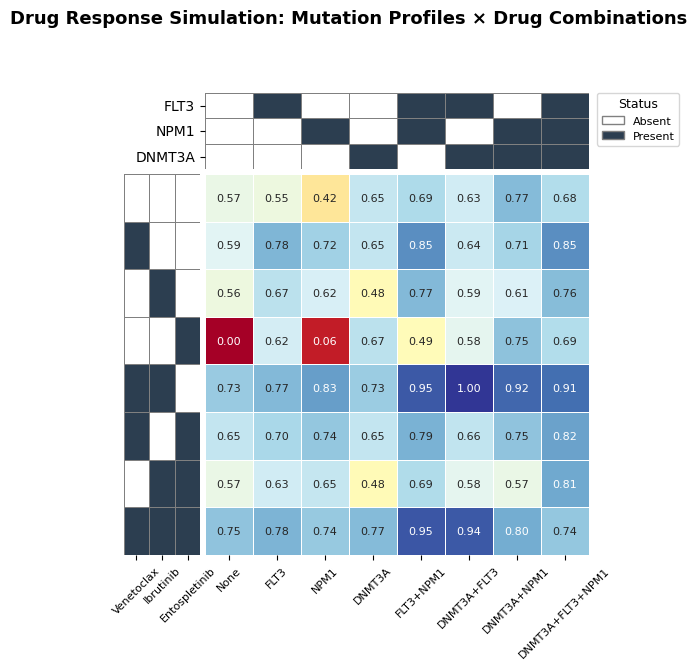


Heatmap saved to: mutation_drug_heatmap.png


In [284]:
# Create annotated heatmap with mutation profiles and drug conditions

# Create binary matrices for annotation
# Mutation profile annotation (which genes are mutated in each profile)
mutation_annotation = pd.DataFrame(0, index=mutation_genes, columns=profile_labels)
for i, profile in enumerate(all_mutation_profiles):
    for gene in profile:
        mutation_annotation.loc[gene, profile_labels[i]] = 1

# Drug condition annotation (which drugs are used in each condition)
drug_annotation = pd.DataFrame(0, index=drugs, columns=condition_labels)
for i, drug_combo in enumerate(all_drug_combos):
    for drug in drug_combo:
        drug_annotation.loc[drug, condition_labels[i]] = 1

# Create figure with subplots
fig = plt.figure(figsize=(6, 6))

# Define grid for subplots
gs = fig.add_gridspec(2, 2, width_ratios=[0.2, 1], height_ratios=[0.2, 1],
                      hspace=0.02, wspace=0.02)

# Subplot positions
ax_mut = fig.add_subplot(gs[0, 1])      # Mutation annotation (top)
ax_drug = fig.add_subplot(gs[1, 0])     # Drug annotation (left)
ax_main = fig.add_subplot(gs[1, 1])     # Main heatmap

# Color settings
bw = ListedColormap(['white', '#2C3E50'])  # dark blue-gray for active
heat = sns.color_palette('RdYlBu', as_cmap=True)  # high=blue (good), low=red (bad)

# 1. Mutation annotation heatmap (top) - transpose so rows=genes, cols=profiles
sns.heatmap(mutation_annotation, cmap=bw, ax=ax_mut, cbar=False,
            linewidths=0.5, linecolor='gray',
            xticklabels=False, yticklabels=True)
ax_mut.set_ylabel('')
# ax_mut.set_title('Mutation Profiles', fontsize=12, fontweight='bold')
ax_mut.tick_params(axis='y', rotation=0)

# 2. Drug annotation heatmap (left) - transpose so rows=drugs, cols=conditions
drug_annotation_T = drug_annotation.T  # Transpose: rows=conditions, cols=drugs
sns.heatmap(drug_annotation_T, cmap=bw, ax=ax_drug, cbar=False,
            linewidths=0.5, linecolor='gray',
            xticklabels=True, yticklabels=False)
ax_drug.set_xlabel('')
ax_drug.set_ylabel('')
ax_drug.tick_params(axis='x', rotation=45, labelsize=8)
ax_drug.tick_params(axis='y', rotation=0, labelsize=8)

# 3. Main heatmap (APOPTOSIS scores)
vmin, vmax = results_df.values.min(), results_df.values.max()
# normalize the heatmap
results_df_normalized = (results_df - vmin) / (vmax - vmin)
sns.heatmap(results_df_normalized, cmap=heat, ax=ax_main, cbar=False,
            linewidths=0.5, linecolor='white',
            annot=True, fmt='.2f', annot_kws={'size': 8},
            xticklabels=True, yticklabels=False,
            cbar_kws={'label': 'APOPTOSIS Score'})
# ax_main.set_xlabel('Mutation Profile', fontsize=11)
ax_main.set_ylabel('')
ax_main.tick_params(axis='x', rotation=45, labelsize=8)

# Add legend for binary annotation
legend_elements = [
    plt.Rectangle((0,0), 1, 1, facecolor='white', edgecolor='gray', label='Absent'),
    plt.Rectangle((0,0), 1, 1, facecolor='#2C3E50', edgecolor='gray', label='Present')
]
fig.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.06, 0.89),
           title='Status', fontsize=8, title_fontsize=9)

plt.suptitle('Drug Response Simulation: Mutation Profiles × Drug Combinations',
             fontsize=13, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig('mutation_drug_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nHeatmap saved to: mutation_drug_heatmap.png")

/var/folders/3q/mq6dnx4n3xz43nfx45y0by480000gn/T/ipykernel_36894/1794874000.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


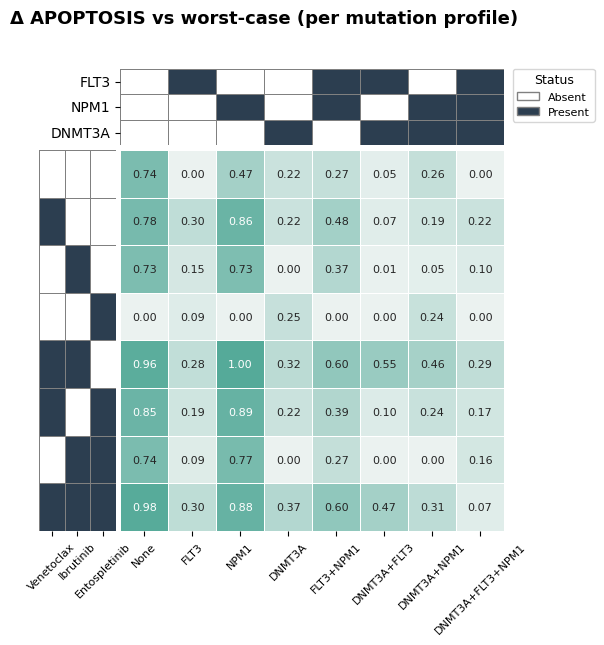


Heatmap saved to: mutation_drug_heatmap.png


In [310]:
# --- Delta transform (per mutation profile) ---
# Reference = worst predicted condition (minimum apoptosis score) within each column/profile
ref_per_profile = results_df.min(axis=0)              # Series, length = #profiles
results_delta = results_df.sub(ref_per_profile, axis=1)  # now min in each column = 0

# Create figure
fig = plt.figure(figsize=(6, 6))

# Define grid for subplots
gs = fig.add_gridspec(2, 2, width_ratios=[0.2, 1], height_ratios=[0.2, 1],
                      hspace=0.02, wspace=0.02)

# Subplot positions
ax_mut = fig.add_subplot(gs[0, 1])      # Mutation annotation (top)
ax_drug = fig.add_subplot(gs[1, 0])     # Drug annotation (left)
ax_main = fig.add_subplot(gs[1, 1])     # Main heatmap

# Color settings
bw = ListedColormap(['white', '#2C3E50'])  # dark blue-gray for active
color_palette = sns.color_palette("light:#5A9", as_cmap=True)  # high=blue (good), low=white (bad)

# 1. Mutation annotation heatmap (top) - transpose so rows=genes, cols=profiles
sns.heatmap(mutation_annotation, cmap=bw, ax=ax_mut, cbar=False,
            linewidths=0.5, linecolor='gray',
            xticklabels=False, yticklabels=True)
ax_mut.set_ylabel('')
# ax_mut.set_title('Mutation Profiles', fontsize=12, fontweight='bold')
ax_mut.tick_params(axis='y', rotation=0)

# 2. Drug annotation heatmap (left) - transpose so rows=drugs, cols=conditions
drug_annotation_T = drug_annotation.T  # Transpose: rows=conditions, cols=drugs
sns.heatmap(drug_annotation_T, cmap=bw, ax=ax_drug, cbar=False,
            linewidths=0.5, linecolor='gray',
            xticklabels=True, yticklabels=False)
ax_drug.set_xlabel('')
ax_drug.set_ylabel('')
ax_drug.tick_params(axis='x', rotation=45, labelsize=8)
ax_drug.tick_params(axis='y', rotation=0, labelsize=8)

# 3. Main heatmap (APOPTOSIS scores)
vmin, vmax = results_delta.values.min(), results_delta.values.max()
# # normalize the heatmap
results_df_normalized = (results_delta - vmin) / (vmax - vmin)
sns.heatmap(results_df_normalized, cmap=color_palette, ax=ax_main, cbar=False,
            linewidths=0.5, linecolor='white',
            annot=True, fmt='.2f', annot_kws={'size': 8},
            xticklabels=True, yticklabels=False,
            cbar_kws={'label': 'APOPTOSIS Score'})
# ax_main.set_xlabel('Mutation Profile', fontsize=11)
ax_main.set_ylabel('')
ax_main.tick_params(axis='x', rotation=45, labelsize=8)

# Add legend for binary annotation
legend_elements = [
    plt.Rectangle((0,0), 1, 1, facecolor='white', edgecolor='gray', label='Absent'),
    plt.Rectangle((0,0), 1, 1, facecolor='#2C3E50', edgecolor='gray', label='Present')
]
fig.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.06, 0.89),
           title='Status', fontsize=8, title_fontsize=9)

plt.suptitle('Δ APOPTOSIS vs worst-case (per mutation profile)',
             fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig('mutation_drug_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nHeatmap saved to: mutation_drug_heatmap.png")

In [259]:
# Summary analysis: Best drug combinations for each mutation profile

print("=" * 60)
print("SUMMARY: Best Drug Combinations by Mutation Profile")
print("=" * 60)

# Calculate drug effect (difference from no drug baseline)
baseline = results_df.loc['No drug']
drug_effect_df = results_df.subtract(baseline, axis=1)

print("\n--- Drug Effect (APOPTOSIS score change from No drug) ---")
print(drug_effect_df.round(3))

print("\n--- Best Drug for Each Mutation Profile ---")
for profile in profile_labels:
    profile_effects = drug_effect_df[profile].drop('No drug')
    best_drug = profile_effects.idxmax()
    best_effect = profile_effects.max()
    baseline_score = baseline[profile]
    print(f"\n{profile}:")
    print(f"  Baseline (No drug): {baseline_score:.3f}")
    print(f"  Best treatment: {best_drug} (+{best_effect:.3f})")
    print(f"  Top 3 treatments:")
    top3 = profile_effects.nlargest(3)
    for drug, effect in top3.items():
        print(f"    - {drug}: +{effect:.3f} (total: {baseline_score + effect:.3f})")

# Overall ranking
print("\n" + "=" * 60)
print("OVERALL DRUG RANKING (Average effect across all profiles)")
print("=" * 60)
avg_effects = drug_effect_df.drop('No drug').mean(axis=1).sort_values(ascending=False)
for drug, effect in avg_effects.items():
    print(f"  {drug}: +{effect:.3f}")

# Save results to CSV
results_df.to_csv('mutation_drug_simulation_results.csv')
drug_effect_df.to_csv('mutation_drug_effects.csv')
print("\n\nResults saved to:")
print("  - mutation_drug_simulation_results.csv")
print("  - mutation_drug_effects.csv")

SUMMARY: Best Drug Combinations by Mutation Profile

--- Drug Effect (APOPTOSIS score change from No drug) ---
                                     None   FLT3   NPM1  DNMT3A  FLT3+NPM1  \
No drug                             0.000  0.000  0.000   0.000      0.000   
Venetoclax                          0.105  0.951  1.237   0.016      0.678   
Ibrutinib                          -0.040  0.482  0.818  -0.704      0.334   
Entospletinib                      -2.385  0.283 -1.511   0.089     -0.861   
Venetoclax+Ibrutinib                0.689  0.912  1.698   0.336      1.060   
Venetoclax+Entospletinib            0.358  0.611  1.334   0.016      0.391   
Ibrutinib+Entospletinib            -0.002  0.300  0.958  -0.704     -0.010   
Venetoclax+Ibrutinib+Entospletinib  0.765  0.960  1.328   0.496      1.070   

                                    DNMT3A+FLT3  DNMT3A+NPM1  DNMT3A+FLT3+NPM1  
No drug                                   0.000        0.000             0.000  
Venetoclax              

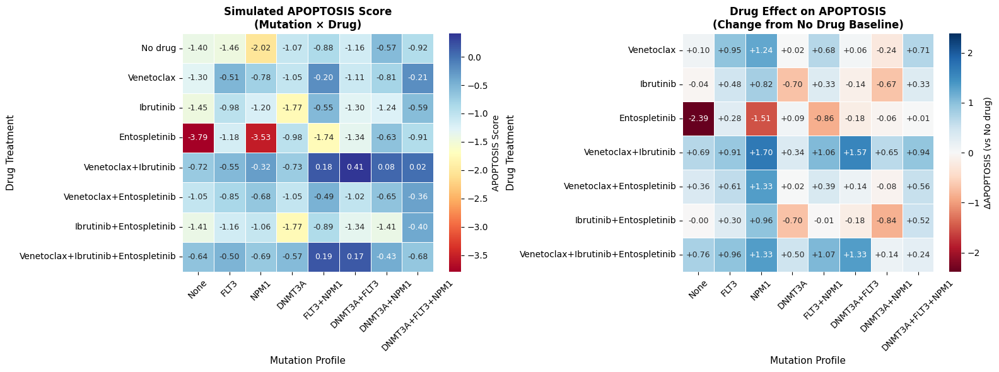


Heatmap saved to: drug_effect_heatmap.png

Interpretation:
  - RED values indicate INCREASED apoptosis (beneficial drug effect)
  - BLUE values indicate DECREASED apoptosis (harmful or no effect)
  - Higher magnitude = stronger effect


In [260]:
# Simplified heatmap: Drug Effect on APOPTOSIS score

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 1. Absolute APOPTOSIS scores
ax1 = axes[0]
sns.heatmap(results_df, cmap='RdYlBu', ax=ax1, cbar=True,
            linewidths=0.5, linecolor='white',
            annot=True, fmt='.2f', annot_kws={'size': 9},
            cbar_kws={'label': 'APOPTOSIS Score'})
ax1.set_title('Simulated APOPTOSIS Score\n(Mutation × Drug)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Mutation Profile', fontsize=11)
ax1.set_ylabel('Drug Treatment', fontsize=11)
ax1.tick_params(axis='x', rotation=45)
ax1.tick_params(axis='y', rotation=0)

# 2. Drug effect (change from baseline)
ax2 = axes[1]
# Remove 'No drug' row for effect heatmap
effect_no_baseline = drug_effect_df.drop('No drug')

# Center the colormap at 0
max_abs = max(abs(effect_no_baseline.values.min()), abs(effect_no_baseline.values.max()))
sns.heatmap(effect_no_baseline, cmap='RdBu', ax=ax2, cbar=True,
            linewidths=0.5, linecolor='white',
            annot=True, fmt='+.2f', annot_kws={'size': 9},
            center=0, vmin=-max_abs, vmax=max_abs,
            cbar_kws={'label': 'ΔAPOPTOSIS (vs No drug)'})
ax2.set_title('Drug Effect on APOPTOSIS\n(Change from No Drug Baseline)', fontsize=12, fontweight='bold')
ax2.set_xlabel('Mutation Profile', fontsize=11)
ax2.set_ylabel('Drug Treatment', fontsize=11)
ax2.tick_params(axis='x', rotation=45)
ax2.tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.savefig('drug_effect_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nHeatmap saved to: drug_effect_heatmap.png")
print("\nInterpretation:")
print("  - RED values indicate INCREASED apoptosis (beneficial drug effect)")
print("  - BLUE values indicate DECREASED apoptosis (harmful or no effect)")
print("  - Higher magnitude = stronger effect")


In [18]:
results_df = results_df.drop('No drug')

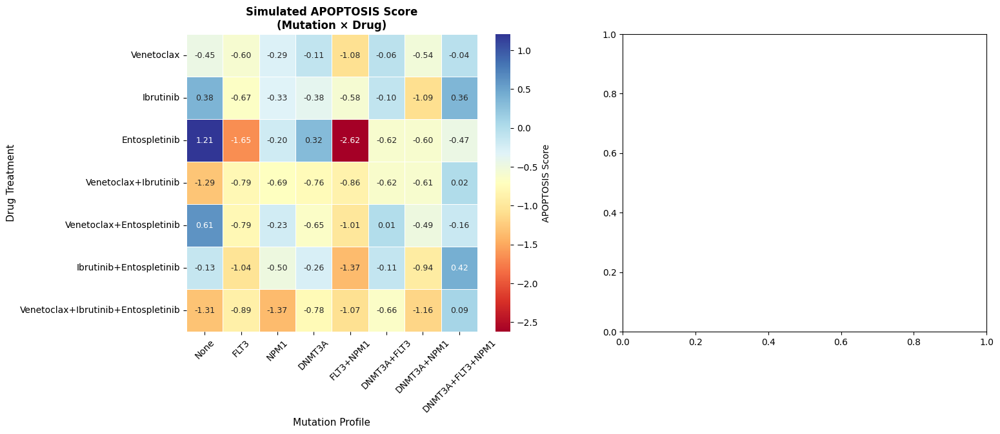

In [19]:
# Simplified heatmap: Drug Effect on APOPTOSIS score

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 1. Absolute APOPTOSIS scores
ax1 = axes[0]
sns.heatmap(results_df, cmap='RdYlBu', ax=ax1, cbar=True,
            linewidths=0.5, linecolor='white',
            annot=True, fmt='.2f', annot_kws={'size': 9},
            cbar_kws={'label': 'APOPTOSIS Score'})
ax1.set_title('Simulated APOPTOSIS Score\n(Mutation × Drug)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Mutation Profile', fontsize=11)
ax1.set_ylabel('Drug Treatment', fontsize=11)
ax1.tick_params(axis='x', rotation=45)
ax1.tick_params(axis='y', rotation=0)

# Drug combination - 5 drugs

In [ ]:
# Mutation profile × Drug combination Heatmap
# Simulate PBN on all mutation profile + drug treatment combinations

import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Load the PBN trained on all 3 drugs
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW/pbn.txt')

# Gene classification from Palma_class.csv
gene_to_class = {
    'FLT3': 'oncogene', 'NPM1': 'TSG', 'DNMT3A': 'TSG',
    'AKT1': 'oncogene', 'BCL2': 'oncogene', 'CCND1': 'oncogene',
    'CDKN2A': 'TSG', 'CEBPA': 'TSG', 'ETV6': 'TSG', 'FBXW7': 'TSG',
    'GSK3B': 'oncogene', 'HOXA9': 'oncogene', 'MAPK1': 'oncogene',
    'MEIS1': 'oncogene', 'MYC': 'oncogene', 'SOX4': 'oncogene',
    'STAT5A': 'oncogene', 'TP53': 'TSG', 'NRAS': 'oncogene'
}

# Drug to target mapping
drug2target = {
    'Venetoclax': ['BCL2'], 
    'Ibrutinib': ['BTK'], 
    'Entospletinib': ['SYK'],
    'Selumetinib': ['MAP2K1','MAP2K2'],
    'Midostaurin': ['FLT3','KIT'],
    }
mutation_genes = ['FLT3', 'NPM1', 'DNMT3A']

drugs = ['Venetoclax', 'Ibrutinib', 'Entospletinib', 'Selumetinib', 'Midostaurin']

# Generate all mutation profile combinations (2^3 = 8 profiles)
all_mutation_profiles = []
for r in range(len(mutation_genes) + 1):
    for combo in itertools.combinations(mutation_genes, r):
        all_mutation_profiles.append(set(combo))

# Generate all drug combinations
all_drug_combos = []
for r in range(len(drugs) + 1):
    for combo in itertools.combinations(drugs, r):
        all_drug_combos.append(list(combo))

print(f"Mutation profiles ({len(all_mutation_profiles)}):")
for p in all_mutation_profiles:
    label = '+'.join(sorted(p)) if p else 'None'
    print(f"  {label}")

print(f"\nDrug combinations ({len(all_drug_combos)}):")
for d in all_drug_combos:
    label = '+'.join(d) if d else 'No drug'
    print(f"  {label}")

No initial state provided, using a random initial state
PBN loaded successfully. There are 20 genes in the network.
Mutation profiles (8):
  None
  FLT3
  NPM1
  DNMT3A
  FLT3+NPM1
  DNMT3A+FLT3
  DNMT3A+NPM1
  DNMT3A+FLT3+NPM1

Drug combinations (32):
  No drug
  Venetoclax
  Ibrutinib
  Entospletinib
  Selumetinib
  Midostaurin
  Venetoclax+Ibrutinib
  Venetoclax+Entospletinib
  Venetoclax+Selumetinib
  Venetoclax+Midostaurin
  Ibrutinib+Entospletinib
  Ibrutinib+Selumetinib
  Ibrutinib+Midostaurin
  Entospletinib+Selumetinib
  Entospletinib+Midostaurin
  Selumetinib+Midostaurin
  Venetoclax+Ibrutinib+Entospletinib
  Venetoclax+Ibrutinib+Selumetinib
  Venetoclax+Ibrutinib+Midostaurin
  Venetoclax+Entospletinib+Selumetinib
  Venetoclax+Entospletinib+Midostaurin
  Venetoclax+Selumetinib+Midostaurin
  Ibrutinib+Entospletinib+Selumetinib
  Ibrutinib+Entospletinib+Midostaurin
  Ibrutinib+Selumetinib+Midostaurin
  Entospletinib+Selumetinib+Midostaurin
  Venetoclax+Ibrutinib+Entospletinib+S

In [ ]:
# Run simulation for all mutation profiles × drug combinations
np.random.seed(9)

# Store results: columns = mutation profiles, rows = drug conditions
results_matrix = []
condition_labels = []  # Row labels (drug conditions)
profile_labels = []    # Column labels (mutation profiles)

# Create profile labels
for profile in all_mutation_profiles:
    label = '+'.join(sorted(profile)) if profile else 'None'
    profile_labels.append(label)

# Simulation for each drug condition
for drug_combo in all_drug_combos:
    drug_label = '+'.join(drug_combo) if drug_combo else 'No drug'
    condition_labels.append(drug_label)
    
    # Get drug targets for this combination
    drug_targets = []
    for drug in drug_combo:
        drug_targets.extend(drug2target.get(drug, []))
    
    row_results = []
    
    # For each mutation profile
    for profile in all_mutation_profiles:
        # Classify mutation genes
        oncogenes_in_profile = []
        tsgs_in_profile = []
        
        for gene in profile:
            gene_class = gene_to_class.get(gene, 'unknown')
            if gene_class == 'oncogene':
                oncogenes_in_profile.append(gene)
            elif gene_class == 'TSG':
                tsgs_in_profile.append(gene)
        
        # Oncogenes → Stimuli (activate, fix to 1)
        stimuli = oncogenes_in_profile if oncogenes_in_profile else []
        
        # TSGs + Drug targets → Inhibitors (knockdown, fix to 0)
        inhibitors = list(set(tsgs_in_profile + drug_targets))
        
        # Filter to only genes that exist in the network
        stimuli = [g for g in stimuli if g in pbn.nodeDict]
        inhibitors = [g for g in inhibitors if g in pbn.nodeDict]
        
        # Run steady state simulation
        calc = KGBN.SteadyStateCalculator(pbn)
        calc.set_experimental_conditions(
            stimuli=stimuli if stimuli else None,
            inhibitors=inhibitors if inhibitors else None
        )
        
        steady_state = calc.compute_steady_state(
            method='tsmc',
            epsilon=0.05,
            r=0.1,
            s=0.85,
            p_mir=0.01,
            freeze_constant=True
        )
        
        # Calculate phenotype score (APOPTOSIS)
        # Using formula: - AKT1 - BCL2 + CDKN2A + GSK3B - MAPK1 - MEIS1 - STAT5A + TP53
        phenotype_genes = {
            'AKT1': -1, 'BCL2': -1, 'CDKN2A': 1, 'GSK3B': 1, 
            'MAPK1': -1, 'MEIS1': -1, 'STAT5A': -1, 'TP53': 1
        }
        
        score = 0
        for gene, coef in phenotype_genes.items():
            if gene in pbn.nodeDict:
                score += coef * steady_state[pbn.nodeDict[gene]]
        
        row_results.append(score)
        calc.reset_network_conditions()
    
    results_matrix.append(row_results)
    print(f"Completed: {drug_label}")

# Create DataFrame
results_df = pd.DataFrame(results_matrix, index=condition_labels, columns=profile_labels)
print("\n=== Simulation Results (APOPTOSIS score) ===")
print(results_df.round(3))

Completed: No drug
Completed: Venetoclax
Completed: Ibrutinib
Completed: Entospletinib
Completed: Selumetinib
Completed: Midostaurin
Completed: Venetoclax+Ibrutinib
Completed: Venetoclax+Entospletinib
Completed: Venetoclax+Selumetinib
Completed: Venetoclax+Midostaurin
Completed: Ibrutinib+Entospletinib
Completed: Ibrutinib+Selumetinib
Completed: Ibrutinib+Midostaurin
Completed: Entospletinib+Selumetinib
Completed: Entospletinib+Midostaurin
Completed: Selumetinib+Midostaurin
Completed: Venetoclax+Ibrutinib+Entospletinib
Completed: Venetoclax+Ibrutinib+Selumetinib
Completed: Venetoclax+Ibrutinib+Midostaurin
Completed: Venetoclax+Entospletinib+Selumetinib
Completed: Venetoclax+Entospletinib+Midostaurin
Completed: Venetoclax+Selumetinib+Midostaurin
Completed: Ibrutinib+Entospletinib+Selumetinib
Completed: Ibrutinib+Entospletinib+Midostaurin
Completed: Ibrutinib+Selumetinib+Midostaurin
Completed: Entospletinib+Selumetinib+Midostaurin
Completed: Venetoclax+Ibrutinib+Entospletinib+Selumetinib

/var/folders/3q/mq6dnx4n3xz43nfx45y0by480000gn/T/ipykernel_36894/3853940978.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


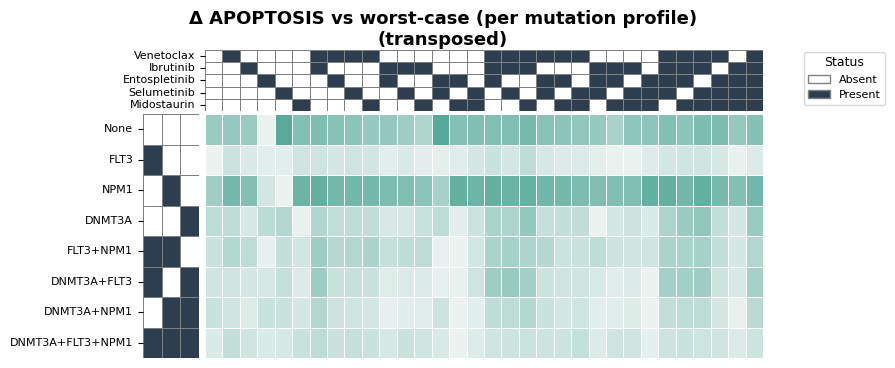

In [346]:
# Create binary matrices for annotation
# Mutation profile annotation (which genes are mutated in each profile)
mutation_annotation = pd.DataFrame(0, index=mutation_genes, columns=profile_labels)
for i, profile in enumerate(all_mutation_profiles):
    for gene in profile:
        mutation_annotation.loc[gene, profile_labels[i]] = 1

# Drug condition annotation (which drugs are used in each condition)
drug_annotation = pd.DataFrame(0, index=drugs, columns=condition_labels)
for i, drug_combo in enumerate(all_drug_combos):
    for drug in drug_combo:
        drug_annotation.loc[drug, condition_labels[i]] = 1

# --- Delta transform (per mutation profile) ---
# Reference = worst predicted condition (minimum apoptosis score) within each column/profile
ref_per_profile = results_df.min(axis=0)              # Series, length = #profiles
results_delta = results_df.sub(ref_per_profile, axis=1)  # now min in each column = 0

# Create figure
fig = plt.figure(figsize=(8, 4))  # Swap width/height for transpose

# Define grid for subplots (swap width_ratios and height_ratios)
gs = fig.add_gridspec(2, 2, width_ratios=[0.1, 1], height_ratios=[0.25, 1],
                      hspace=0.02, wspace=0.02)

# Subplot positions (transpose: mutation left, drug top, main heatmap rotated)
ax_mut = fig.add_subplot(gs[1, 0])      # Mutation annotation (left)
ax_drug = fig.add_subplot(gs[0, 1])     # Drug annotation (top)
ax_main = fig.add_subplot(gs[1, 1])     # Main heatmap

# Color settings
bw = ListedColormap(['white', '#2C3E50'])  # dark blue-gray for active
color_palette = sns.color_palette("light:#5A9", as_cmap=True)  # high=blue (good), low=white (bad)

# 1. Mutation annotation heatmap (left, transpose)
mutation_annotation_T = mutation_annotation.T  # Now rows=profiles, cols=genes
sns.heatmap(
    mutation_annotation_T, cmap=bw, ax=ax_mut, cbar=False,
    linewidths=0.5, linecolor='gray',
    xticklabels=False, yticklabels=True
)
ax_mut.set_xlabel('')
ax_mut.set_ylabel('')
ax_mut.tick_params(axis='y', rotation=0, labelsize=8)
ax_mut.tick_params(axis='x', rotation=0, labelsize=8)

# 2. Drug annotation heatmap (top, transpose)
sns.heatmap(
    drug_annotation, cmap=bw, ax=ax_drug, cbar=False,
    linewidths=0.5, linecolor='gray',
    xticklabels=False, yticklabels=True
)
ax_drug.set_xlabel('')
ax_drug.set_ylabel('')
ax_drug.tick_params(axis='x', rotation=45, labelsize=8)
ax_drug.tick_params(axis='y', rotation=0, labelsize=8)

# 3. Main heatmap (APOPTOSIS scores, transposed)
vmin, vmax = results_delta.values.min(), results_delta.values.max()
results_df_normalized = (results_delta - vmin) / (vmax - vmin)
sns.heatmap(
    results_df_normalized.T,  # Transpose for main heatmap
    cmap=color_palette, ax=ax_main, cbar=False,
    linewidths=0.5, linecolor='white',
    annot=False,  # Hide in-cell text
    xticklabels=False, yticklabels=False,
    cbar_kws={'label': 'Δ APOPTOSIS (normalized)'}
)
ax_main.set_xlabel('')
ax_main.set_ylabel('')
# ax_main.tick_params(axis='x', rotation=45, labelsize=8)

# Add legend for binary annotation
legend_elements = [
    plt.Rectangle((0,0), 1, 1, facecolor='white', edgecolor='gray', label='Absent'),
    plt.Rectangle((0,0), 1, 1, facecolor='#2C3E50', edgecolor='gray', label='Present')
]
fig.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.06, 0.89),
           title='Status', fontsize=8, title_fontsize=9)

plt.suptitle('Δ APOPTOSIS vs worst-case (per mutation profile)\n(transposed)',
             fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig('mutation_drug_heatmap_5drugs_transposed.png', dpi=150, bbox_inches='tight')
plt.show()

# Performance on other drug

In [ ]:
pbn = KGBN.load_pbn_from_file('/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/pbn.txt')
formula = KGBN.phenotype_scores(
    genes=pbn.nodeDict.keys(),
    simulation_results=None,
    phenotypes=['APOPTOSIS'],
    reversed=True
)

eval_result = KGBN.evaluate_pbn(pbn, '../data/BeatAML_AUC_Trametinib_waves3+4.csv', 
    config=config, 
    Measured_formula=formula['APOPTOSIS'],
    normalize=True,
    output_dir='/Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/BeatAML_AUC_Trametinib/waves3+4')

No initial state provided, using a random initial state
PBN loaded successfully. There are 24 genes in the network.
Path found for 1 phenotypes: ['APOPTOSIS']
Plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/BeatAML_AUC_Trametinib/waves3+4/prediction_vs_experimental.png
Residual plot saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/BeatAML_AUC_Trametinib/waves3+4/residual_analysis.png
Evaluation report saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/BeatAML_AUC_Trametinib/waves3+4/evaluation_report.txt
Results exported to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/BeatAML_AUC_Trametinib/waves3+4/detailed_results.csv
PBN saved to /Users/luna/Desktop/Pancreatic cancer/Results/AML/BeatAML_-AUC_Ven+Ibr+Ent_Waves1+2_AND+OR+IW_extended/BeatA